In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

In [2]:
def plot_wavefield(wavefieldfield, coordinatefile,filetosave):
    wavefield=np.loadtxt(wavefieldfile)
    print(wavefield.shape)
    coordinate=np.loadtxt(coordinatefile)
    from scipy.interpolate import griddata
    x_show=np.arange(coordinate.T[0].min(),coordinate.T[0].max(),10000)
    y_show=np.arange(coordinate.T[1].min(),0,10000)
    M,P=np.meshgrid(x_show,y_show)
    data=griddata((coordinate.T[0],coordinate.T[1]),wavefield.T[0],(M,P),method='linear')
    plt.figure(figsize=[10, 8])
    plt.imshow(data, animated=True, cmap=cm.seismic_r, interpolation='bicubic', vmin=-4e-16, vmax=4e-16,extent=[0,25*111,0,800])
   # anomaly_top=-500/dz
   # anomaly_bottom=-660/dz
   # anomaly_left=18*111/dx
   # anomaly_right=25*111/dx
    plt.plot([11*111,14*111,14*111,11*111,11*111],[140,140,230,230,140],'black')
    plt.xlabel('X [km]')
    plt.ylabel('Y [km]')
    plt.xlim(0,25*111)
    plt.ylim(0,800)
    plt.gca().invert_yaxis()
    plt.savefig(filetosave)

(637065, 2)


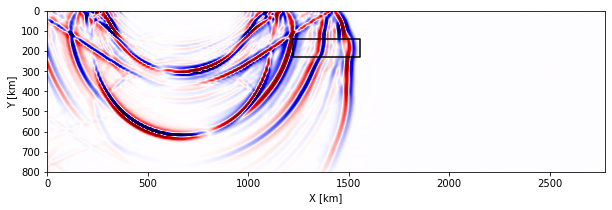

In [30]:
wavefieldfile='EVENT1/REF_SEM/wavefield0005200_01.txt'
coordinatefile='EVENT1/REF_SEM/wavefield_grid_for_dumps.txt'
filestosave='wavefield1.png'
plot_wavefield(wavefieldfile, coordinatefile,filestosave)

(637065, 2)


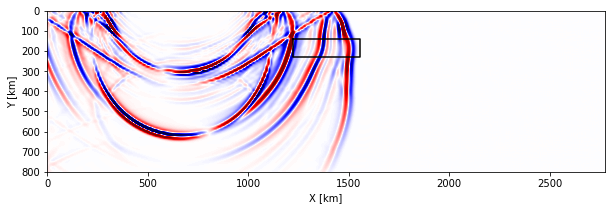

In [31]:
wavefieldfile='EVENT1/REF_SEM_smooth/wavefield0005200_01.txt'
coordinatefile='EVENT1/REF_SEM/wavefield_grid_for_dumps.txt'
filestosave='wavefield1_smooth.png'
plot_wavefield(wavefieldfile, coordinatefile,filestosave)

(637065, 2)


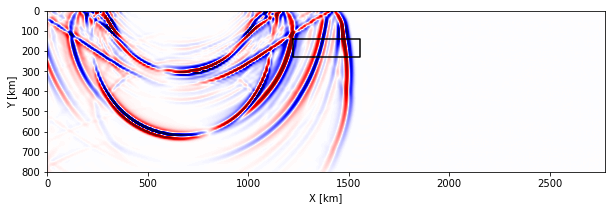

In [32]:
wavefieldfile='EVENT1/REF_SEM_SYN/wavefield0005200_01.txt'
coordinatefile='EVENT1/REF_SEM/wavefield_grid_for_dumps.txt'
filestosave='wavefield1_syn.png'
plot_wavefield(wavefieldfile, coordinatefile,filestosave)

In [12]:
wavefieldfile='EVENT1/OUTPUT_FILES/wavefield0006500_01.txt'
coordinatefile='EVENT1/OUTPUT_FILES/wavefield_grid_for_dumps.txt'
filestosave='wavefield2.png'
plot_wavefield(wavefieldfile, coordinatefile,filestosave)

OSError: EVENT1/OUTPUT_FILES/wavefield0006500_01.txt not found.

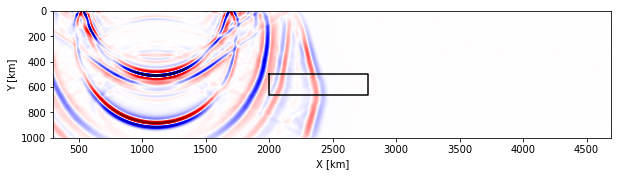

In [7]:
wavefieldfile='EVENT1/OUTPUT_FILES/wavefield0007500_01.txt'
coordinatefile='EVENT1/OUTPUT_FILES/wavefield_grid_for_dumps.txt'
filestosave='wavefield3.png'
plot_wavefield(wavefieldfile, coordinatefile,filestosave)

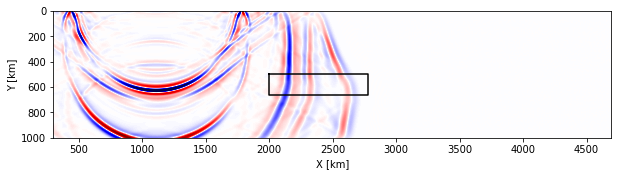

In [8]:
wavefieldfile='EVENT1/OUTPUT_FILES/wavefield0008500_01.txt'
coordinatefile='EVENT1/OUTPUT_FILES/wavefield_grid_for_dumps.txt'
filestosave='wavefield4.png'
plot_wavefield(wavefieldfile, coordinatefile,filestosave)

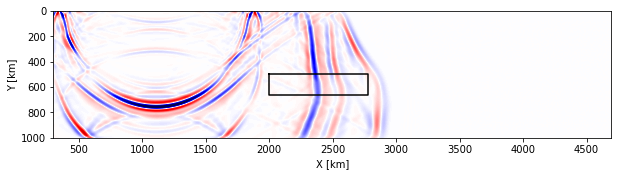

In [9]:
wavefieldfile='EVENT1/OUTPUT_FILES/wavefield0009500_01.txt'
coordinatefile='EVENT1/OUTPUT_FILES/wavefield_grid_for_dumps.txt'
filestosave='wavefield5.png'
plot_wavefield(wavefieldfile, coordinatefile,filestosave)

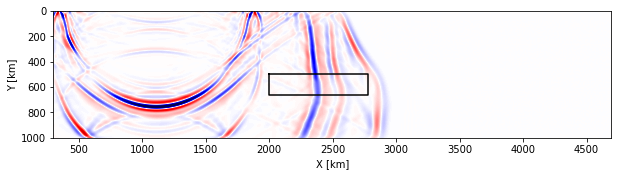

In [4]:
wavefieldfile='EVENT1/OUTPUT_FILES/wavefield0009500_01.txt'
coordinatefile='EVENT1/OUTPUT_FILES/wavefield_grid_for_dumps.txt'
filestosave='wavefield5.png'
plot_wavefield(wavefieldfile, coordinatefile,filestosave)

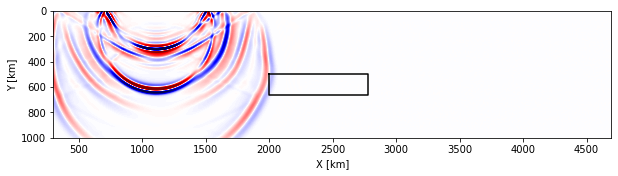

In [10]:
wavefieldfile='EVENT1/REF_SEM_SYN/wavefield0005500_01.txt'
coordinatefile='EVENT1/REF_SEM_SYN/wavefield_grid_for_dumps.txt'
filestosave='wavefield1_normal.png'
plot_wavefield(wavefieldfile, coordinatefile,filestosave)

In [5]:
def plot_wavefield_list(wavefieldfieldlist,coordinatefile,filetosave):
    timetag=np.array([4400,4800,5200,5600,6000])*0.02
    receiver_x=np.linspace(555,2220,60)
    receiver_z=1e-3*np.zeros(60)
    length=len(wavefieldfieldlist)
    plt.figure(figsize=[12, 24])
    fig, axes = plt.subplots(nrows=length, ncols=1,figsize=(10,10))
    i=0
    for ax in axes.flat:
    #for _i,name in enumerate(wavefieldfieldlist):
        wavefield=np.loadtxt(wavefieldlist[i])
        coordinate=np.loadtxt(coordinatefile)
        from scipy.interpolate import griddata
        x_show=np.arange(coordinate.T[0].min(),coordinate.T[0].max(),5000)
        y_show=np.arange(coordinate.T[1].min(),0,5000)
        M,P=np.meshgrid(x_show,y_show)
        data=griddata((coordinate.T[0],coordinate.T[1]),wavefield.T[0],(M,P),method='linear')
        #plt.subplot(length,1,_i+1)
        im = ax.imshow(data, animated=True, cmap=cm.seismic_r, interpolation='bicubic', vmin=-1e-15, vmax=1e-15,extent=[0,25*111,0,800])
        #ax.gca().invert_yaxis()
        ax.plot([11*111,14*111,14*111,11*111,11*111],[140,140,230,230,140],'black')
        #ax.plot(1110,121,'o',color='black')
        ax.plot(receiver_x,receiver_z, 'vk')
        ax.set_xlabel('X [km]')
        ax.set_ylabel('Y [km]')
        ax.set_xlim(500,2200)
        ax.set_ylim(0,420)
        ax.text(2000,390,str(timetag[i])+'s')
        i=i+1
        ax.invert_yaxis()
        #plt.colorbar( orientation='horizontal',label='Velocity field (km/s)')
    fig.colorbar(im, shrink=0.5, ax=axes.ravel().tolist(), label='Horizontal (X) Velocity Wavefield  (km/s)')
    plt.savefig(filetosave)

In [6]:
wavefieldlist=['EVENT1/REF_SEM/wavefield0004400_01.txt',\
               'EVENT1/REF_SEM/wavefield0004800_01.txt',\
               'EVENT1/REF_SEM/wavefield0005200_01.txt',\
               'EVENT1/REF_SEM/wavefield0005600_01.txt',\
               'EVENT1/REF_SEM/wavefield0006000_01.txt']
coordinatefile='EVENT1/REF_SEM_SYN/wavefield_grid_for_dumps.txt'

<Figure size 864x1728 with 0 Axes>

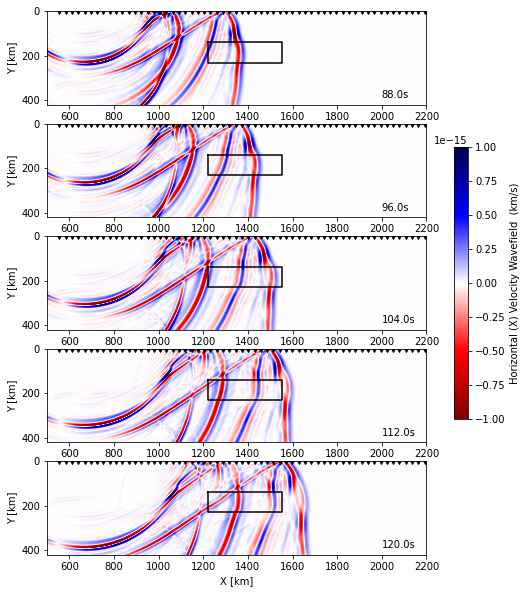

In [7]:
plot_wavefield_list(wavefieldlist,coordinatefile,'wavefield_anomaly.pdf')

In [8]:
wavefieldlist=['EVENT1/REF_SEM_SYN/wavefield0004400_01.txt',\
               'EVENT1/REF_SEM_SYN/wavefield0004800_01.txt',\
               'EVENT1/REF_SEM_SYN/wavefield0005200_01.txt',\
               'EVENT1/REF_SEM_SYN/wavefield0005600_01.txt',\
               'EVENT1/REF_SEM_SYN/wavefield0006000_01.txt']
coordinatefile='EVENT1/REF_SEM_SYN/wavefield_grid_for_dumps.txt'

<Figure size 864x1728 with 0 Axes>

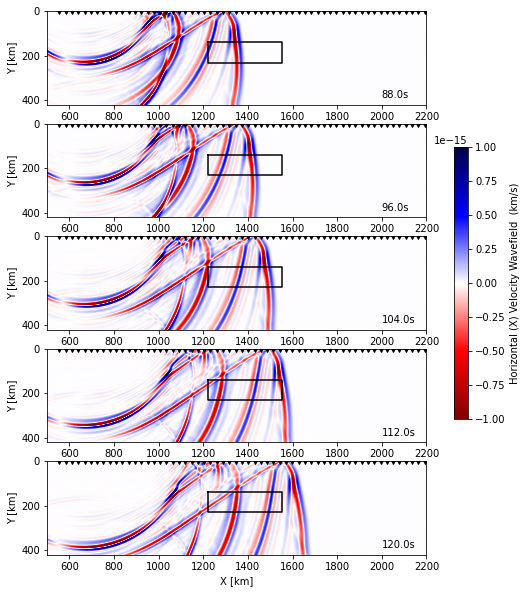

In [9]:
plot_wavefield_list(wavefieldlist,coordinatefile,'wavefield_normal.pdf')

In [10]:
wavefieldlist=['EVENT1/REF_SEM_smooth/wavefield0004400_01.txt',\
                    'EVENT1/REF_SEM_smooth/wavefield0004800_01.txt',\
                    'EVENT1/REF_SEM_smooth/wavefield0005200_01.txt',\
                    'EVENT1/REF_SEM_smooth/wavefield0005600_01.txt',\
                    'EVENT1/REF_SEM_smooth/wavefield0006000_01.txt']
coordinatefile='EVENT1/REF_SEM_SYN/wavefield_grid_for_dumps.txt'

<Figure size 864x1728 with 0 Axes>

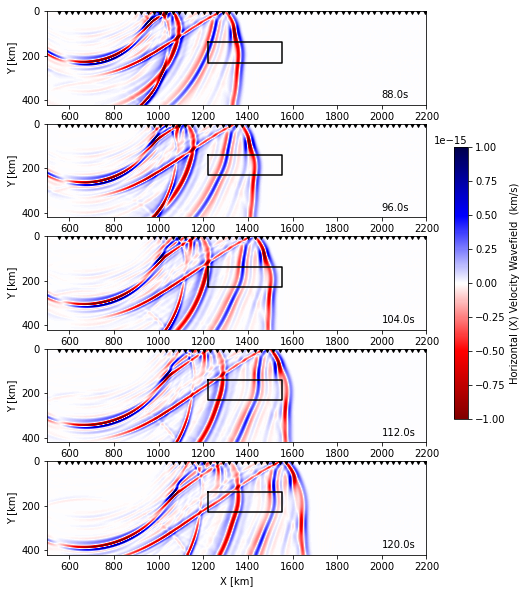

In [11]:
plot_wavefield_list(wavefieldlist,coordinatefile,'wavefield_smooth.pdf')

# plot waveforms

In [9]:
import glob

In [52]:
list_receiver_anomaly=glob.glob('EVENT1/REF_SEM/*BXZ.semd')
list_receiver_anomaly.sort()
list_receiver_normal=glob.glob('EVENT1/REF_SEM_SYN/*BXZ.semd')
list_receiver_normal.sort()

In [14]:
def readwaveform(file):
    data=np.loadtxt(file)
    time=data.T[0]
    waveform=data.T[1]
    return time,waveform

NameError: name 'list_receiver_anomaly' is not defined

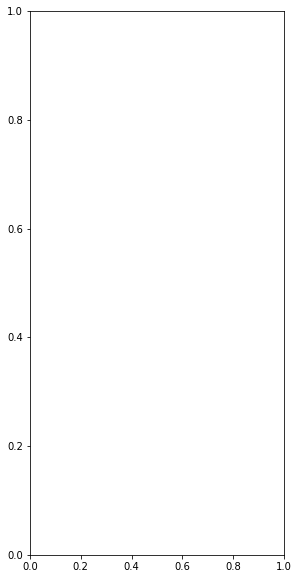

In [13]:
plt.figure(figsize=(10, 10))
receiver_x=np.linspace(555,4440,60)
src_x=1110
plt.subplot(121)
for _i, station in enumerate(list_receiver_anomaly):
    print(station)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    plt.plot(time-_i*5, waveform/waveform.max()+_i,'blue', linewidth=0.5)
    plt.plot(time-_i*5, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
    if _i > 30:
        plt.text(10,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
    plt.xlim(0,150)
    plt.xlabel('T-id*5 (s)')
    plt.ylabel('station id')
    plt.ylim(30,60)
plt.text(55,59.5, 'P')
plt.text(84,59.5, 'pP')
plt.text(102,59.5, 'sP?')
    
plt.subplot(122)
for _i, station in enumerate(list_receiver_anomaly):
    print(station)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    plt.plot(time-_i*10, waveform/waveform.max()+_i,'blue', linewidth=0.5)
    plt.plot(time-_i*10, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
    if _i > 30:
        plt.text(10,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
        plt.xlabel('T-id*10 (s)')
    plt.ylabel('station id')
    plt.xlim(0,150)
    plt.ylim(30,60)
plt.text(40,59.5, 'S')
#plt.text(60,59.5, 'pS')
plt.text(110,59.5, 'sS?')
    
plt.savefig('waveform.pdf')

555.0 1.0
EVENT1/REF_SEM/AA.S0001.BXZ.semd
583.220338983 0.745762711864
EVENT1/REF_SEM/AA.S0002.BXZ.semd
611.440677966 0.491525423729
EVENT1/REF_SEM/AA.S0003.BXZ.semd
639.661016949 0.237288135593
EVENT1/REF_SEM/AA.S0004.BXZ.semd
667.881355932 0.0169491525424
EVENT1/REF_SEM/AA.S0005.BXZ.semd
696.101694915 0.271186440678
EVENT1/REF_SEM/AA.S0006.BXZ.semd
724.322033898 0.525423728814
EVENT1/REF_SEM/AA.S0007.BXZ.semd
752.542372881 0.779661016949
EVENT1/REF_SEM/AA.S0008.BXZ.semd
780.762711864 1.03389830508
EVENT1/REF_SEM/AA.S0009.BXZ.semd
808.983050847 1.28813559322
EVENT1/REF_SEM/AA.S0010.BXZ.semd
837.203389831 1.54237288136
EVENT1/REF_SEM/AA.S0011.BXZ.semd
865.423728814 1.79661016949
EVENT1/REF_SEM/AA.S0012.BXZ.semd
893.644067797 2.05084745763
EVENT1/REF_SEM/AA.S0013.BXZ.semd
921.86440678 2.30508474576
EVENT1/REF_SEM/AA.S0014.BXZ.semd
950.084745763 2.5593220339
EVENT1/REF_SEM/AA.S0015.BXZ.semd
978.305084746 2.81355932203
EVENT1/REF_SEM/AA.S0016.BXZ.semd
1006.52542373 3.06779661017
EVENT1/R

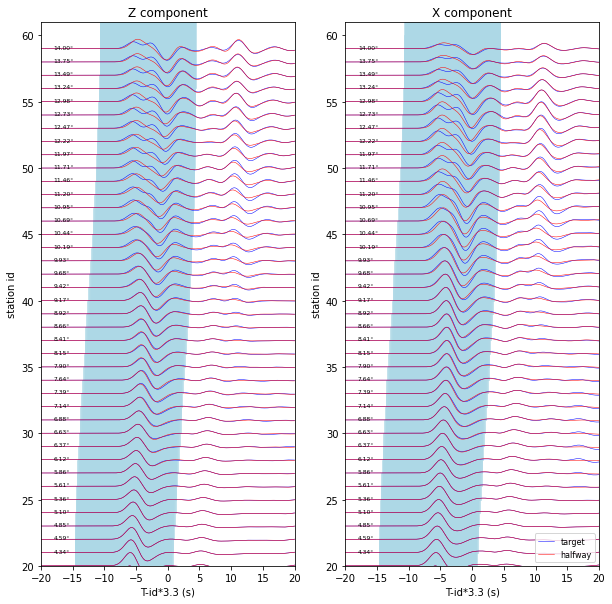

In [48]:
import glob
list_receiver_anomaly=glob.glob('EVENT1/REF_SEM/*BXZ.semd')
list_receiver_anomaly.sort()
list_receiver_normal=glob.glob('EVENT1/REF_SEM_smooth/*BXZ.semd')
list_receiver_normal.sort()
plt.figure(figsize=(10, 10))
receiver_x=np.linspace(555,2220,60)
src_x=666
plt.subplot(121)
for _i, station in enumerate(list_receiver_anomaly):
    distance=np.abs(receiver_x[_i]-src_x)/111.0
    print(receiver_x[_i],distance)
    model = TauPyModel(model="iasp91")
        # adapted 
    arrivals = model.get_travel_times(source_depth_in_km=121,distance_in_degree=distance) 
    time2=arrivals[0].time
    if time2 > 400-15 :
        wins=[]
    else:
        wins=[time2-3-6-3.3*_i,time2+12-6-3.3*_i]
    print(station)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    plt.plot(time-3.3*_i, waveform/waveform.max()+_i,'blue', linewidth=0.5)
    plt.plot(time-3.3*_i, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
    re = patches.Rectangle((wins[0], _i-1),
                               wins[1] - wins[0],
                               8,
                               color="lightblue", alpha=0.6)
    plt.gca().add_patch(re)
    if _i > 20:
        plt.text(-18,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
  #  plt.xlim(0,150)
    plt.xlabel('T-id*3.3 (s)')
    plt.ylabel('station id')
plt.title('Z component')    
plt.ylim(20,61)
plt.xlim(-20,20)

###############################################################X component
plt.subplot(122)
list_receiver_anomaly=glob.glob('EVENT1/REF_SEM/*BXX.semd')
list_receiver_anomaly.sort()
list_receiver_normal=glob.glob('EVENT1/REF_SEM_smooth/*BXX.semd')
list_receiver_normal.sort()
for _i, station in enumerate(list_receiver_anomaly):
    distance=np.abs(receiver_x[_i]-src_x)/111.0
    print(receiver_x[_i],distance)
    model = TauPyModel(model="iasp91")
        # adapted 
    arrivals = model.get_travel_times(source_depth_in_km=121,distance_in_degree=distance) 
    time2=arrivals[0].time
    if time2 > 400-15 :
        wins=[]
    else:
        wins=[time2-3-6-3.3*_i,time2+12-6-3.3*_i]
        
    print(station)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    if _i ==10:
        plt.plot(time-3.3*_i, waveform/waveform.max()+_i,'blue', linewidth=0.5,label='target')
        plt.plot(time-3.3*_i, waveform2/waveform2.max()+_i,'red',linewidth=0.5,label='halfway')
    else:
        plt.plot(time-3.3*_i, waveform/waveform.max()+_i,'blue', linewidth=0.5)
        plt.plot(time-3.3*_i, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
    re = patches.Rectangle((wins[0], _i-1),
                               wins[1] - wins[0],
                               8,
                               color="lightblue", alpha=0.6)
    plt.gca().add_patch(re)
        
    if _i > 20:
        plt.text(-18,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
  #  plt.xlim(0,150)
    plt.xlabel('T-id*3.3 (s)')
    plt.ylabel('station id')
plt.legend(loc='lower right',prop={"size":8})
plt.ylim(20,61)
plt.xlim(-20,20)
plt.title('X component') 
plt.savefig('waveform_smooth.pdf')

555.0 1.0
EVENT1/REF_SEM_smooth/AA.S0001.BXZ.semd
583.220338983 0.745762711864
EVENT1/REF_SEM_smooth/AA.S0002.BXZ.semd
611.440677966 0.491525423729
EVENT1/REF_SEM_smooth/AA.S0003.BXZ.semd
639.661016949 0.237288135593
EVENT1/REF_SEM_smooth/AA.S0004.BXZ.semd
667.881355932 0.0169491525424
EVENT1/REF_SEM_smooth/AA.S0005.BXZ.semd
696.101694915 0.271186440678
EVENT1/REF_SEM_smooth/AA.S0006.BXZ.semd
724.322033898 0.525423728814
EVENT1/REF_SEM_smooth/AA.S0007.BXZ.semd
752.542372881 0.779661016949
EVENT1/REF_SEM_smooth/AA.S0008.BXZ.semd
780.762711864 1.03389830508
EVENT1/REF_SEM_smooth/AA.S0009.BXZ.semd
808.983050847 1.28813559322
EVENT1/REF_SEM_smooth/AA.S0010.BXZ.semd
837.203389831 1.54237288136
EVENT1/REF_SEM_smooth/AA.S0011.BXZ.semd
865.423728814 1.79661016949
EVENT1/REF_SEM_smooth/AA.S0012.BXZ.semd
893.644067797 2.05084745763
EVENT1/REF_SEM_smooth/AA.S0013.BXZ.semd
921.86440678 2.30508474576
EVENT1/REF_SEM_smooth/AA.S0014.BXZ.semd
950.084745763 2.5593220339
EVENT1/REF_SEM_smooth/AA.S0015.B

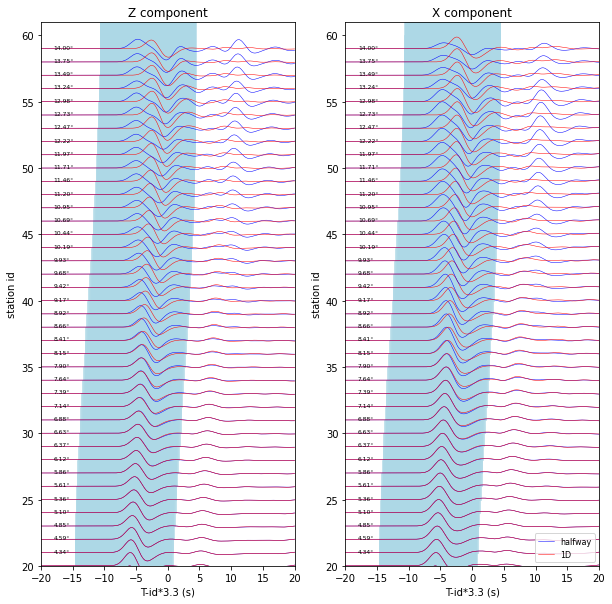

In [49]:
import glob
list_receiver_anomaly=glob.glob('EVENT1/REF_SEM_smooth/*BXZ.semd')
list_receiver_anomaly.sort()
list_receiver_normal=glob.glob('EVENT1/REF_SEM_SYN/*BXZ.semd')
list_receiver_normal.sort()
plt.figure(figsize=(10, 10))
receiver_x=np.linspace(555,2220,60)
src_x=666
plt.subplot(121)
for _i, station in enumerate(list_receiver_anomaly):
    distance=np.abs(receiver_x[_i]-src_x)/111.0
    print(receiver_x[_i],distance)
    model = TauPyModel(model="iasp91")
        # adapted 
    arrivals = model.get_travel_times(source_depth_in_km=121,distance_in_degree=distance) 
    time2=arrivals[0].time
    if time2 > 400-15 :
        wins=[]
    else:
        wins=[time2-3-6-3.3*_i,time2+12-6-3.3*_i]
    print(station)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    plt.plot(time-3.3*_i, waveform/waveform.max()+_i,'blue', linewidth=0.5)
    plt.plot(time-3.3*_i, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
    re = patches.Rectangle((wins[0], _i-1),
                               wins[1] - wins[0],
                               8,
                               color="lightblue", alpha=0.6)
    plt.gca().add_patch(re)
    
    if _i > 20:
        plt.text(-18,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
  #  plt.xlim(0,150)
    plt.xlabel('T-id*3.3 (s)')
    plt.ylabel('station id')
plt.title('Z component')    
plt.ylim(20,61)
plt.xlim(-20,20)

###############################################################X component
plt.subplot(122)
list_receiver_anomaly=glob.glob('EVENT1/REF_SEM_smooth/*BXX.semd')
list_receiver_anomaly.sort()
list_receiver_normal=glob.glob('EVENT1/REF_SEM_SYN/*BXX.semd')
list_receiver_normal.sort()
for _i, station in enumerate(list_receiver_anomaly):
    distance=np.abs(receiver_x[_i]-src_x)/111.0
    print(receiver_x[_i],distance)
    model = TauPyModel(model="iasp91")
        # adapted 
    arrivals = model.get_travel_times(source_depth_in_km=121,distance_in_degree=distance) 
    time2=arrivals[0].time
    if time2 > 400-15 :
        wins=[]
    else:
        wins=[time2-3-6-3.3*_i,time2+12-6-3.3*_i]
        
    print(station)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    if _i ==10:
        plt.plot(time-3.3*_i, waveform/waveform.max()+_i,'blue', linewidth=0.5,label='halfway')
        plt.plot(time-3.3*_i, waveform2/waveform2.max()+_i,'red',linewidth=0.5,label='1D')
    else:
        plt.plot(time-3.3*_i, waveform/waveform.max()+_i,'blue', linewidth=0.5)
        plt.plot(time-3.3*_i, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
    re = patches.Rectangle((wins[0], _i-1),
                               wins[1] - wins[0],
                               8,
                               color="lightblue", alpha=0.6)
    plt.gca().add_patch(re)
    
        
    if _i > 20:
        plt.text(-18,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
  #  plt.xlim(0,150)
    plt.xlabel('T-id*3.3 (s)')
    plt.ylabel('station id')
plt.legend(loc='lower right',prop={"size":8})
plt.ylim(20,61)
plt.xlim(-20,20)
plt.title('X component') 
plt.savefig('waveform_smoothvs1d.pdf')

555.0 1.0
EVENT1/REF_SEM/AA.S0001.BXZ.semd [13.091948539355158, 28.091948539355158]
583.220338983 0.745762711864
EVENT1/REF_SEM/AA.S0002.BXZ.semd [7.5003868555986388, 22.500386855598638]
611.440677966 0.491525423729
EVENT1/REF_SEM/AA.S0003.BXZ.semd [2.3854574860423359, 17.385457486042334]
639.661016949 0.237288135593
EVENT1/REF_SEM/AA.S0004.BXZ.semd [-2.0819732979132901, 12.91802670208671]
667.881355932 0.0169491525424
EVENT1/REF_SEM/AA.S0005.BXZ.semd [-5.752337118402572, 9.247662881597428]
696.101694915 0.271186440678
EVENT1/REF_SEM/AA.S0006.BXZ.semd [-8.5697486591259775, 6.4302513408740225]
724.322033898 0.525423728814
EVENT1/REF_SEM/AA.S0007.BXZ.semd [-10.606155177354267, 4.3938448226457325]
752.542372881 0.779661016949
EVENT1/REF_SEM/AA.S0008.BXZ.semd [-12.018077775533449, 2.9819222244665546]
780.762711864 1.03389830508
EVENT1/REF_SEM/AA.S0009.BXZ.semd [-12.974701316312721, 2.0252986836872751]
808.983050847 1.28813559322
EVENT1/REF_SEM/AA.S0010.BXZ.semd [-13.615077989370597, 1.3849

1514.49152542 7.64406779661
EVENT1/REF_SEM/AA.S0035.BXX.semd
1542.71186441 7.89830508475
EVENT1/REF_SEM/AA.S0036.BXX.semd
1570.93220339 8.15254237288
EVENT1/REF_SEM/AA.S0037.BXX.semd
1599.15254237 8.40677966102
EVENT1/REF_SEM/AA.S0038.BXX.semd
1627.37288136 8.66101694915
EVENT1/REF_SEM/AA.S0039.BXX.semd
1655.59322034 8.91525423729
EVENT1/REF_SEM/AA.S0040.BXX.semd
1683.81355932 9.16949152542
EVENT1/REF_SEM/AA.S0041.BXX.semd
1712.03389831 9.42372881356
EVENT1/REF_SEM/AA.S0042.BXX.semd
1740.25423729 9.67796610169
EVENT1/REF_SEM/AA.S0043.BXX.semd
1768.47457627 9.93220338983
EVENT1/REF_SEM/AA.S0044.BXX.semd
1796.69491525 10.186440678
EVENT1/REF_SEM/AA.S0045.BXX.semd
1824.91525424 10.4406779661
EVENT1/REF_SEM/AA.S0046.BXX.semd
1853.13559322 10.6949152542
EVENT1/REF_SEM/AA.S0047.BXX.semd
1881.3559322 10.9491525424
EVENT1/REF_SEM/AA.S0048.BXX.semd
1909.57627119 11.2033898305
EVENT1/REF_SEM/AA.S0049.BXX.semd
1937.79661017 11.4576271186
EVENT1/REF_SEM/AA.S0050.BXX.semd
1966.01694915 11.711864406

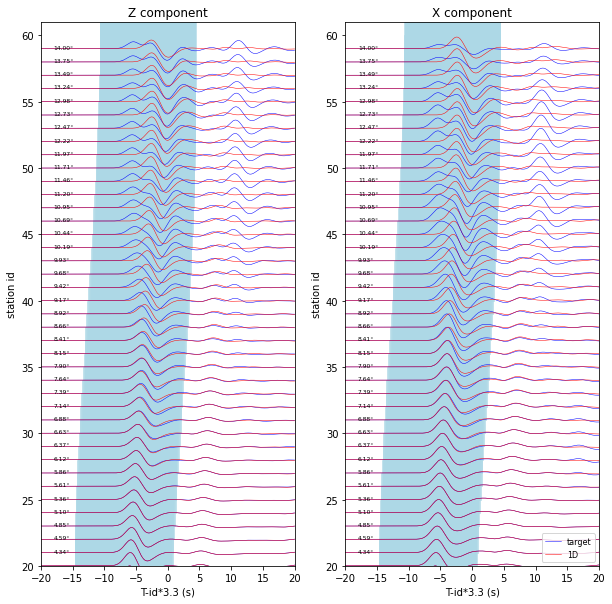

In [50]:
import glob
from obspy.taup import TauPyModel
import matplotlib.patches as patches
#receiver_station,receiver_net,receiver_x,receiver_z=read_receiver('EVENT1/DATA/STATIONS')
#source_x,source_depth_in_m=read_source('EVENT1/DATA/SOURCE')
list_receiver_anomaly=glob.glob('EVENT1/REF_SEM/*BXZ.semd')
list_receiver_anomaly.sort()
list_receiver_normal=glob.glob('EVENT1/REF_SEM_SYN/*BXZ.semd')
list_receiver_normal.sort()
plt.figure(figsize=(10, 10))
receiver_x=np.linspace(555,2220,60)
src_x=666
plt.subplot(121)

for _i, station in enumerate(list_receiver_anomaly):
    distance=np.abs(receiver_x[_i]-src_x)/111.0
    print(receiver_x[_i],distance)
    model = TauPyModel(model="iasp91")
        # adapted 
    arrivals = model.get_travel_times(source_depth_in_km=121,distance_in_degree=distance) 
    time2=arrivals[0].time
    if time2 > 400-15 :
        wins=[]
    else:
        wins=[time2-3-6-3.3*_i,time2+12-6-3.3*_i]
  
    print(station,wins)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    
    plt.plot(time-3.3*_i, waveform/waveform.max()+_i,'blue', linewidth=0.5)
    plt.plot(time-3.3*_i, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
    re = patches.Rectangle((wins[0], _i-1),
                               wins[1] - wins[0],
                               8,
                               color="lightblue", alpha=0.6)
    plt.gca().add_patch(re)
    
    if _i > 20:
        plt.text(-18,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
  #  plt.xlim(0,150)
    plt.xlabel('T-id*3.3 (s)')
    plt.ylabel('station id')
plt.title('Z component')    
plt.ylim(20,61)
plt.xlim(-20,20)

###############################################################X component
plt.subplot(122)
list_receiver_anomaly=glob.glob('EVENT1/REF_SEM/*BXX.semd')
list_receiver_anomaly.sort()
list_receiver_normal=glob.glob('EVENT1/REF_SEM_SYN/*BXX.semd')
list_receiver_normal.sort()
for _i, station in enumerate(list_receiver_anomaly):
    distance=np.abs(receiver_x[_i]-src_x)/111.0
    print(receiver_x[_i],distance)
    model = TauPyModel(model="iasp91")
        # adapted 
    arrivals = model.get_travel_times(source_depth_in_km=121,distance_in_degree=distance) 
    time2=arrivals[0].time
    if time2 > 400-15 :
        wins=[]
    else:
        wins=[time2-3-6-3.3*_i,time2+12-6-3.3*_i]
    print(station)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    if _i ==10:
        plt.plot(time-3.3*_i, waveform/waveform.max()+_i,'blue', linewidth=0.5,label='target')
        plt.plot(time-3.3*_i, waveform2/waveform2.max()+_i,'red',linewidth=0.5,label='1D')
    else:
        plt.plot(time-3.3*_i, waveform/waveform.max()+_i,'blue', linewidth=0.5)
        plt.plot(time-3.3*_i, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
        
    if _i > 20:
        plt.text(-18,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
  #  plt.xlim(0,150)
    plt.xlabel('T-id*3.3 (s)')
    plt.ylabel('station id')
    re = patches.Rectangle((wins[0], _i-1),
                               wins[1] - wins[0],
                               8,
                               color="lightblue", alpha=0.6)
    plt.gca().add_patch(re)
plt.legend(loc='lower right',prop={"size":8})
plt.ylim(20,61)
plt.xlim(-20,20)
plt.title('X component') 
plt.savefig('waveform_anomalyvs1d.pdf')

EVENT1/REF_SEM_smooth/AA.S0001.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0002.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0003.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0004.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0005.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0006.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0007.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0008.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0009.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0010.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0011.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0012.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0013.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0014.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0015.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0016.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0017.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0018.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0019.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0020.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0021.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0022.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0023.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0024.BXX.semd
EVENT1/REF_SEM_smooth/AA.S0025.BXX.semd


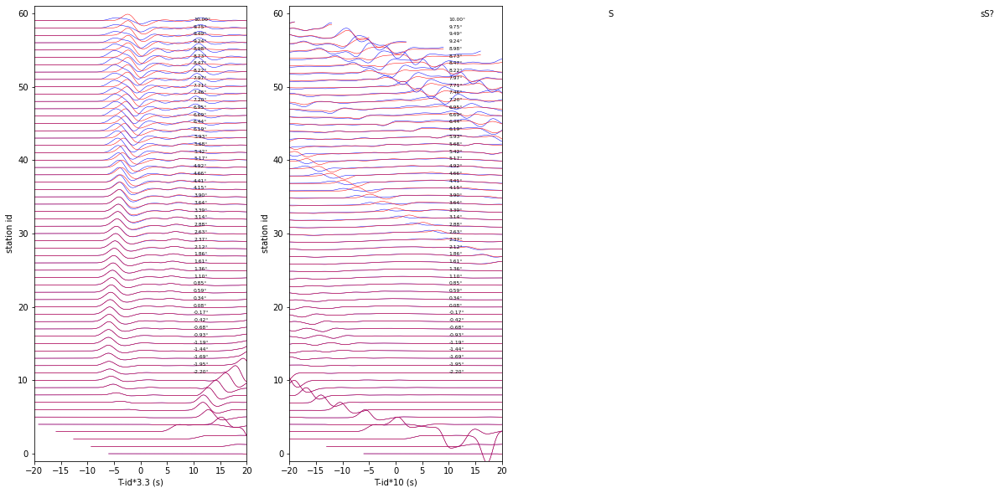

In [6]:
import glob
list_receiver_anomaly=glob.glob('EVENT1/REF_SEM_smooth/*BXX.semd')
list_receiver_anomaly.sort()
list_receiver_normal=glob.glob('EVENT1/REF_SEM_SYN/*BXX.semd')
list_receiver_normal.sort()
plt.figure(figsize=(10, 10))
receiver_x=np.linspace(555,2220,60)
src_x=1110
plt.subplot(121)
for _i, station in enumerate(list_receiver_anomaly):
    print(station)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    plt.plot(time-3.3*_i, waveform/waveform.max()+_i,'blue', linewidth=0.5)
    plt.plot(time-3.3*_i, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
    if _i > 10:
        plt.text(10,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
  #  plt.xlim(0,150)
    plt.xlabel('T-id*3.3 (s)')
    plt.ylabel('station id')
    
plt.ylim(-1,61)
plt.xlim(-20,20)

plt.subplot(122)
for _i, station in enumerate(list_receiver_anomaly):
    print(station)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    plt.plot(time-_i*7, waveform/waveform.max()+_i,'blue', linewidth=0.5)
    plt.plot(time-_i*7, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
    if _i > 10:
        plt.text(10,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
        plt.xlabel('T-id*10 (s)')
    plt.ylabel('station id')
   # plt.xlim(0,150)
plt.ylim(-1,61)
plt.xlim(-15,30)
plt.text(40,59.5, 'S')
#plt.text(60,59.5, 'pS')
plt.text(110,59.5, 'sS?')

    
plt.savefig('waveform_smoothvshomo.pdf')

EVENT1/REF_SEM/AA.S0001.BXZ.semd
EVENT1/REF_SEM/AA.S0002.BXZ.semd
EVENT1/REF_SEM/AA.S0003.BXZ.semd
EVENT1/REF_SEM/AA.S0004.BXZ.semd
EVENT1/REF_SEM/AA.S0005.BXZ.semd
EVENT1/REF_SEM/AA.S0006.BXZ.semd
EVENT1/REF_SEM/AA.S0007.BXZ.semd
EVENT1/REF_SEM/AA.S0008.BXZ.semd
EVENT1/REF_SEM/AA.S0009.BXZ.semd
EVENT1/REF_SEM/AA.S0010.BXZ.semd
EVENT1/REF_SEM/AA.S0011.BXZ.semd
EVENT1/REF_SEM/AA.S0012.BXZ.semd
EVENT1/REF_SEM/AA.S0013.BXZ.semd
EVENT1/REF_SEM/AA.S0014.BXZ.semd
EVENT1/REF_SEM/AA.S0015.BXZ.semd
EVENT1/REF_SEM/AA.S0016.BXZ.semd
EVENT1/REF_SEM/AA.S0017.BXZ.semd
EVENT1/REF_SEM/AA.S0018.BXZ.semd
EVENT1/REF_SEM/AA.S0019.BXZ.semd
EVENT1/REF_SEM/AA.S0020.BXZ.semd
EVENT1/REF_SEM/AA.S0021.BXZ.semd
EVENT1/REF_SEM/AA.S0022.BXZ.semd
EVENT1/REF_SEM/AA.S0023.BXZ.semd
EVENT1/REF_SEM/AA.S0024.BXZ.semd
EVENT1/REF_SEM/AA.S0025.BXZ.semd
EVENT1/REF_SEM/AA.S0026.BXZ.semd
EVENT1/REF_SEM/AA.S0027.BXZ.semd
EVENT1/REF_SEM/AA.S0028.BXZ.semd
EVENT1/REF_SEM/AA.S0029.BXZ.semd
EVENT1/REF_SEM/AA.S0030.BXZ.semd
EVENT1/REF

Text(110, 59.5, 'sS?')

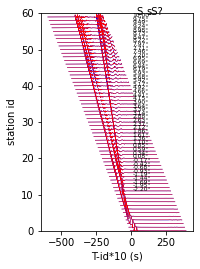

In [28]:
plt.subplot(122)
for _i, station in enumerate(list_receiver_anomaly):
    print(station)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    plt.plot(time-_i*10, waveform/waveform.max()+_i,'blue', linewidth=0.5)
    plt.plot(time-_i*10, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
    if _i > 10:
        plt.text(10,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
        plt.xlabel('T-id*10 (s)')
    plt.ylabel('station id')
   # plt.xlim(0,150)
    plt.ylim(0,60)
plt.text(40,59.5, 'S')
#plt.text(60,59.5, 'pS')
plt.text(110,59.5, 'sS?')

In [17]:
import glob
list_receiver_anomaly=glob.glob('EVENT1/REF_SEM_smooth/*BXZ.semd')
list_receiver_anomaly.sort()
list_receiver_normal=glob.glob('EVENT1/REF_SEM_SYN/*BXZ.semd')
list_receiver_normal.sort()

In [18]:
list_receiver_normal

['EVENT1/REF_SEM_SYN/AA.S0001.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0002.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0003.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0004.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0005.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0006.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0007.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0008.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0009.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0010.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0011.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0012.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0013.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0014.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0015.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0016.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0017.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0018.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0019.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0020.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0021.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0022.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0023.BXZ.semd',
 'EVENT1/REF_SEM_SYN/AA.S0024.BXZ.semd',
 'EVENT1/REF_SEM

EVENT1/REF_SEM_smooth/AA.S0001.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0002.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0003.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0004.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0005.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0006.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0007.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0008.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0009.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0010.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0011.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0012.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0013.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0014.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0015.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0016.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0017.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0018.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0019.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0020.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0021.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0022.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0023.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0024.BXZ.semd
EVENT1/REF_SEM_smooth/AA.S0025.BXZ.semd


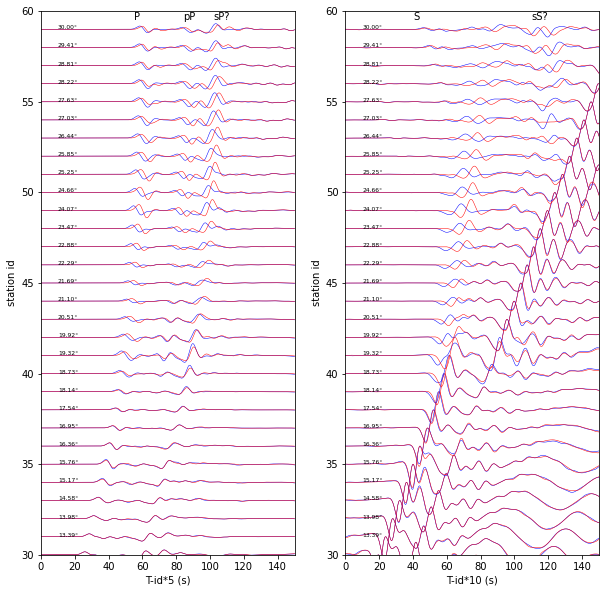

In [19]:
plt.figure(figsize=(10, 10))
receiver_x=np.linspace(555,4440,60)
src_x=1110
plt.subplot(121)
for _i, station in enumerate(list_receiver_anomaly):
    print(station)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    plt.plot(time-_i*5, waveform/waveform.max()+_i,'blue', linewidth=0.5)
    plt.plot(time-_i*5, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
    if _i > 30:
        plt.text(10,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
    plt.xlim(0,150)
    plt.xlabel('T-id*5 (s)')
    plt.ylabel('station id')
    plt.ylim(30,60)
plt.text(55,59.5, 'P')
plt.text(84,59.5, 'pP')
plt.text(102,59.5, 'sP?')
    
plt.subplot(122)
for _i, station in enumerate(list_receiver_anomaly):
    print(station)
    time, waveform=readwaveform(list_receiver_anomaly[_i])
    time, waveform2=readwaveform(list_receiver_normal[_i])
    plt.plot(time-_i*10, waveform/waveform.max()+_i,'blue', linewidth=0.5)
    plt.plot(time-_i*10, waveform2/waveform2.max()+_i,'red',linewidth=0.5)
    if _i > 30:
        plt.text(10,_i, "{:0.2f}°".format((receiver_x[_i]-src_x)/111), fontsize=6)
        plt.xlabel('T-id*10 (s)')
    plt.ylabel('station id')
    plt.xlim(0,150)
    plt.ylim(30,60)
plt.text(40,59.5, 'S')
#plt.text(60,59.5, 'pS')
plt.text(110,59.5, 'sS?')
    
plt.savefig('waveform_smooth_normal.pdf')

# plot comparison of the misfit and adjoint sources. 

In [2]:
import pyadjoint

In [4]:
def adj_calculate(dir_run,dir_event,dir_obs,dir_syn,adj_src_type,stationpath):
    import obspy
    import pyadjoint
    import numpy as np
    from obspy.taup import TauPyModel
    from obspy.core.trace import Trace
    ##guarantee to change back to the project directory
    os.chdir(dir_run)
    os.chdir(dir_event) 
    ##### read source locations
    source_x,source_depth_in_m=read_source('DATA/SOURCE')
    ##### read receiver locations
    receiver_station,receiver_net,receiver_x,receiver_z=read_receiver('DATA/STATIONS')
    import toml
    Misfits_all=0.0
    fh = open(dir_syn+'misfit.txt','w')
    
    for i, station_name in enumerate(receiver_station):
        #print(i)
        #print(np.int(i))
        distance=np.abs(receiver_x[i]-source_x)/111.0/1000.0
        model = TauPyModel(model="iasp91")
        # adapted 
        arrivals = model.get_travel_times(source_depth_in_km=-source_depth_in_m/1000,distance_in_degree=distance) 
        time=arrivals[0].time
        if time > 400-15:
            window=[]
        else:
            window=[[time-8,time+25]]
        print(window)
        network=receiver_net[i]
        station=receiver_station[i]
        data_hetero=np.loadtxt(dir_syn+network+'.'+station+'.BXZ'+'.semd')
        data_hetero_new=data_hetero.swapaxes(0,1)
    #from obspy.core.trace import Trace
        tr=Trace(data=data_hetero_new[1])
        tr.stats.delta=0.02  ###here should be adapted to the DATA/Par_file
        tr.stats.network = network
        tr.stats.station = station
        tr.stats.channel = 'BXZ'
        data_hetero_obs=np.loadtxt(dir_obs+network+'.'+station+'.BXZ'+'.semd')                           
        data_hetero_new_obs=data_hetero_obs.swapaxes(0,1)
        tr_obs=Trace(data=data_hetero_new_obs[1])
        tr_obs.stats.delta=0.02
        tr_obs.stats.network = network
        tr_obs.stats.station = station
        tr_obs.stats.channel = 'BXZ'
        ###here input a minum and maximum period
        configure=pyadjoint.config.Config(10,120,measure_type='dt')
        print(network, station)
        adj=pyadjoint.calculate_adjoint_source(
        adj_src_type=adj_src_type, observed=tr_obs, synthetic=tr,min_period=5, max_period=100, config=configure, window=window, plot=True );
        Misfits_all+=adj.misfit
        #fh.write(network+ ' ' + station+ ' '+ ' ' + str(adj.misfit))
        #toml.dump(adj.misfit, fh)
        adj.write(filename='SEM/'+network+'.'+station+'.BXZ'+'.adj',format="SPECFEM", time_offset=-12)
    fh.write(dir_syn+' ' + dir_event +' ' + str(Misfits_all)+"\n")
    fh.close()
    os.chdir(dir_run)
def read_source(dir_source):
    file1 = open(dir_source, 'r')
    Lines = file1.readlines()
    x=np.float(Lines[2].split('=')[1].split('#')[0])
    z=np.float(Lines[3].split('=')[1].split('#')[0])
    return x,z
def read_receiver(dir_receiver):
    import re
    file1 = open(dir_receiver, 'r')
    Lines = file1.readlines()
    number=len(Lines)
    receiver_station=[]
    receiver_net=[]
    receiver_x=np.zeros(number)
    receiver_z=np.zeros(number)
    for _i, line in enumerate(Lines):
        station,network,x,z,nun,nun=re.findall(r'\S+', line)
        #print(station)
        receiver_station.append(station)
        receiver_net.append(network)
        receiver_x[_i]=np.float(x)
        receiver_z[_i]=np.float(z)
    return receiver_station,receiver_net,receiver_x,receiver_z

[[64.931682194878661, 97.931682194878661]]
AA S0001
1.00000007268


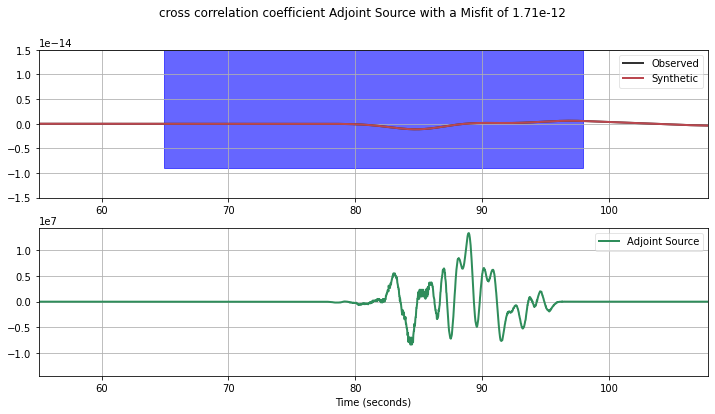

1.71029856944e-12
[[56.968614525035761, 89.968614525035761]]
AA S0002
1.00000012424


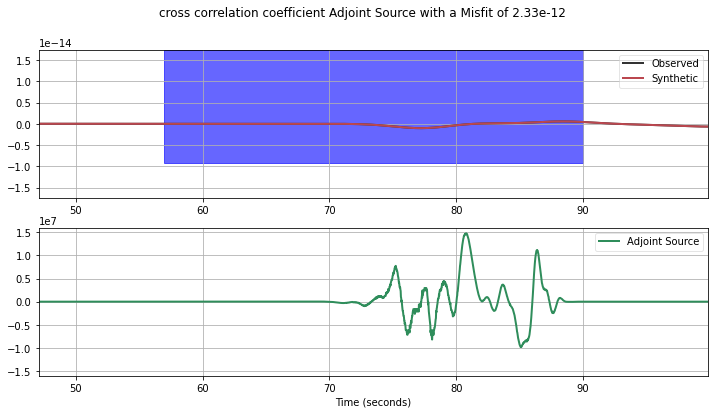

2.33357777546e-12
[[49.045958950547487, 82.045958950547487]]
AA S0003
1.00000032461


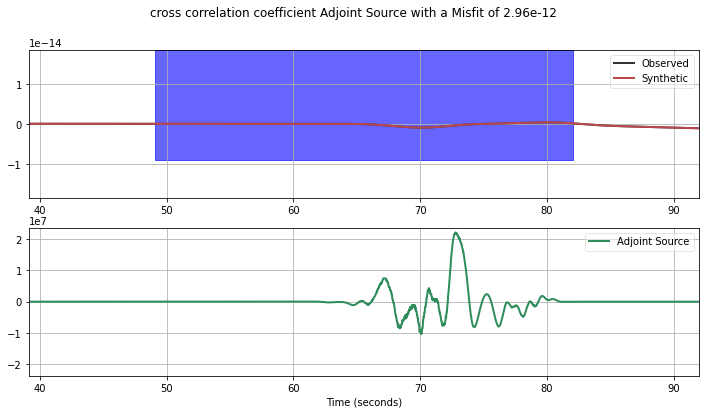

2.96396240884e-12
[[41.188207002335105, 74.188207002335105]]
AA S0004
1.00000013426


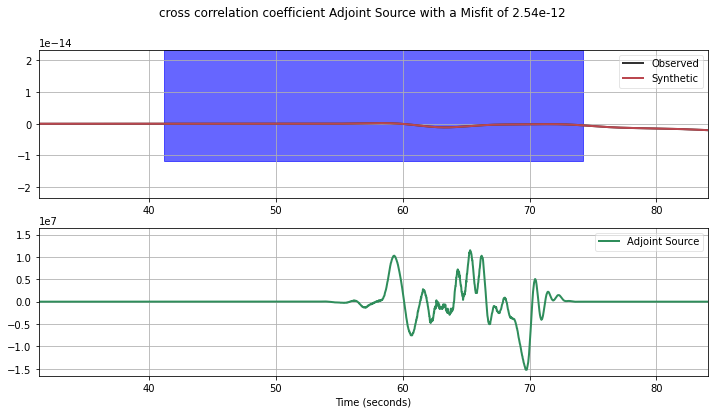

2.5429658379e-12
[[33.441285028256871, 66.441285028256871]]
AA S0005
0.999999879326


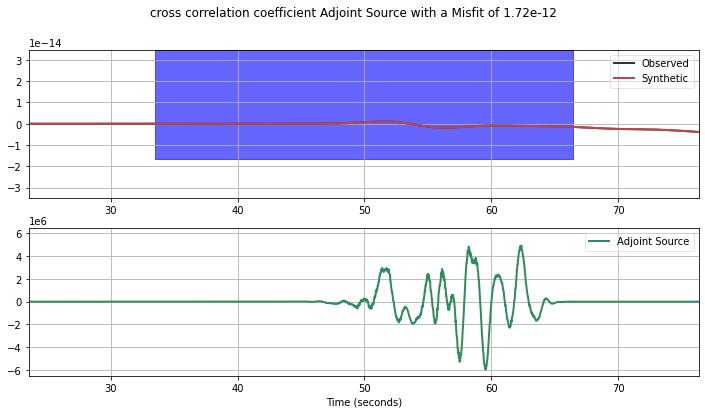

1.72128977738e-12
[[25.901001596526484, 58.901001596526484]]
AA S0006
0.999999764482


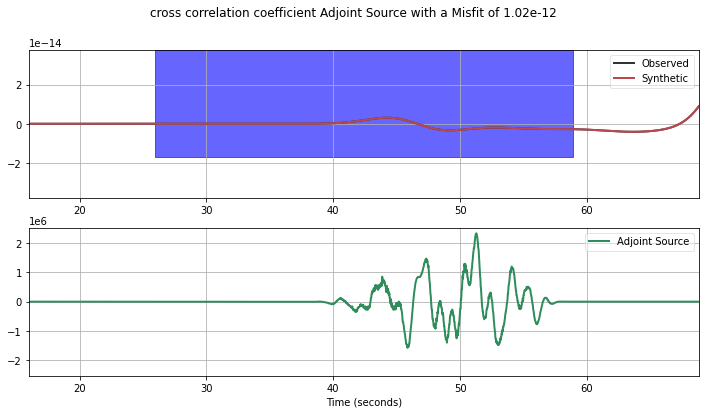

1.01985087042e-12
[[18.789396418444827, 51.789396418444824]]
AA S0007
0.999999909186


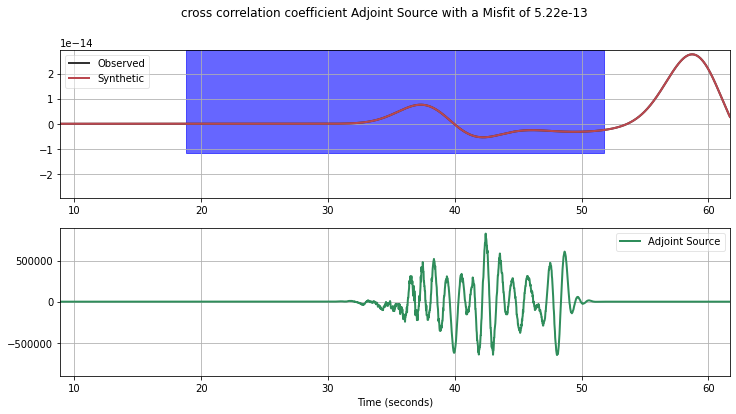

5.22137888481e-13
[[12.668750701702812, 45.668750701702812]]
AA S0008
0.999999764655


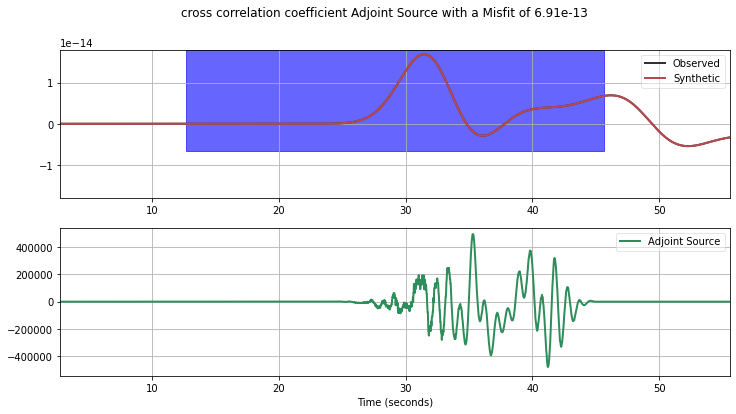

6.91113832829e-13
[[8.872367957285924, 41.872367957285924]]
AA S0009
0.999999940315


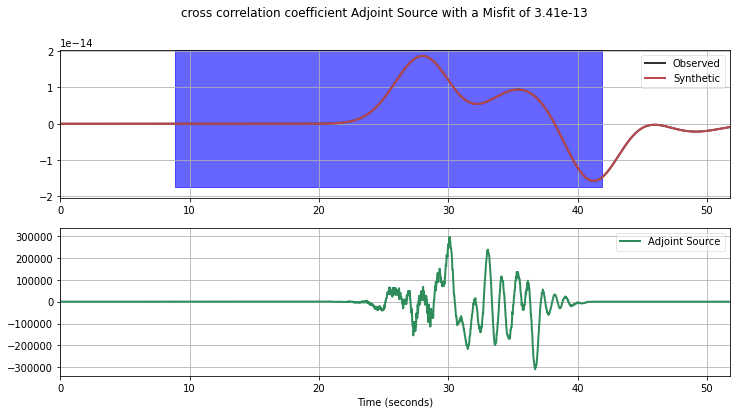

3.4128255777e-13
[[9.1964102017034008, 42.196410201703401]]
AA S0010
1.00000017481


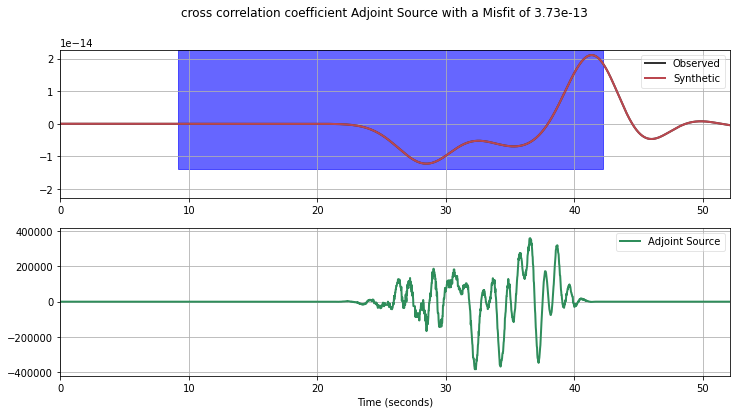

3.73256980879e-13
[[13.44310352760726, 46.443103527607263]]
AA S0011
1.00000011829


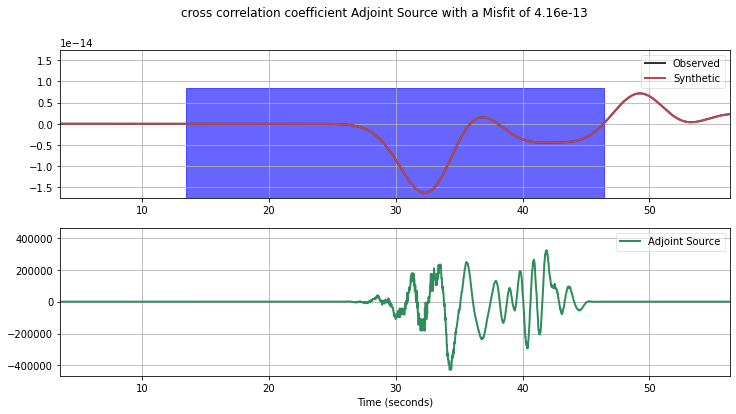

4.15778522722e-13
[[19.763749351428846, 52.763749351428842]]
AA S0012
1.00000007924


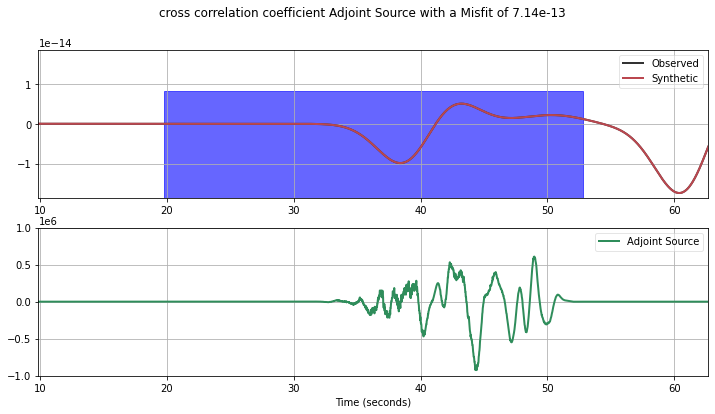

7.14428516346e-13
[[26.9593382632249, 59.9593382632249]]
AA S0013
1.00000031533


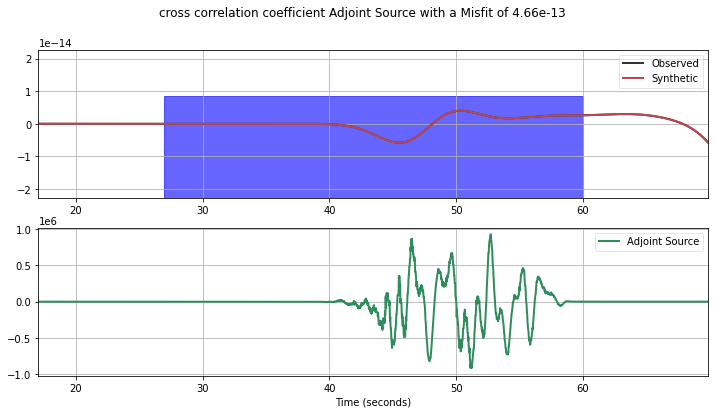

4.66071625738e-13
[[34.538578336728634, 67.538578336728634]]
AA S0014
1.0000004588


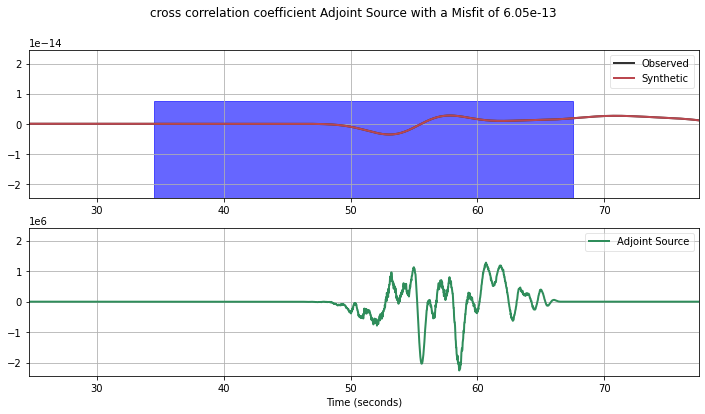

6.04960526118e-13
[[42.305314003568114, 75.305314003568114]]
AA S0015
1.00000045772


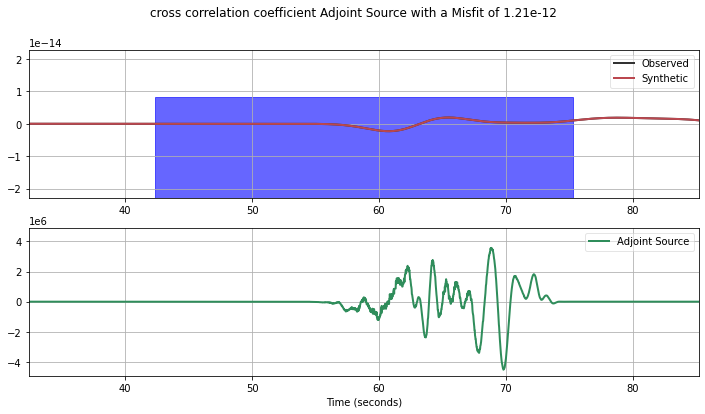

1.20670140547e-12
[[50.17448281616079, 83.17448281616079]]
AA S0016
1.00000064482


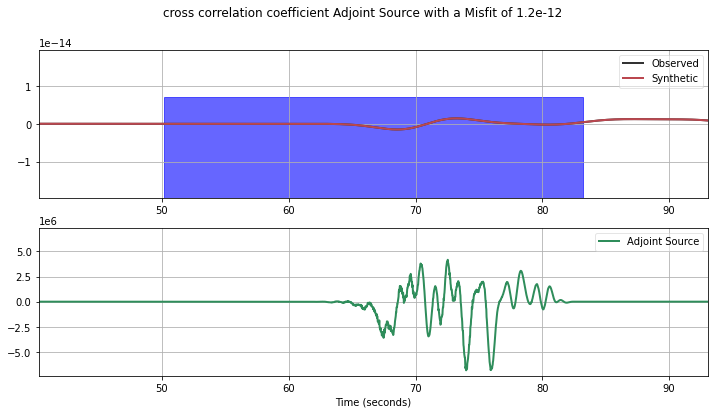

1.20325971409e-12
[[58.104118295881179, 91.104118295881179]]
AA S0017
1.00000063447


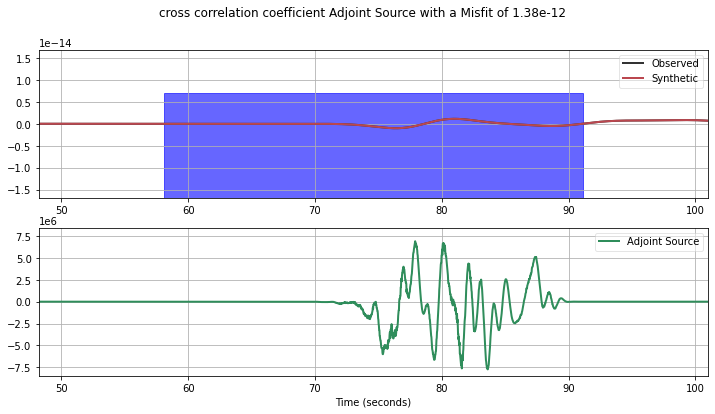

1.3796741527e-12
[[66.071757784638635, 99.071757784638635]]
AA S0018
1.00000044302


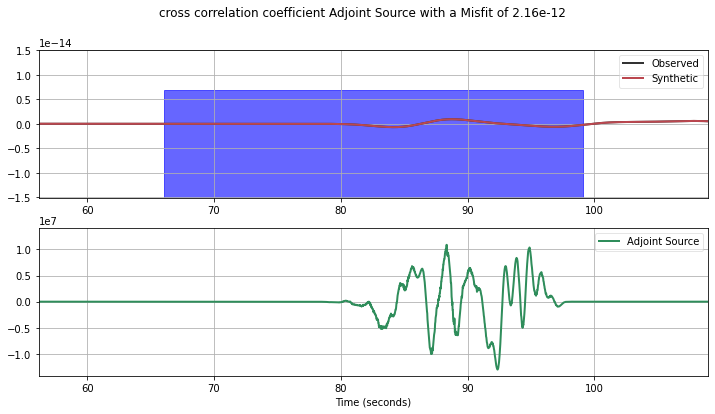

2.16193729585e-12
[[74.064207786582159, 107.06420778658216]]
AA S0019
1.00000096933


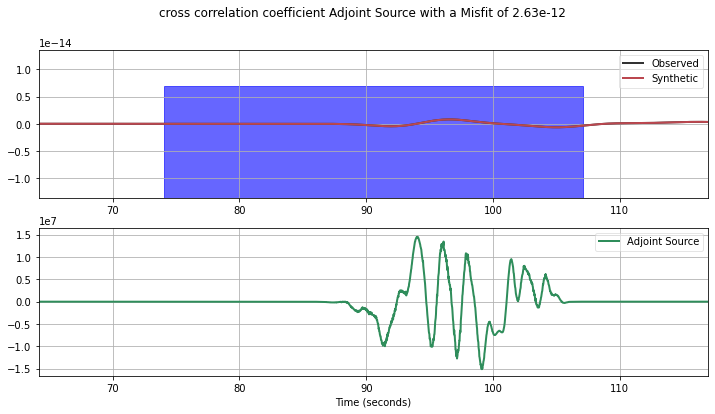

2.63367105902e-12
[[82.073488500080359, 115.07348850008036]]
AA S0020
1.00000090493


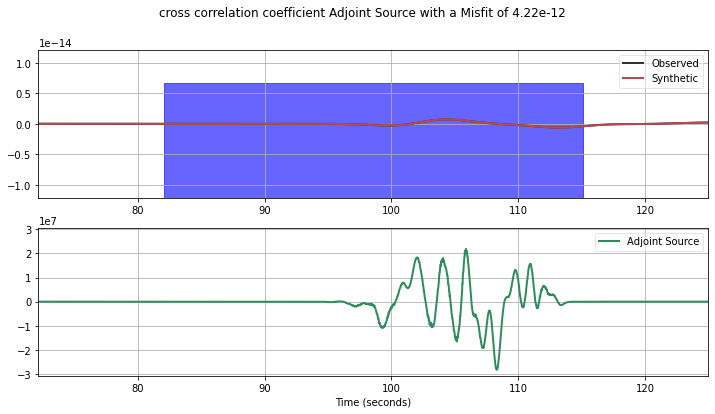

4.2152947799e-12
[[90.094122383223336, 123.09412238322334]]
AA S0021
1.0000008058


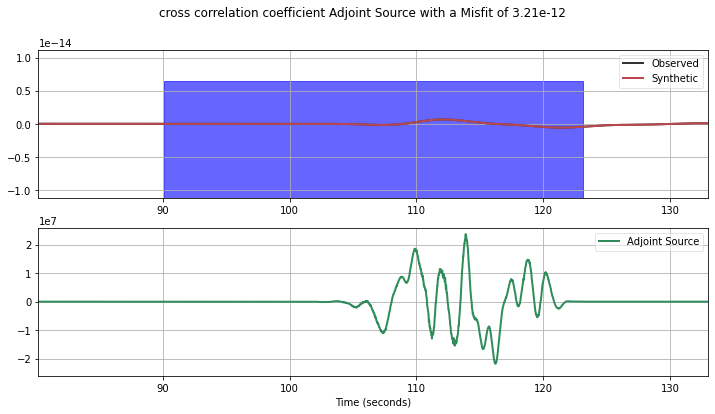

3.21098703182e-12
[[98.122416813493572, 131.12241681349357]]
AA S0022
1.00000080984


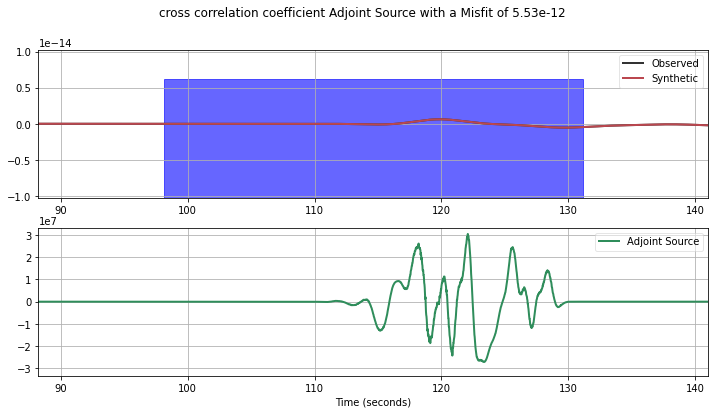

5.53335155473e-12
[[106.15560248039969, 139.15560248039969]]
AA S0023
1.00000073569


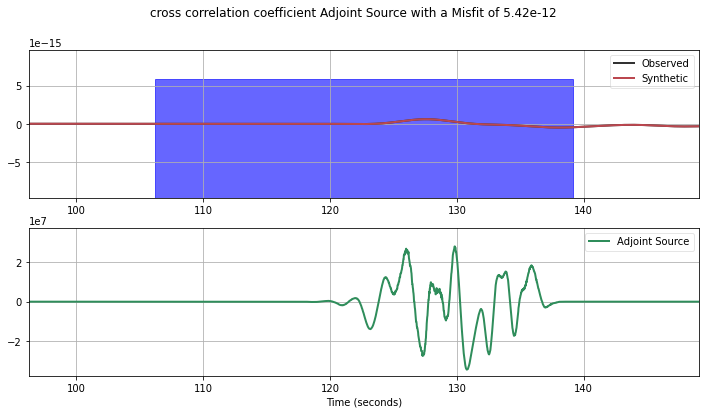

5.42155209615e-12
[[114.19096912726654, 147.19096912726656]]
AA S0024
1.00000057485


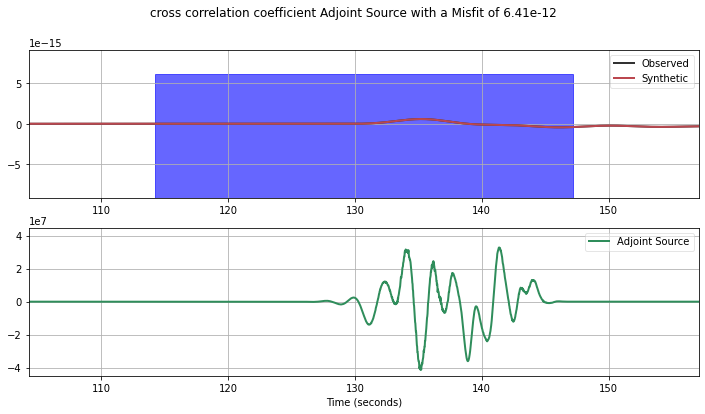

6.41209307872e-12
[[122.1998217811215, 155.1998217811215]]
AA S0025
1.00000017611


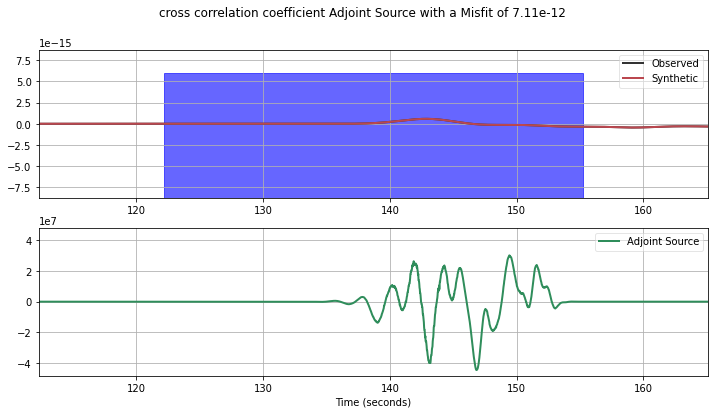

7.10820291516e-12
[[130.16728303744952, 163.16728303744952]]
AA S0026
0.99999979898


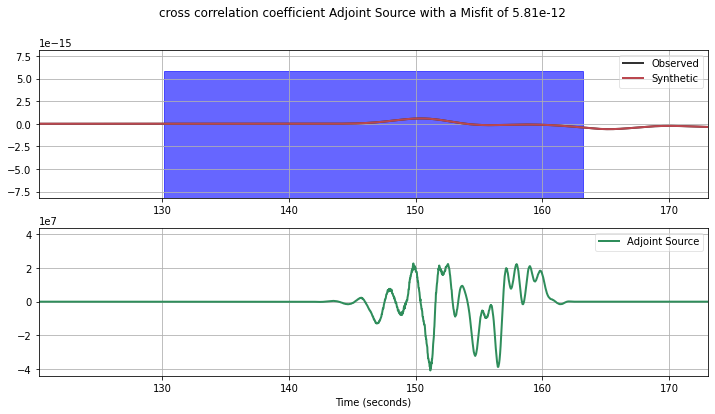

5.81446002457e-12
[[138.09698880499246, 171.09698880499246]]
AA S0027
0.999999527099


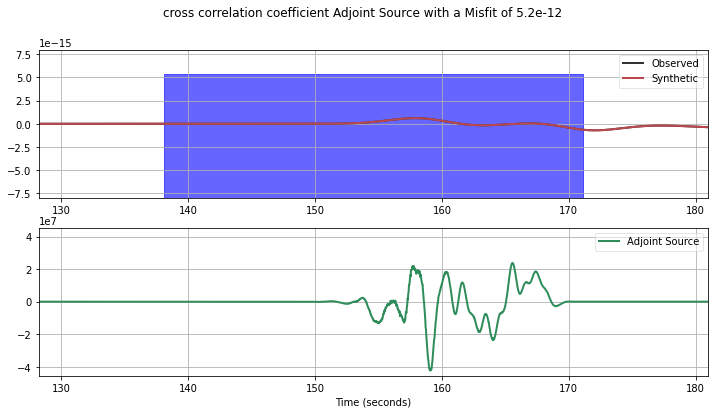

5.1983972682e-12
[[145.98868709829628, 178.98868709829628]]
AA S0028
0.999999565887


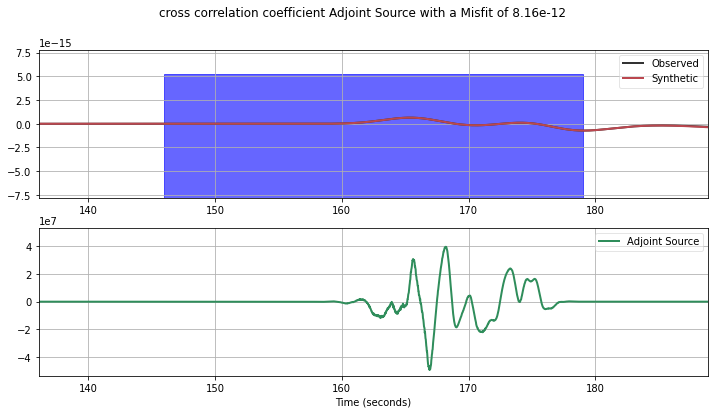

8.15703060653e-12
[[153.84156624047031, 186.84156624047031]]
AA S0029
0.999998465231


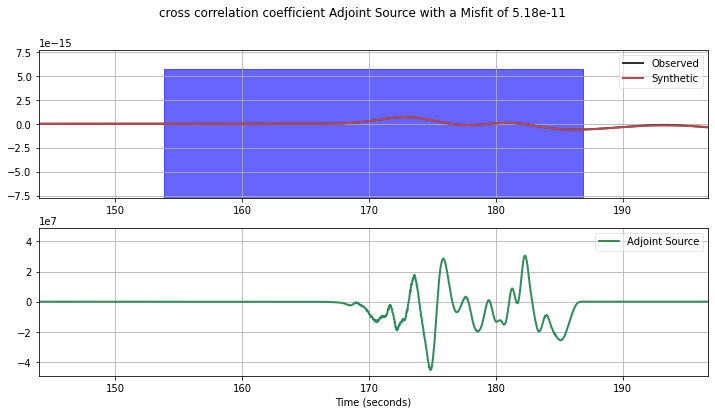

5.18168841168e-11
[[161.65419992237798, 194.65419992237798]]
AA S0030
0.999730586103


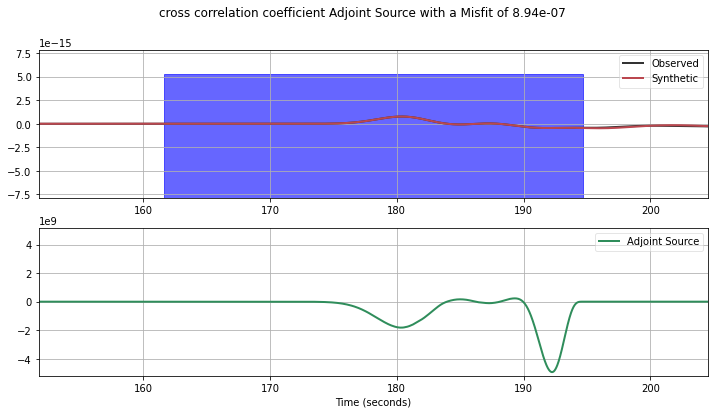

8.93927770362e-07
[[169.42535444510764, 202.42535444510764]]
AA S0031
0.994525364484


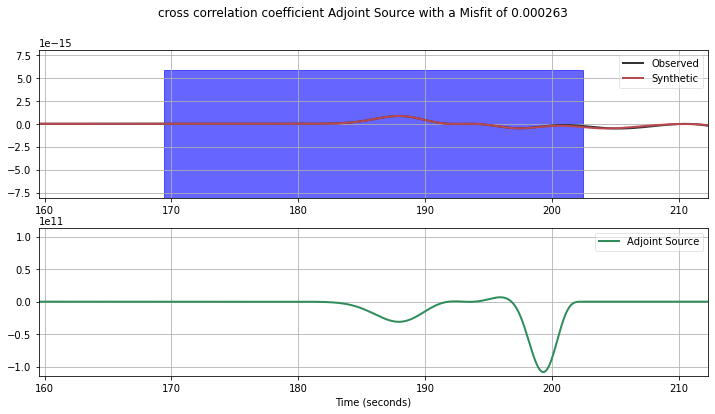

0.000262763894452
[[177.153862641465, 210.153862641465]]
AA S0032
0.973639627859


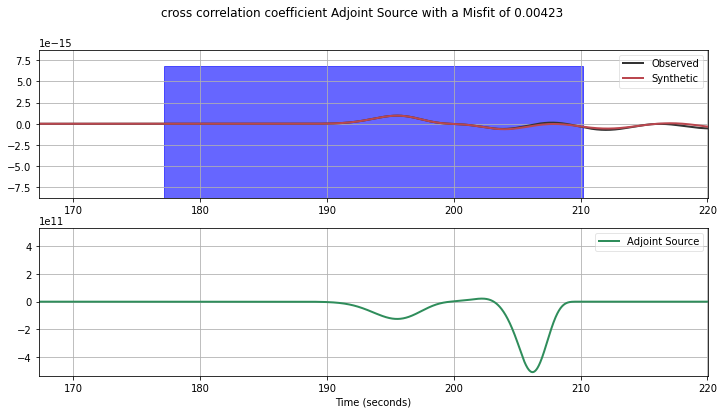

0.00422958914767
[[184.78072567909774, 217.78072567909774]]
AA S0033
0.938864667159


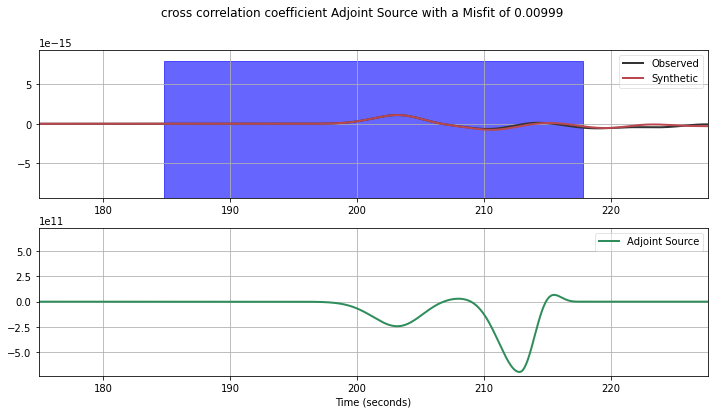

0.00998674334054
[[192.31484962983203, 225.31484962983203]]
AA S0034
0.909837134545


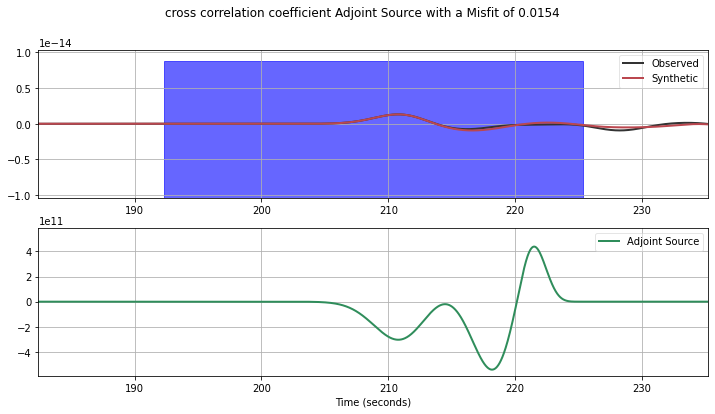

0.0154362585028
[[199.7740494901571, 232.7740494901571]]
AA S0035
0.904960692185


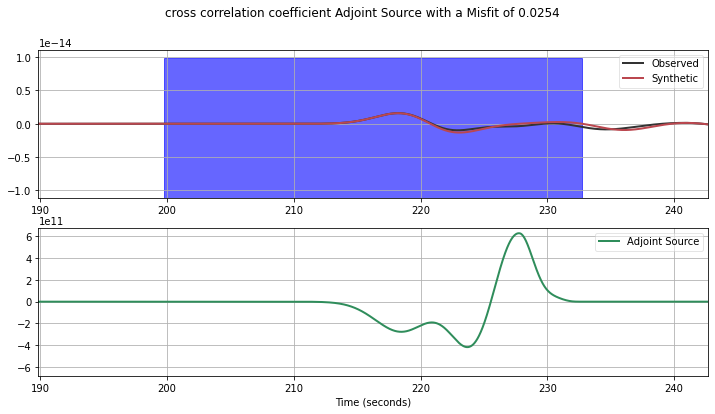

0.0253701873235
[[207.16049675570545, 240.16049675570545]]
AA S0036
0.936087638879


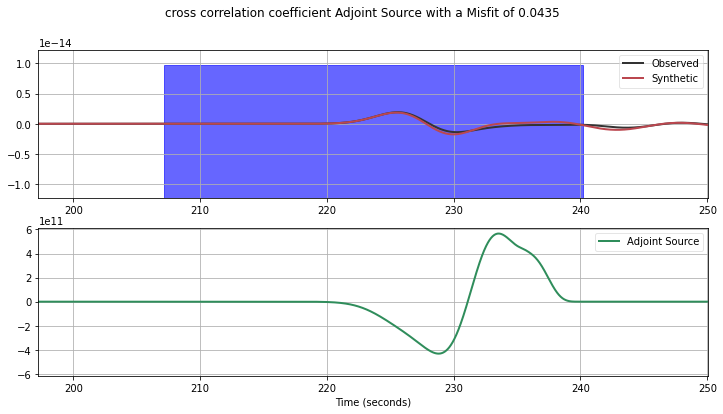

0.0435381442262
[[214.47473555261701, 247.47473555261701]]
AA S0037
1.04854360351


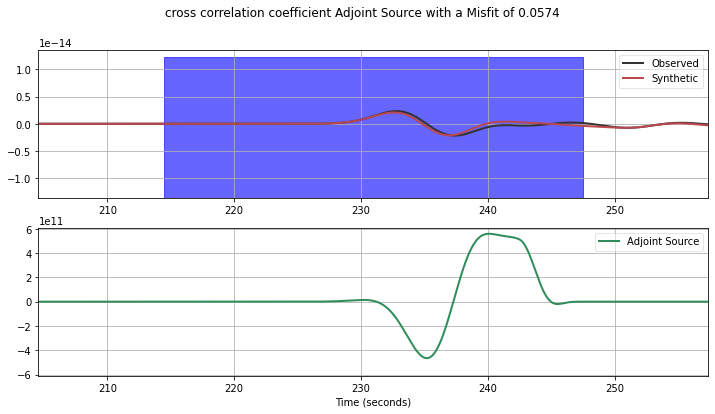

0.0574293859942
[[221.68205659134151, 254.68205659134151]]
AA S0038
1.22752522026


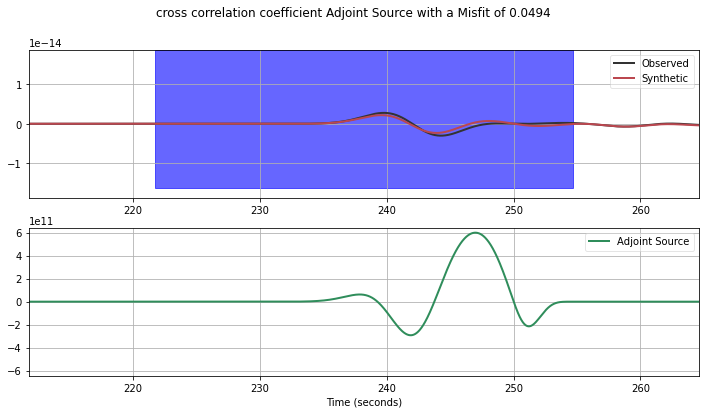

0.0494169790486
[[228.20902223285583, 261.20902223285583]]
AA S0039
1.45868801865


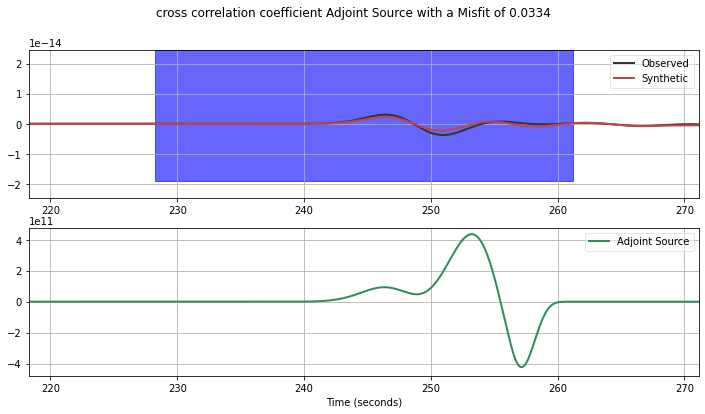

0.033443738321
[[234.71415717353179, 267.71415717353182]]
AA S0040
1.54162416621


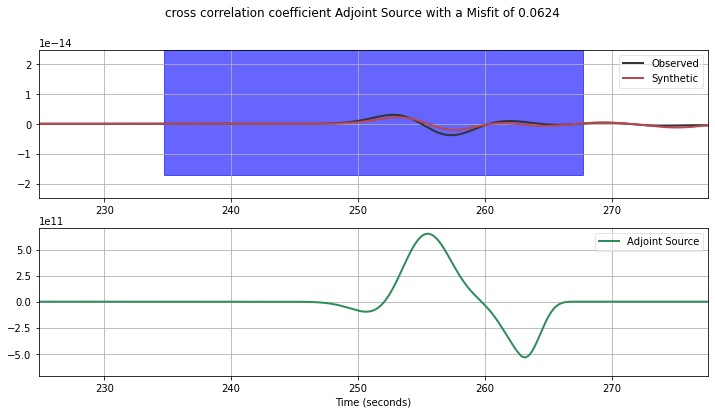

0.0624125783136
[[241.19399721985735, 274.19399721985735]]
AA S0041
1.1459384511


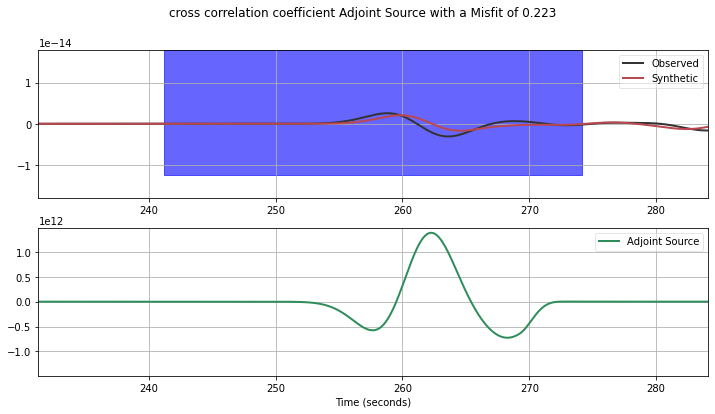

0.223235470362
[[247.64485079034847, 280.64485079034847]]
AA S0042
0.612554979042


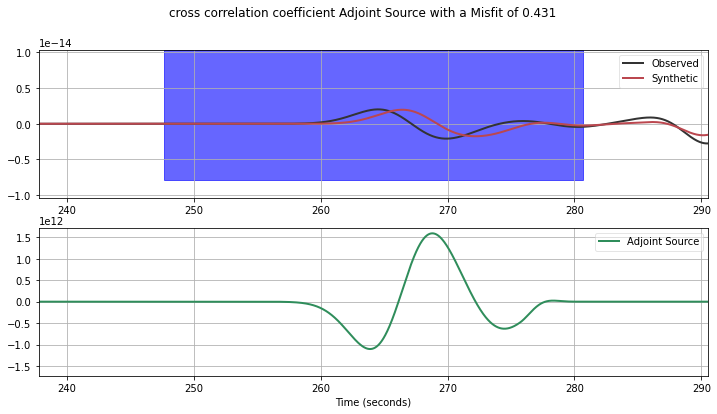

0.431015113668
[[254.06331299811671, 287.06331299811671]]
AA S0043
0.336754777764


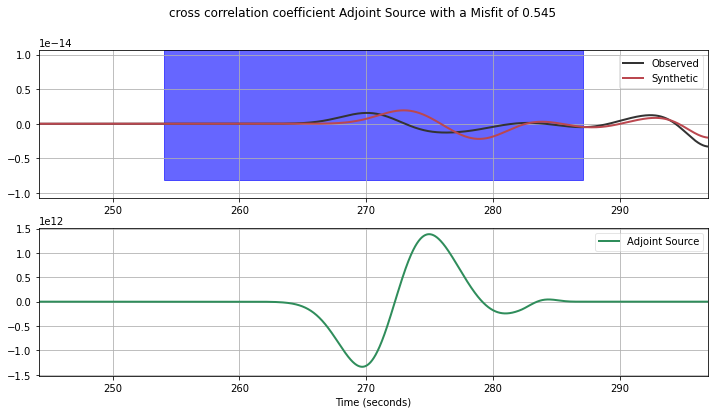

0.544716519745
[[260.44585462195107, 293.44585462195107]]
AA S0044
0.22712673222


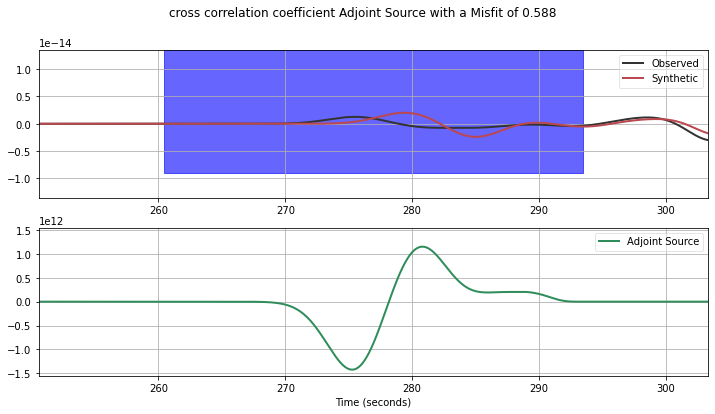

0.587651248554
[[266.78944300296473, 299.78944300296473]]
AA S0045
0.179350613926


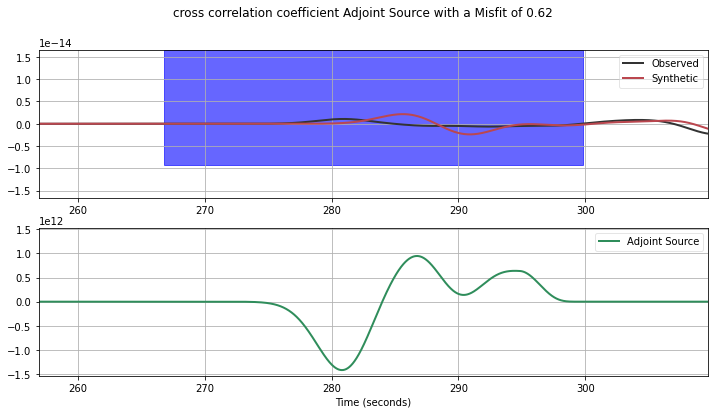

0.620243290279
[[273.09100161480694, 306.09100161480694]]
AA S0046
0.167962337707


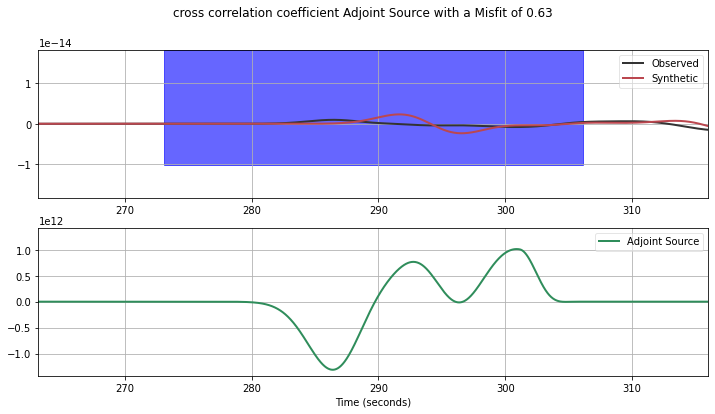

0.630072938919
[[279.34759765895694, 312.34759765895694]]
AA S0047
0.175641230706


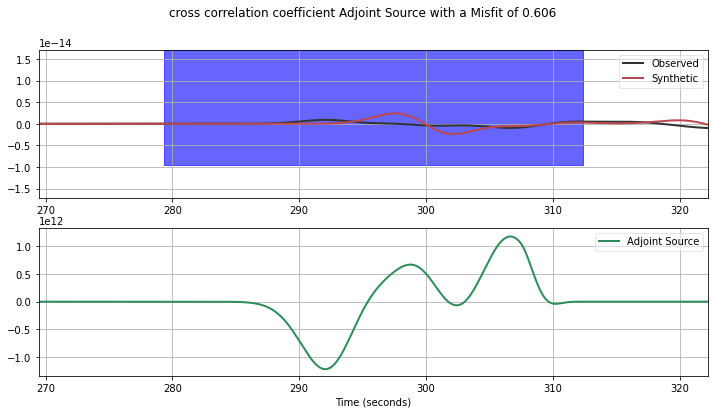

0.605836260021
[[285.15836469267606, 318.15836469267606]]
AA S0048
0.183080002387


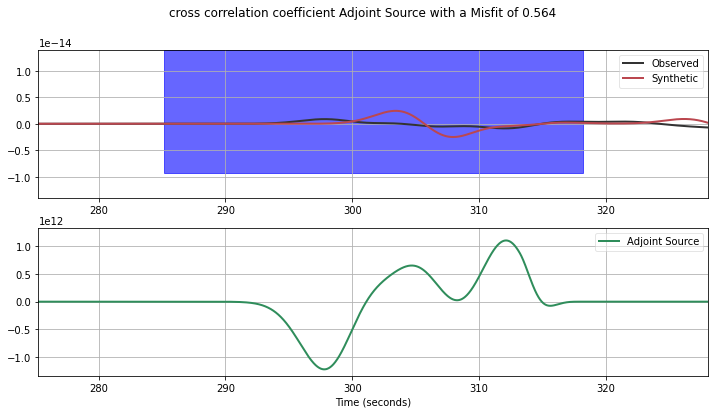

0.563816384305
[[290.57770898380215, 323.57770898380215]]
AA S0049
0.199657132361


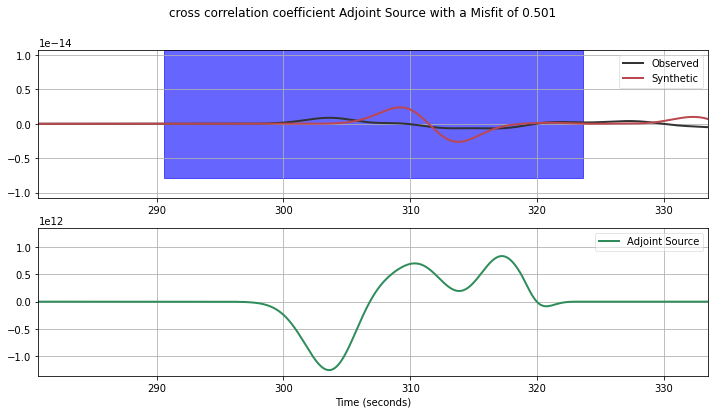

0.500528348562
[[295.98400646310421, 328.98400646310421]]
AA S0050
0.231668736367


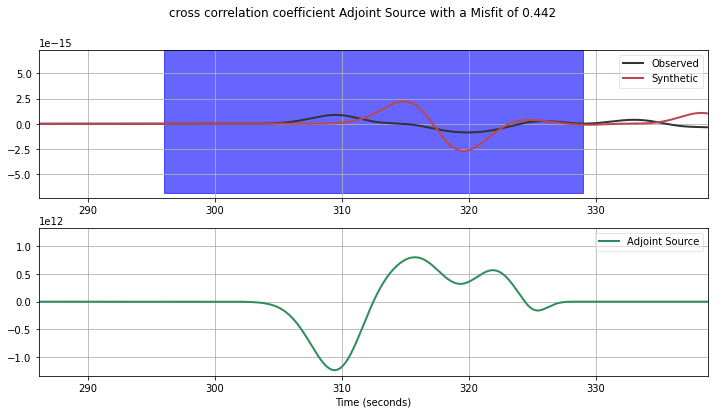

0.441662032315
[[301.37584373228822, 334.37584373228822]]
AA S0051
0.262978311871


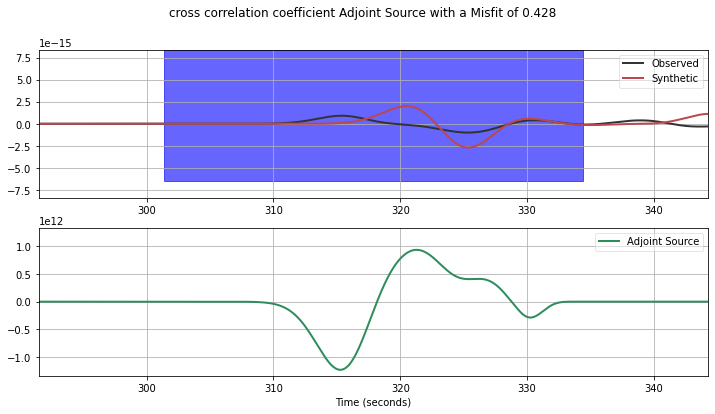

0.428217668009
[[306.75159987378356, 339.75159987378356]]
AA S0052
0.27671138332


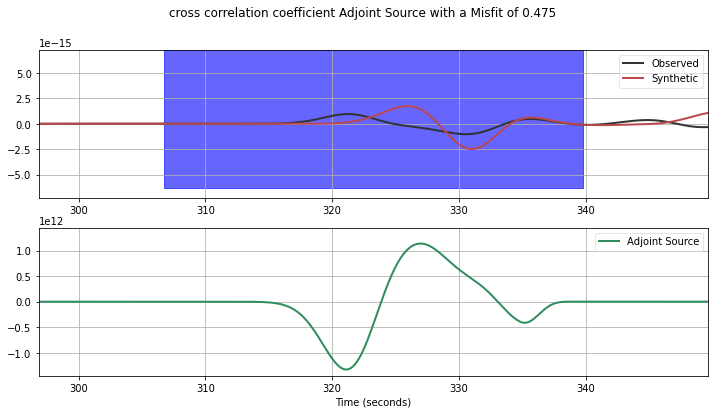

0.475055211182
[[312.11015066535856, 345.11015066535856]]
AA S0053
0.268316388161


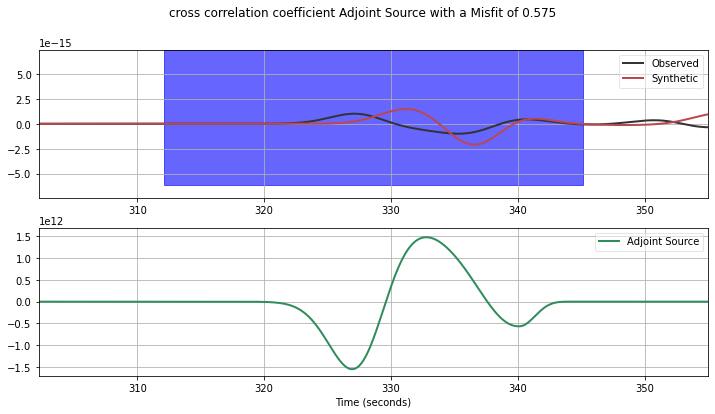

0.575339179479
[[317.44975731658263, 350.44975731658263]]
AA S0054
0.254502518175


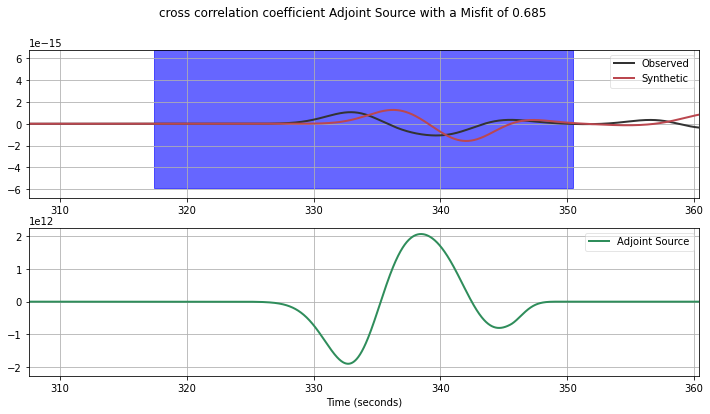

0.684877492087
[[322.76884768385122, 355.76884768385122]]
AA S0055
0.297684427187


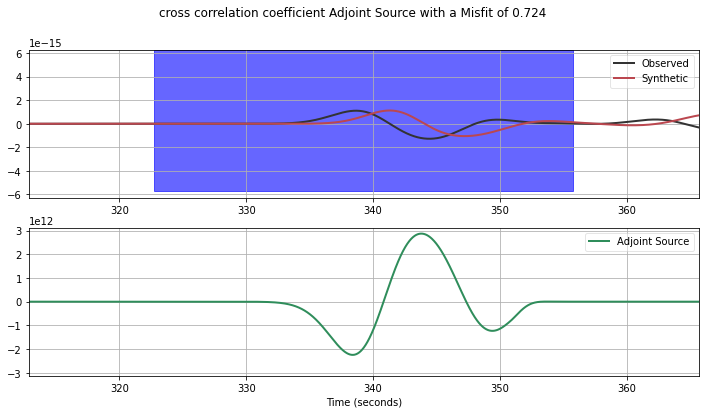

0.7240608003
[[328.06621508836622, 361.06621508836622]]
AA S0056
0.497506310452


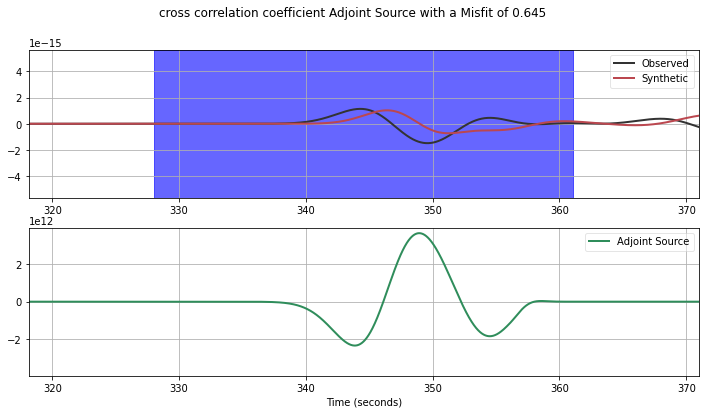

0.645223847582
[[333.34018092144828, 366.34018092144828]]
AA S0057
0.844921731588


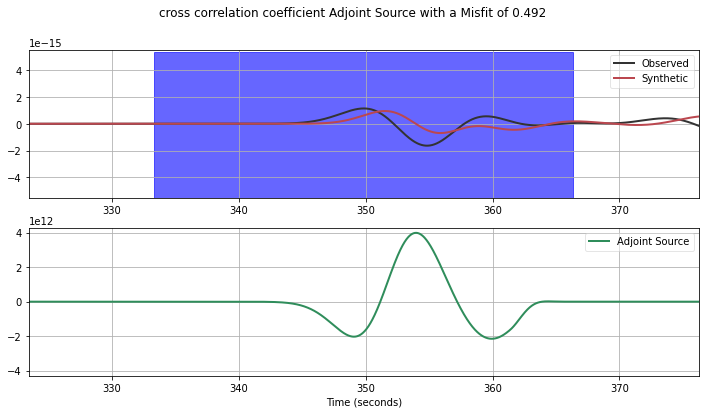

0.491647535199
[[338.59518015658455, 371.59518015658455]]
AA S0058
1.17633282833


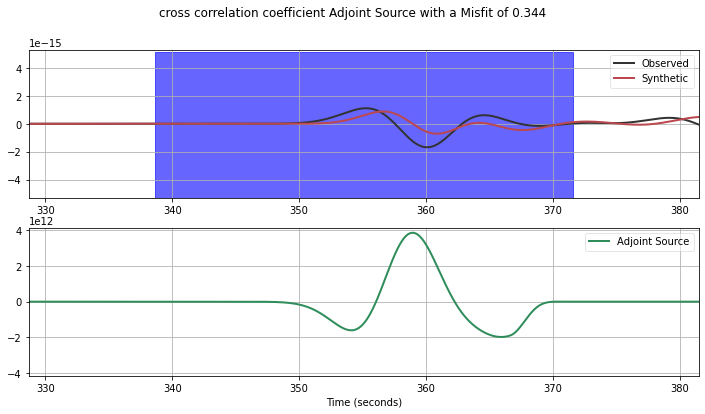

0.3437083626
[[343.84319620132919, 376.84319620132919]]
AA S0059
1.3833429662


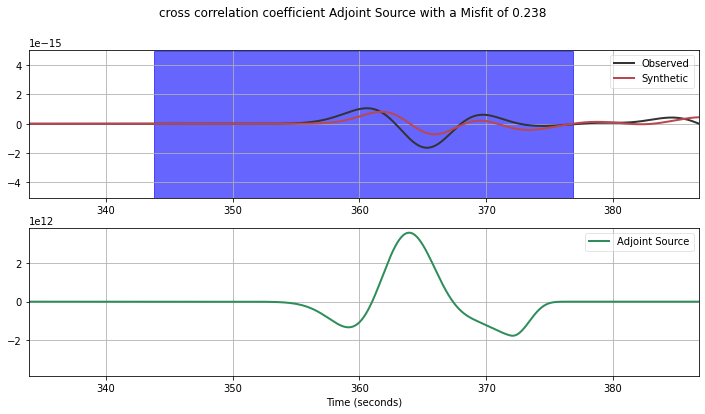

0.238360051828
[[349.08083668973751, 382.08083668973751]]
AA S0060
1.46869206274


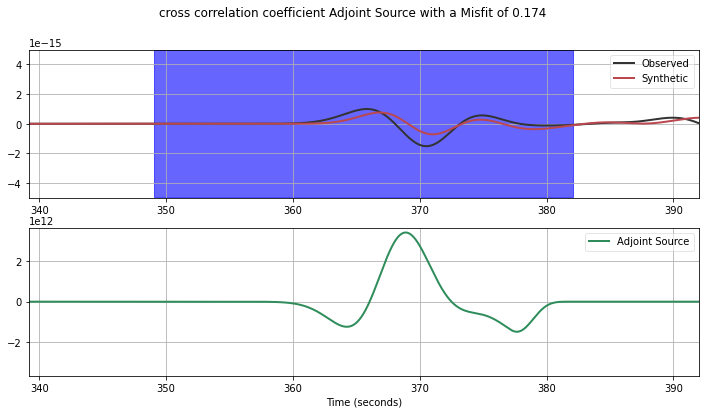

0.174052357465


In [11]:
PROJECT='/data2/yjgao/data/DATASET/package_forthesis/'
import numpy as np
import matplotlib.pyplot as plt
import os
list_events=['EVENT1']
for _i, event in enumerate(list_events):
    adj_calculate(PROJECT,event,'REF_SEM/','REF_SEM_SYN/','ccc')

[[64.931682194878661, 97.931682194878661]]
AA S0001


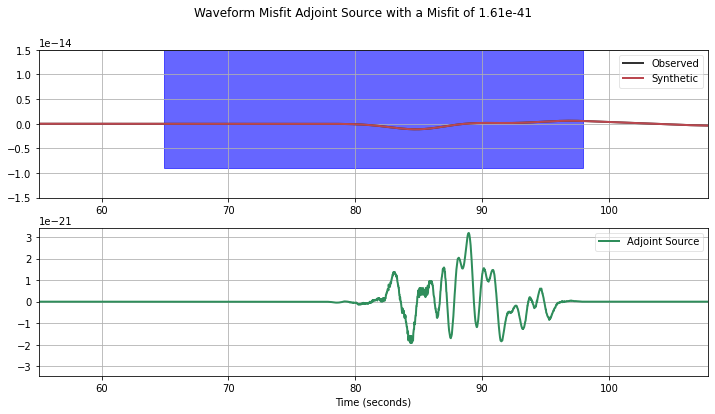

1.60865498817e-41
[[56.968614525035761, 89.968614525035761]]
AA S0002


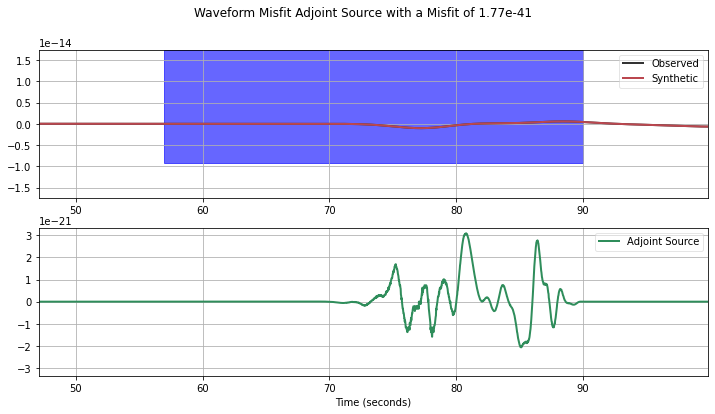

1.77159891012e-41
[[49.045958950547487, 82.045958950547487]]
AA S0003


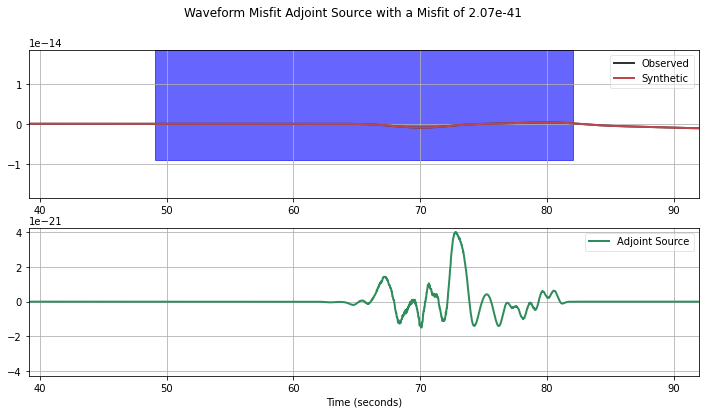

2.0664087169e-41
[[41.188207002335105, 74.188207002335105]]
AA S0004


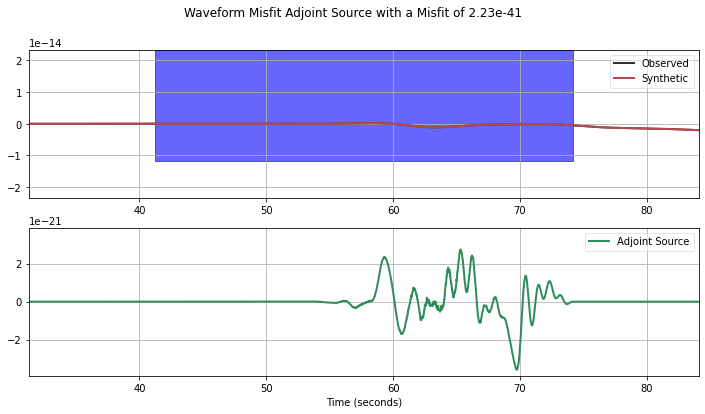

2.2315315634e-41
[[33.441285028256871, 66.441285028256871]]
AA S0005


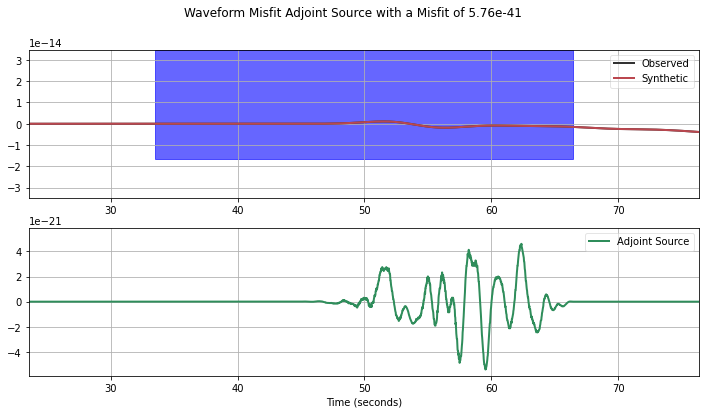

5.75847572077e-41
[[25.901001596526484, 58.901001596526484]]
AA S0006


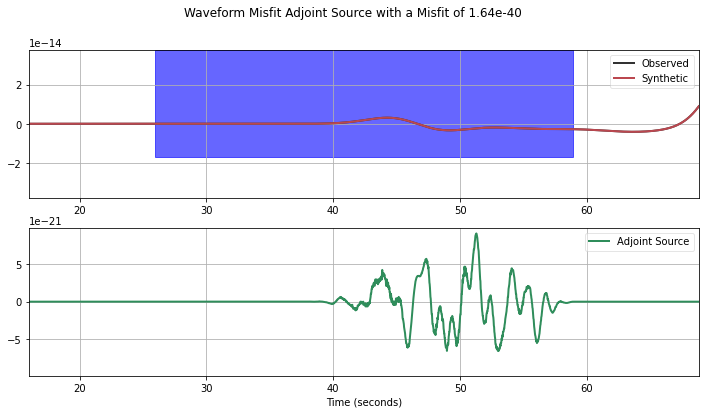

1.63558923075e-40
[[18.789396418444827, 51.789396418444824]]
AA S0007


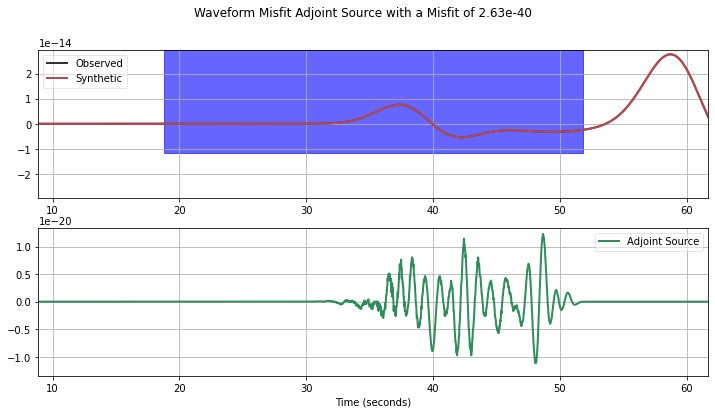

2.63423263791e-40
[[12.668750701702812, 45.668750701702812]]
AA S0008


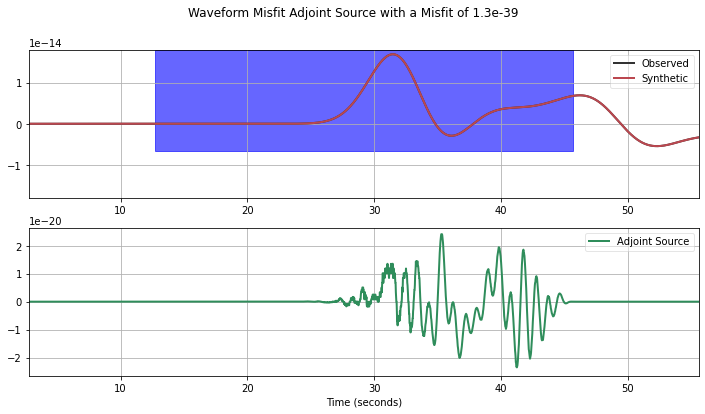

1.30258070572e-39
[[8.872367957285924, 41.872367957285924]]
AA S0009


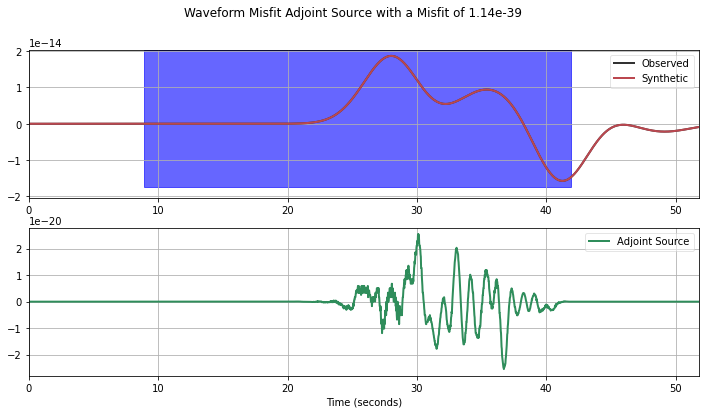

1.13863167969e-39
[[9.1964102017034008, 42.196410201703401]]
AA S0010


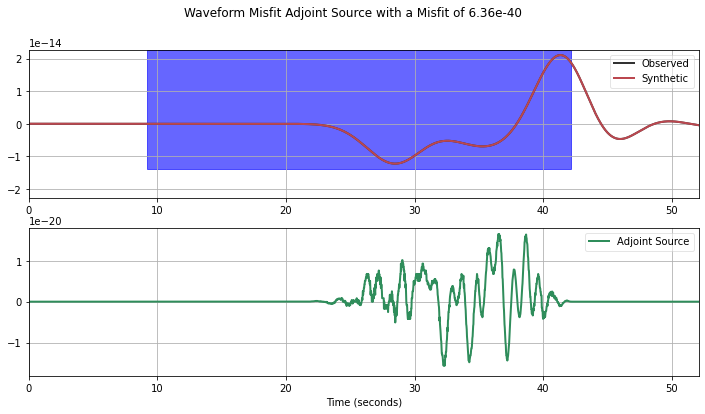

6.35679634298e-40
[[13.44310352760726, 46.443103527607263]]
AA S0011


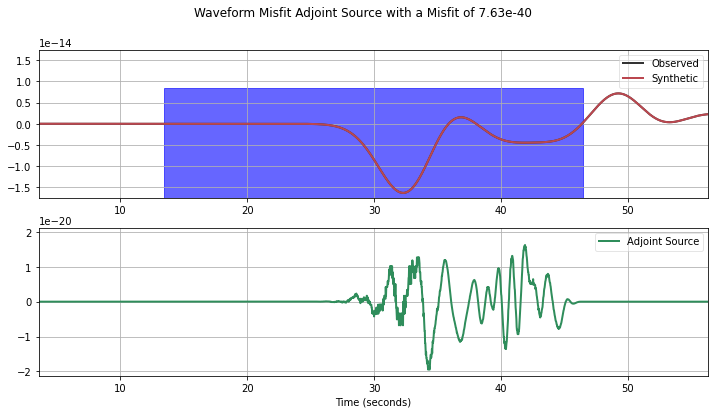

7.6290987527e-40
[[19.763749351428846, 52.763749351428842]]
AA S0012


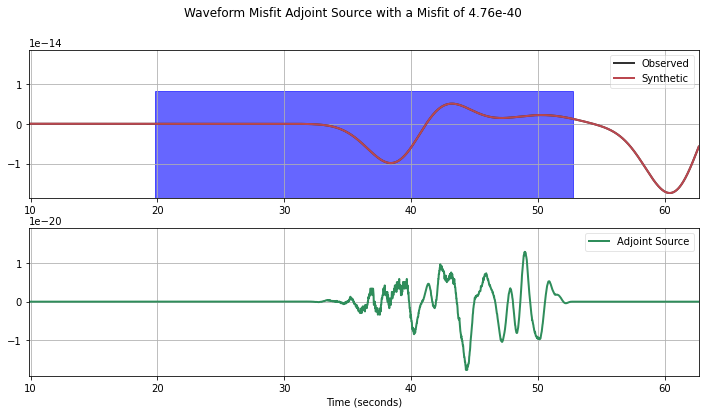

4.75898216513e-40
[[26.9593382632249, 59.9593382632249]]
AA S0013


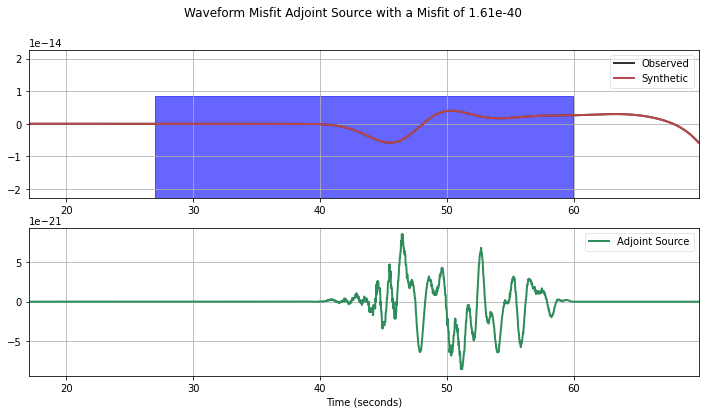

1.61052426857e-40
[[34.538578336728634, 67.538578336728634]]
AA S0014


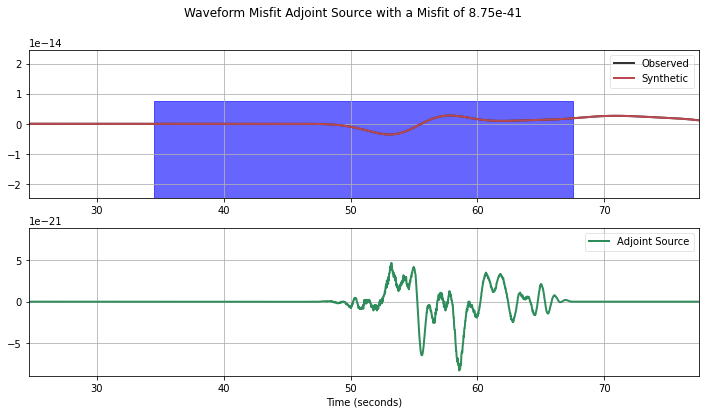

8.7489841907e-41
[[42.305314003568114, 75.305314003568114]]
AA S0015


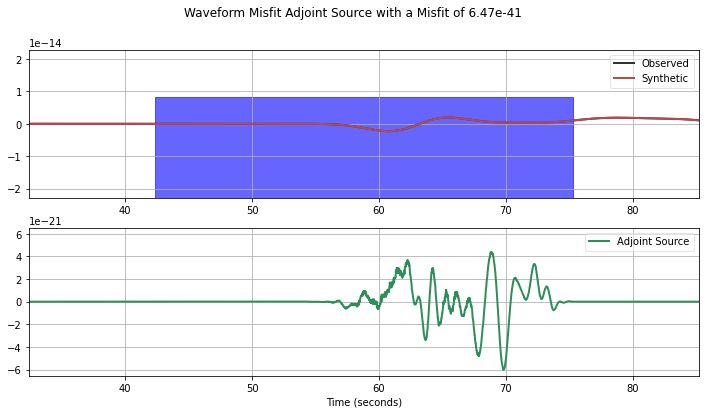

6.46936480696e-41
[[50.17448281616079, 83.17448281616079]]
AA S0016


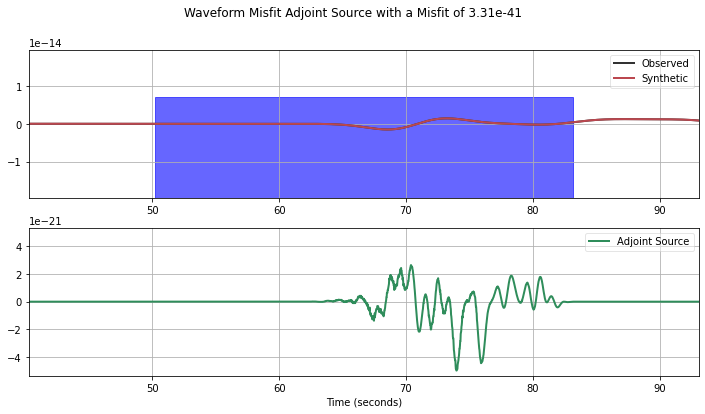

3.31179284798e-41
[[58.104118295881179, 91.104118295881179]]
AA S0017


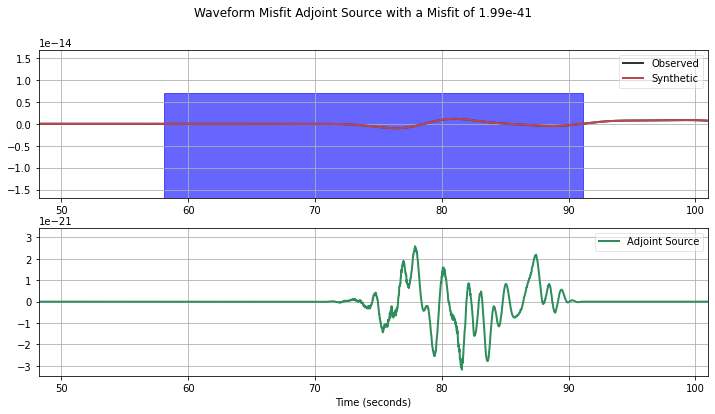

1.99133608472e-41
[[66.071757784638635, 99.071757784638635]]
AA S0018


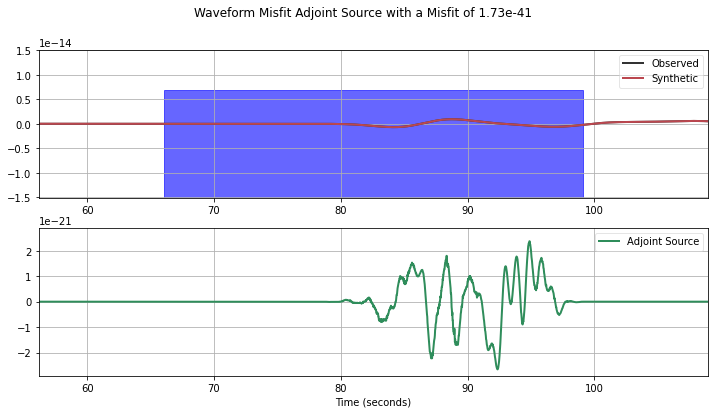

1.72577164031e-41
[[74.064207786582159, 107.06420778658216]]
AA S0019


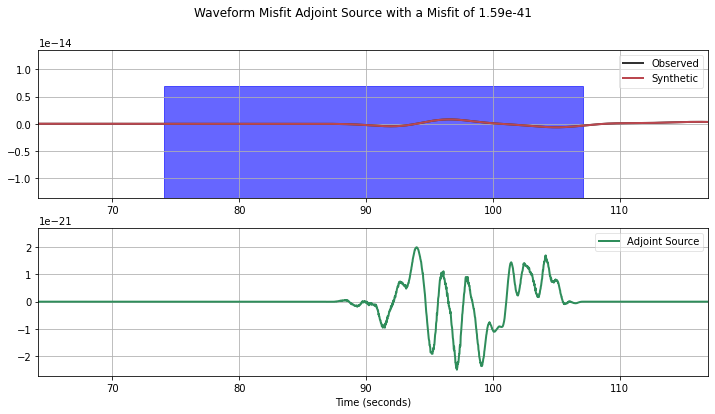

1.58857557819e-41
[[82.073488500080359, 115.07348850008036]]
AA S0020


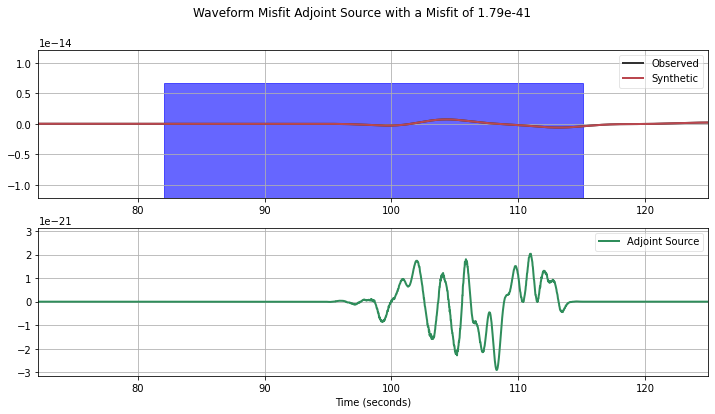

1.79069800432e-41
[[90.094122383223336, 123.09412238322334]]
AA S0021


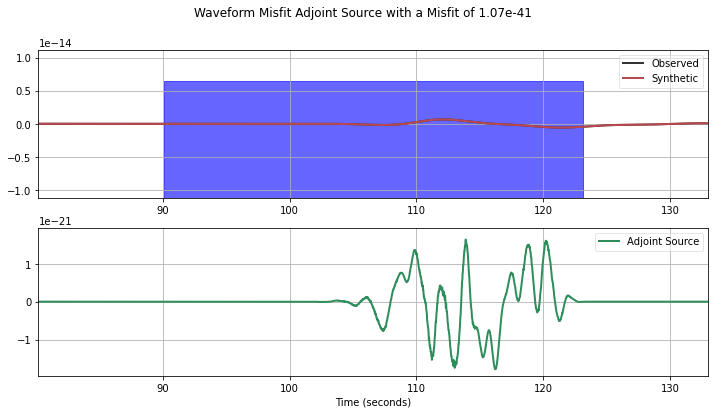

1.06707618279e-41
[[98.122416813493572, 131.12241681349357]]
AA S0022


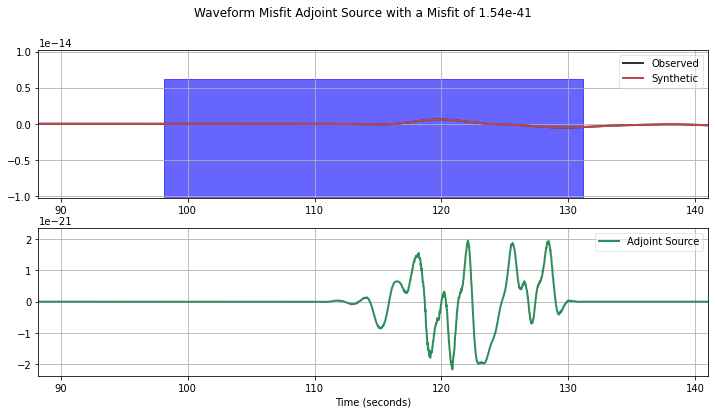

1.53657627065e-41
[[106.15560248039969, 139.15560248039969]]
AA S0023


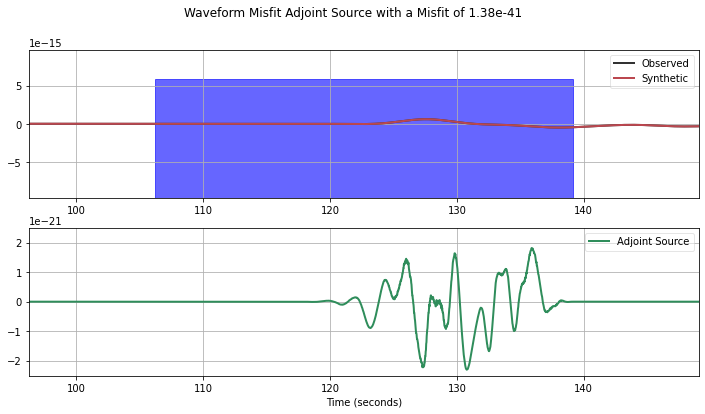

1.38396196344e-41
[[114.19096912726654, 147.19096912726656]]
AA S0024


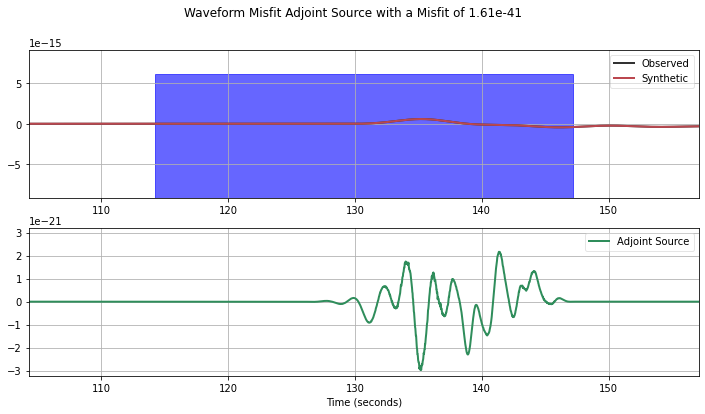

1.61475071352e-41
[[122.1998217811215, 155.1998217811215]]
AA S0025


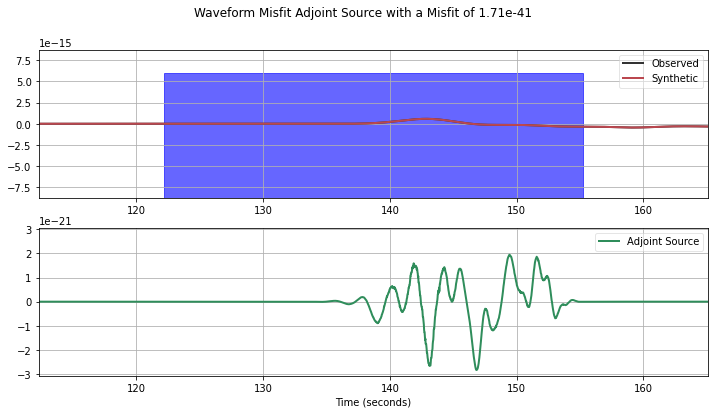

1.70907449628e-41
[[130.16728303744952, 163.16728303744952]]
AA S0026


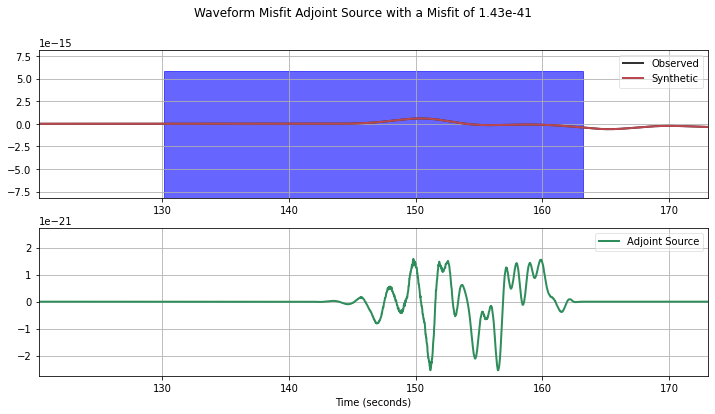

1.43420204705e-41
[[138.09698880499246, 171.09698880499246]]
AA S0027


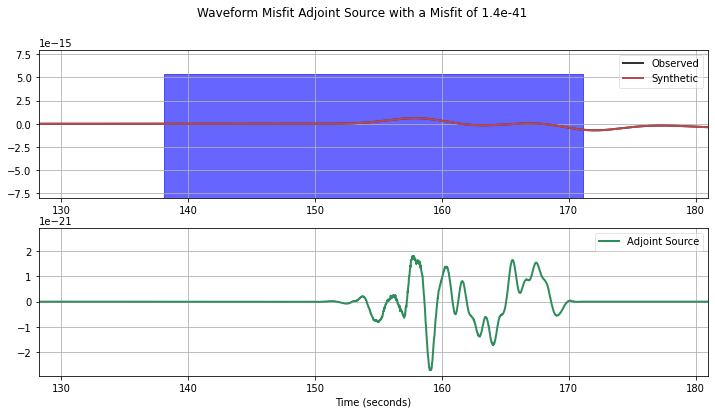

1.39869304731e-41
[[145.98868709829628, 178.98868709829628]]
AA S0028


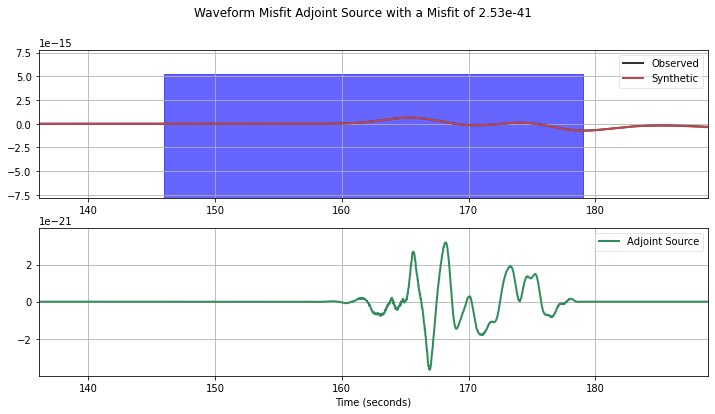

2.52538457935e-41
[[153.84156624047031, 186.84156624047031]]
AA S0029


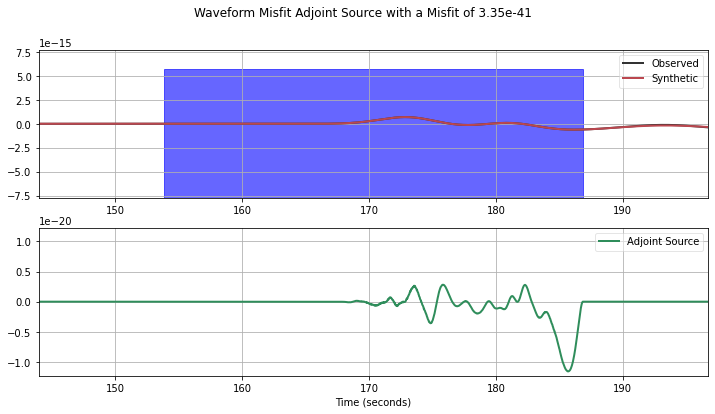

3.3501196962e-41
[[161.65419992237798, 194.65419992237798]]
AA S0030


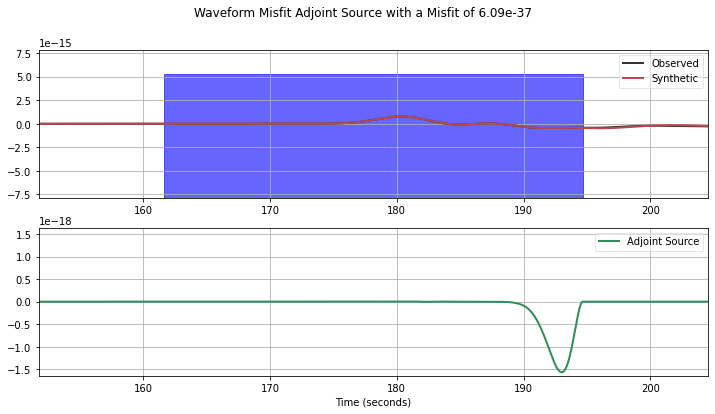

6.09250321607e-37
[[169.42535444510764, 202.42535444510764]]
AA S0031


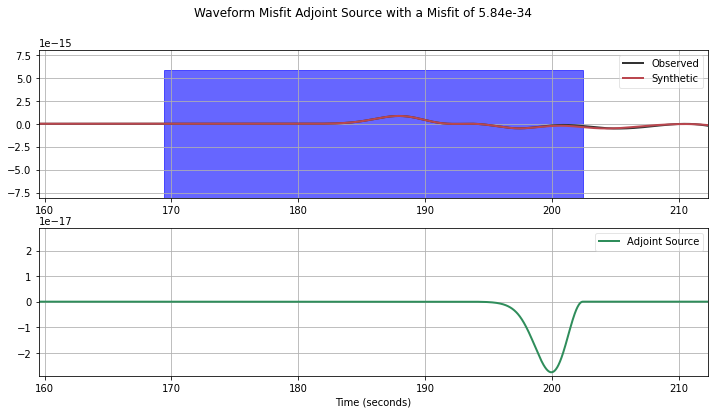

5.83722519742e-34
[[177.153862641465, 210.153862641465]]
AA S0032


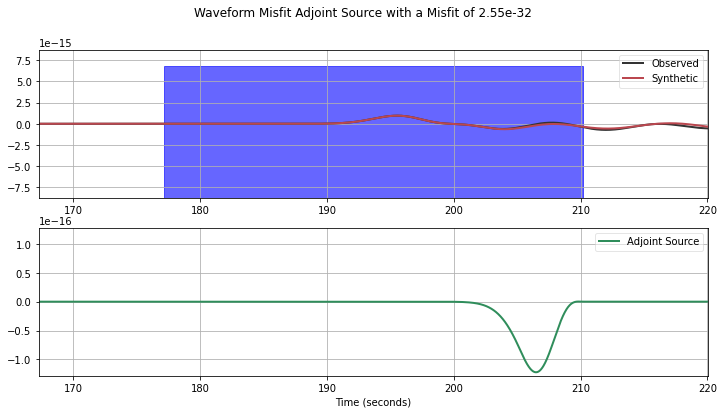

2.54556089148e-32
[[184.78072567909774, 217.78072567909774]]
AA S0033


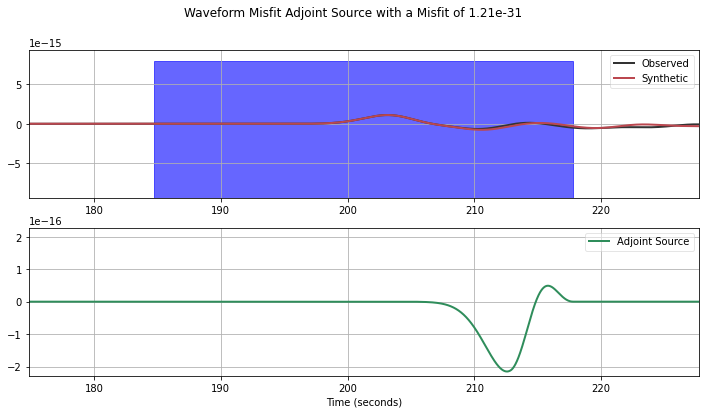

1.21234958158e-31
[[192.31484962983203, 225.31484962983203]]
AA S0034


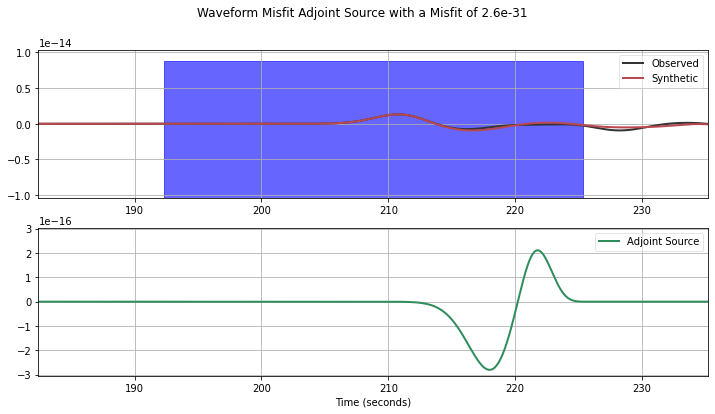

2.60479705477e-31
[[199.7740494901571, 232.7740494901571]]
AA S0035


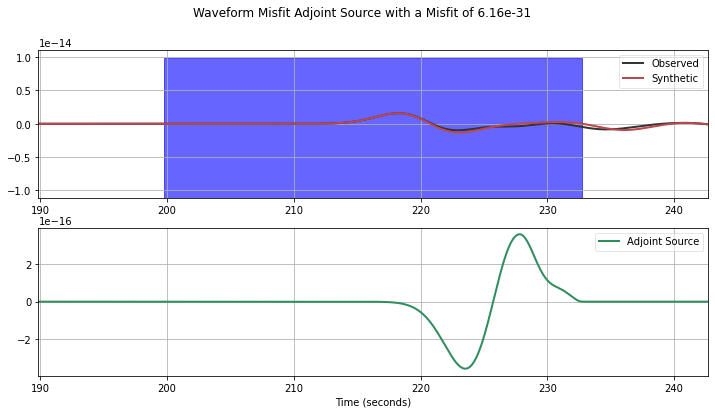

6.1578876309e-31
[[207.16049675570545, 240.16049675570545]]
AA S0036


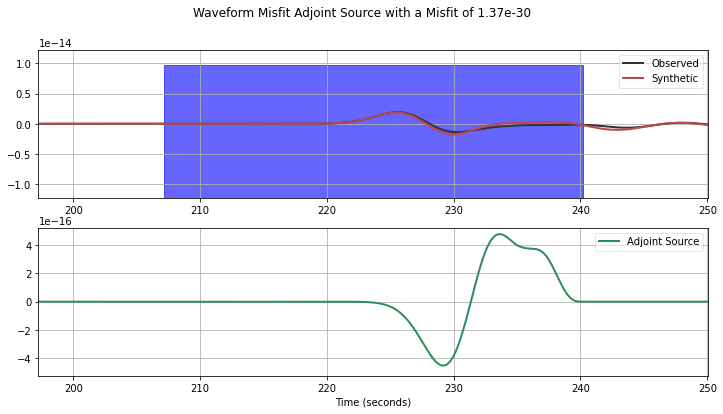

1.36606379706e-30
[[214.47473555261701, 247.47473555261701]]
AA S0037


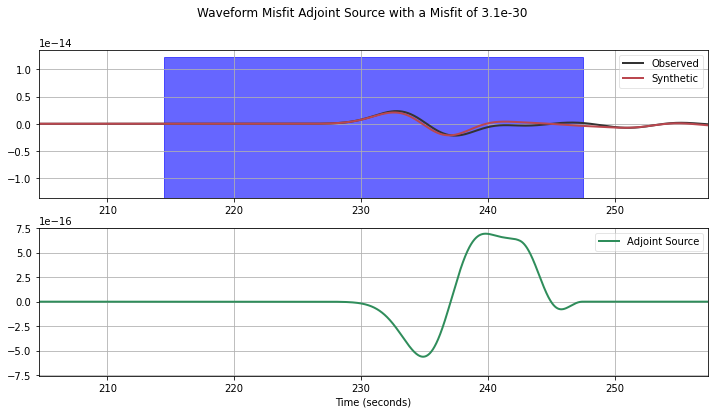

3.09658345028e-30
[[221.68205659134151, 254.68205659134151]]
AA S0038


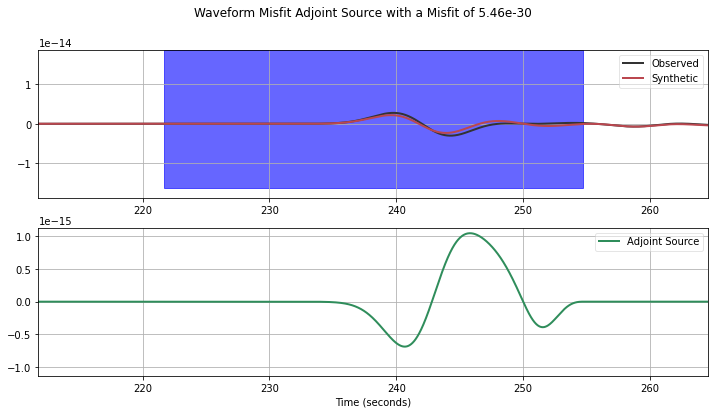

5.4590521564e-30
[[228.20902223285583, 261.20902223285583]]
AA S0039


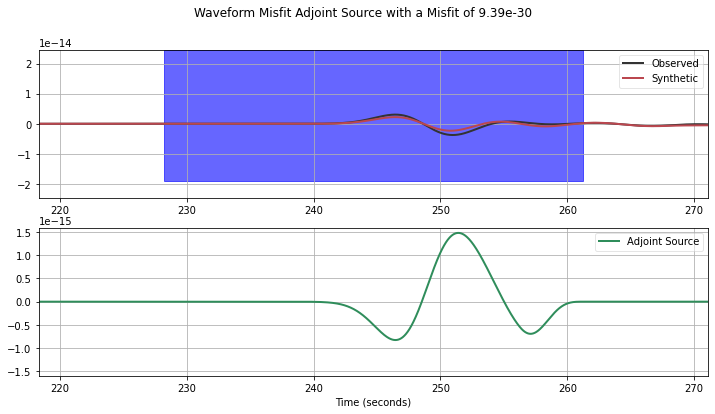

9.39121232551e-30
[[234.71415717353179, 267.71415717353182]]
AA S0040


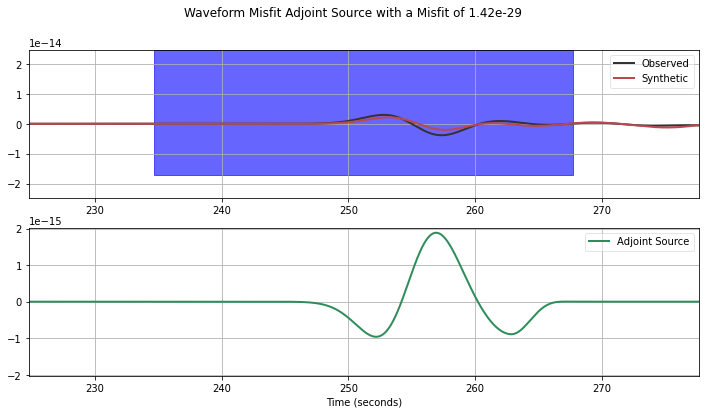

1.42085505804e-29
[[241.19399721985735, 274.19399721985735]]
AA S0041


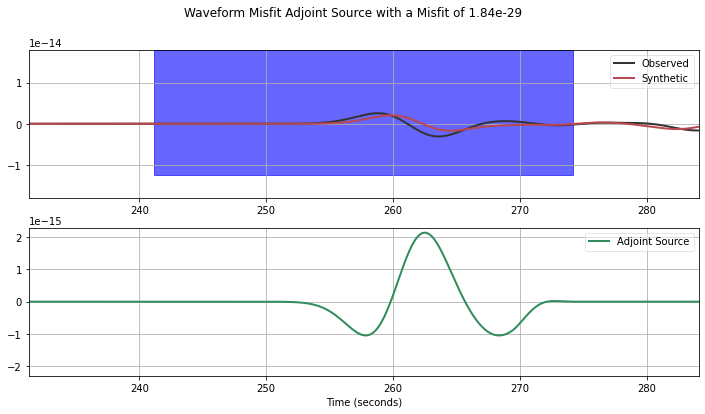

1.83855040579e-29
[[247.64485079034847, 280.64485079034847]]
AA S0042


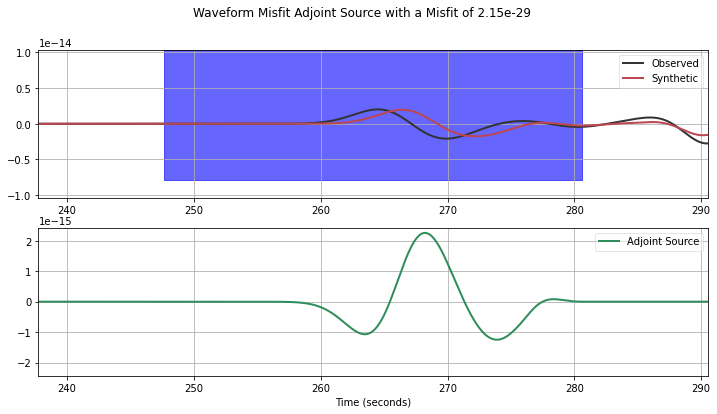

2.14822090082e-29
[[254.06331299811671, 287.06331299811671]]
AA S0043


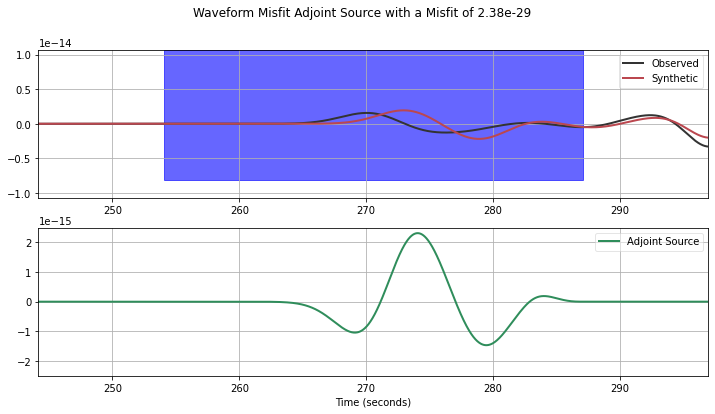

2.38053777983e-29
[[260.44585462195107, 293.44585462195107]]
AA S0044


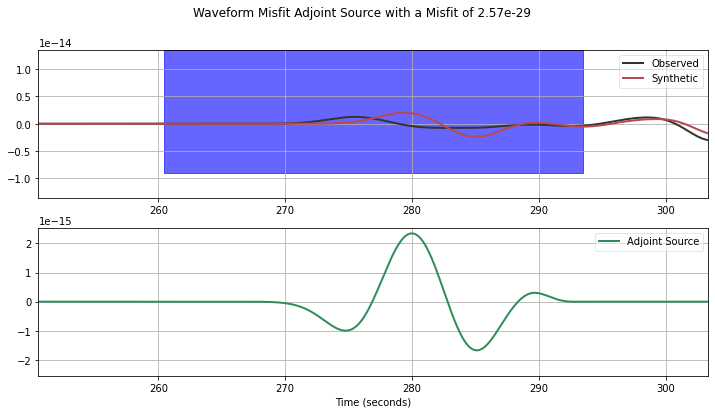

2.56600680232e-29
[[266.78944300296473, 299.78944300296473]]
AA S0045


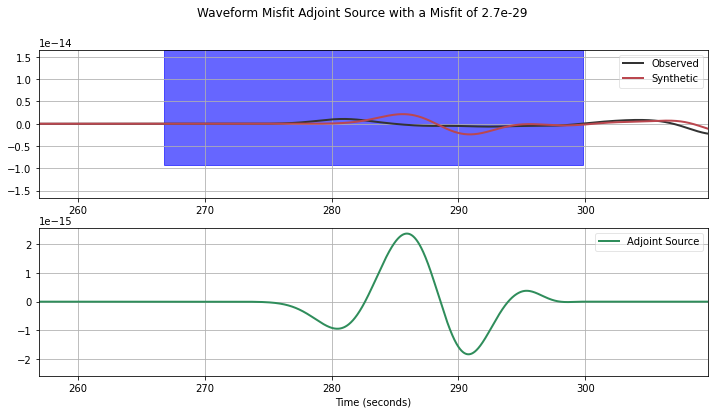

2.70402727175e-29
[[273.09100161480694, 306.09100161480694]]
AA S0046


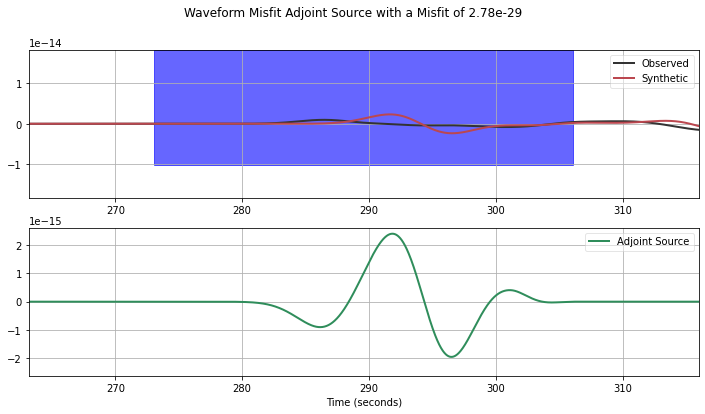

2.78347553733e-29
[[279.34759765895694, 312.34759765895694]]
AA S0047


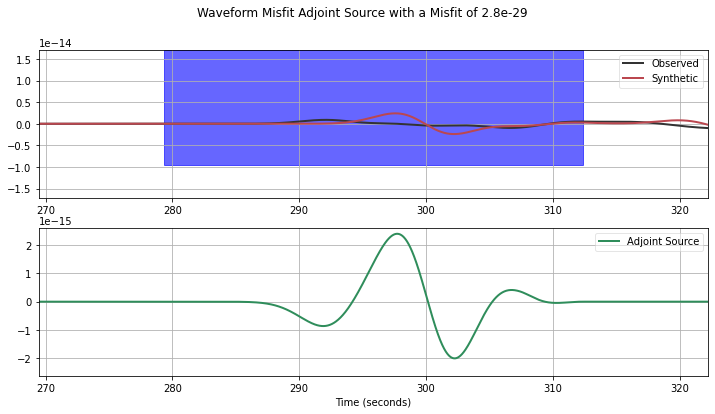

2.7991106189e-29
[[285.15836469267606, 318.15836469267606]]
AA S0048


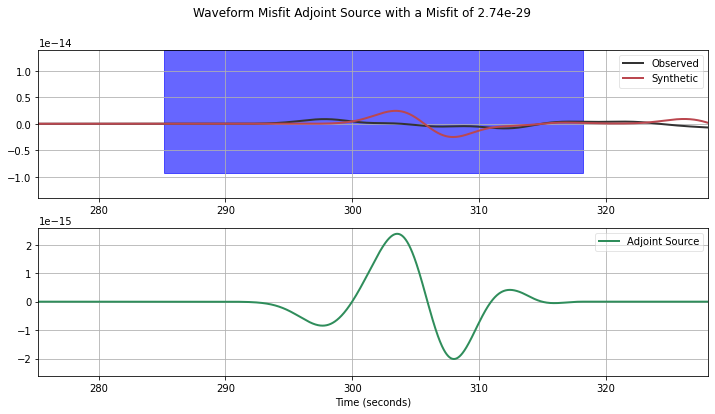

2.74415324907e-29
[[290.57770898380215, 323.57770898380215]]
AA S0049


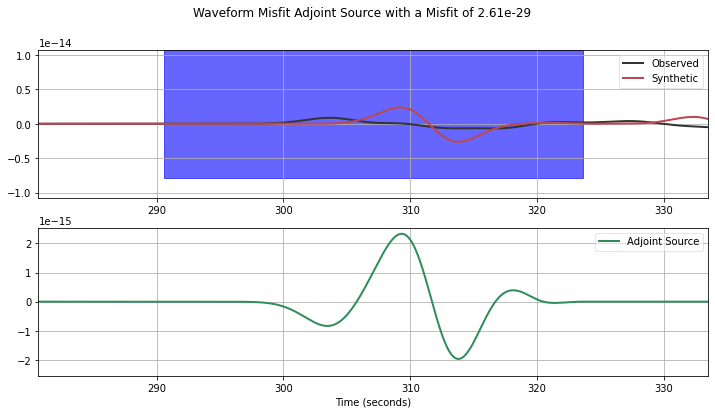

2.61166561356e-29
[[295.98400646310421, 328.98400646310421]]
AA S0050


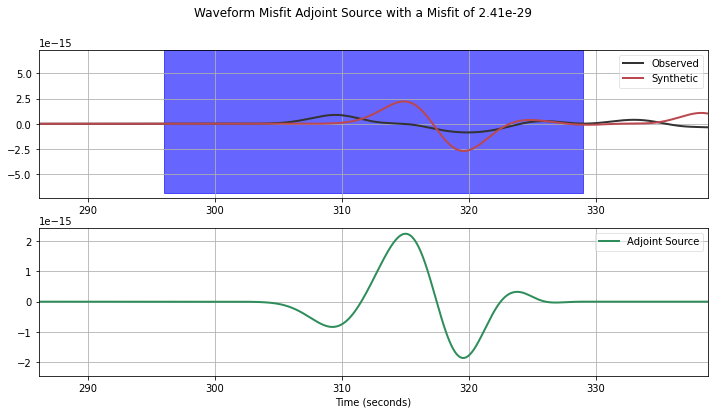

2.4057275326e-29
[[301.37584373228822, 334.37584373228822]]
AA S0051


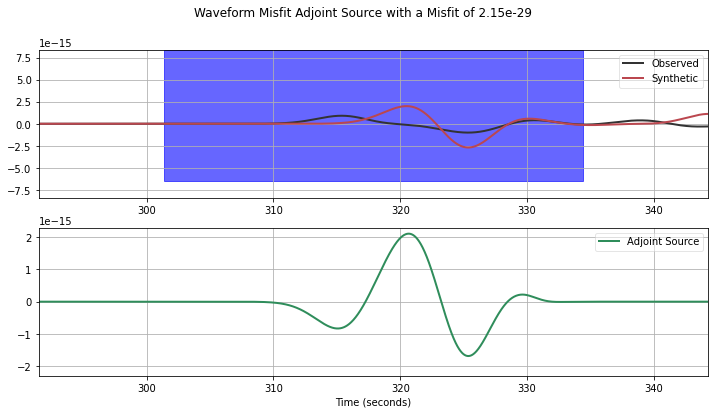

2.15271929615e-29
[[306.75159987378356, 339.75159987378356]]
AA S0052


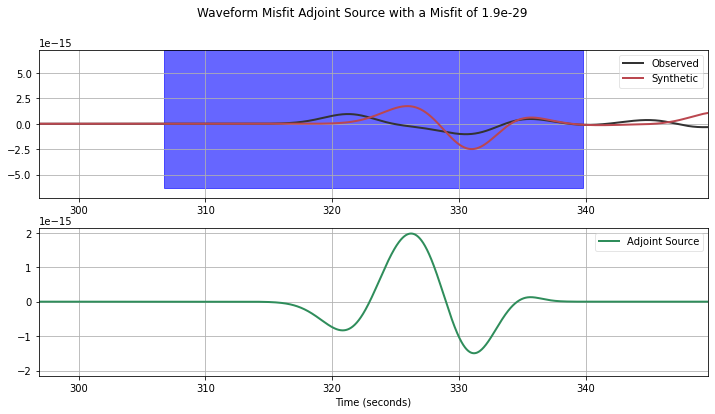

1.89584433712e-29
[[312.11015066535856, 345.11015066535856]]
AA S0053


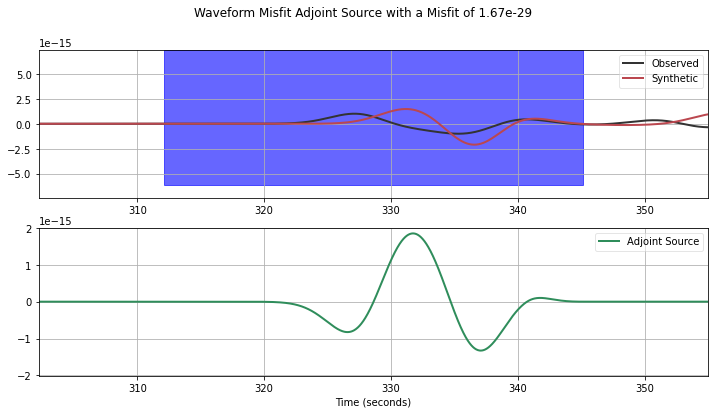

1.66739916038e-29
[[317.44975731658263, 350.44975731658263]]
AA S0054


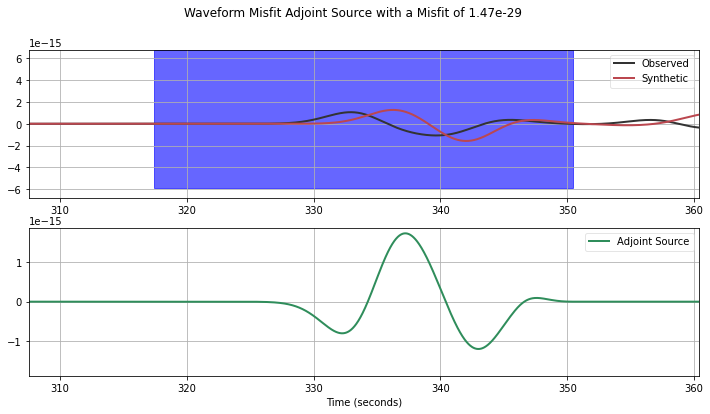

1.46782103049e-29
[[322.76884768385122, 355.76884768385122]]
AA S0055


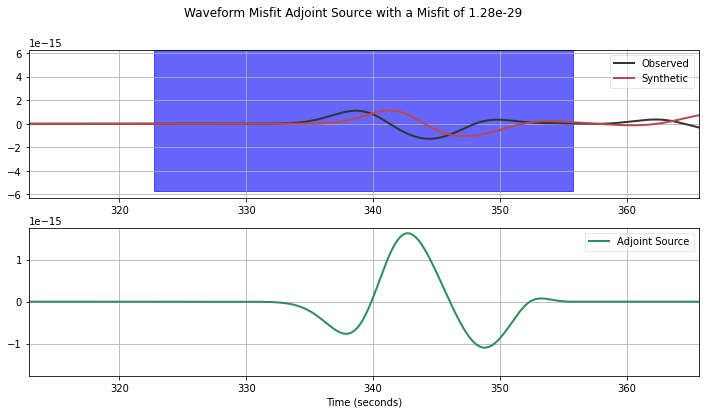

1.27577780319e-29
[[328.06621508836622, 361.06621508836622]]
AA S0056


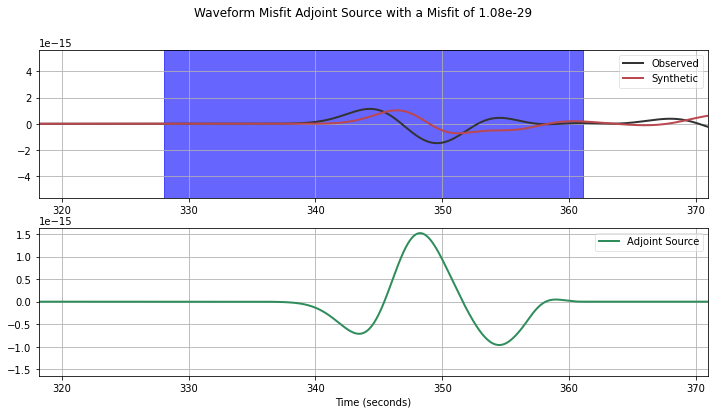

1.0751193924e-29
[[333.34018092144828, 366.34018092144828]]
AA S0057


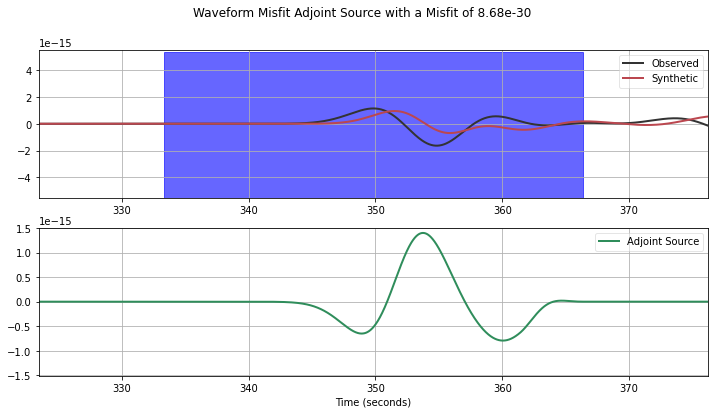

8.67944842066e-30
[[338.59518015658455, 371.59518015658455]]
AA S0058


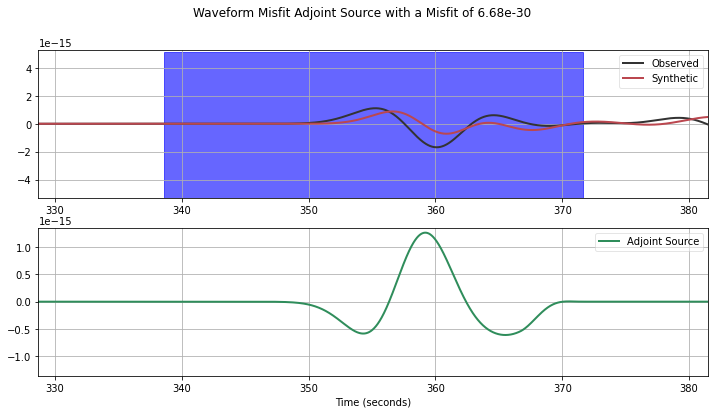

6.67897131693e-30
[[343.84319620132919, 376.84319620132919]]
AA S0059


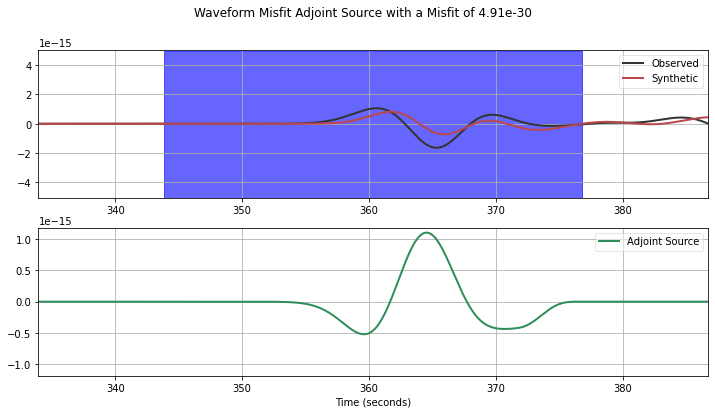

4.91002370254e-30
[[349.08083668973751, 382.08083668973751]]
AA S0060


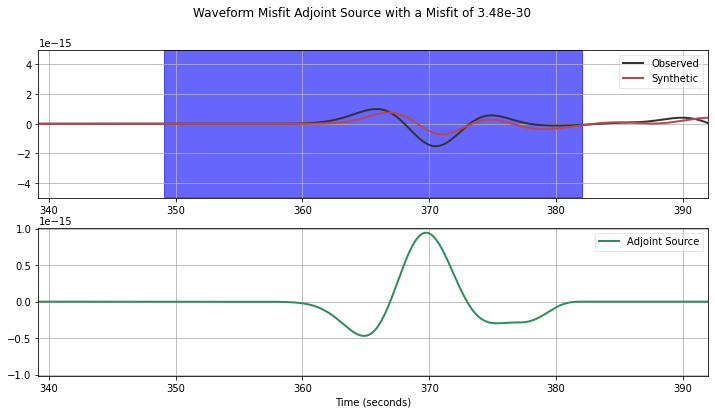

3.48230241779e-30


In [4]:
PROJECT='/data2/yjgao/data/DATASET/package_forthesis/'
import numpy as np
import matplotlib.pyplot as plt
import os
list_events=['EVENT1']
for _i, event in enumerate(list_events):
    adj_calculate(PROJECT,event,'REF_SEM/','REF_SEM_SYN/','waveform_misfit')

[[64.931682194878661, 97.931682194878661]]
AA S0001


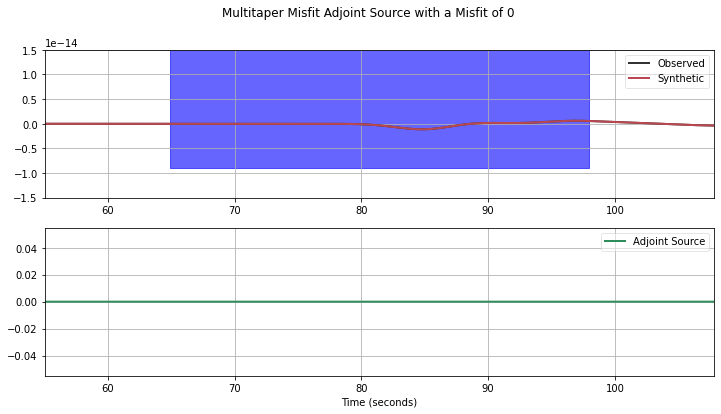

0.0
[[56.968614525035761, 89.968614525035761]]
AA S0002


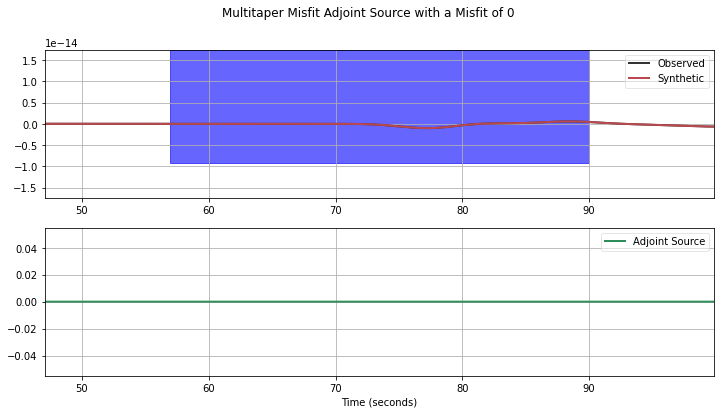

0.0
[[49.045958950547487, 82.045958950547487]]
AA S0003


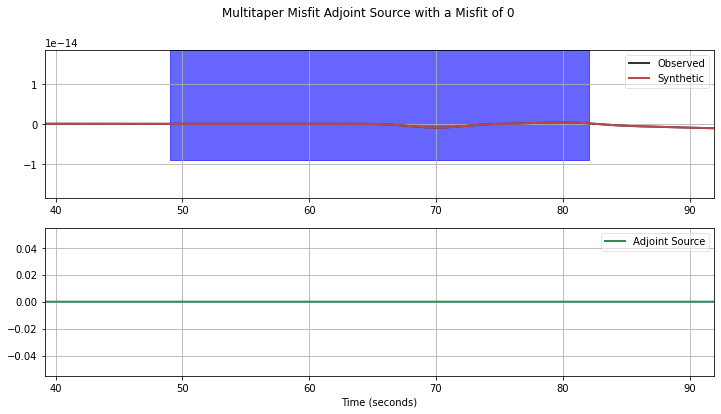

0.0
[[41.188207002335105, 74.188207002335105]]
AA S0004


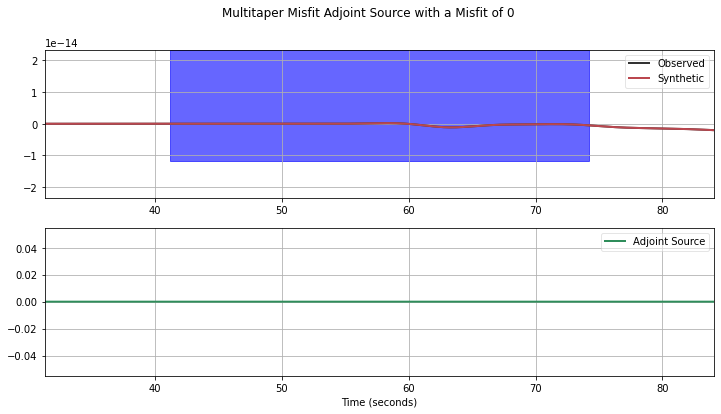

0.0
[[33.441285028256871, 66.441285028256871]]
AA S0005


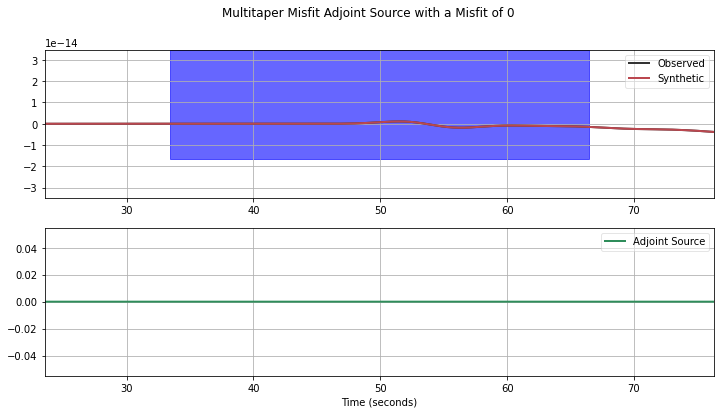

0.0
[[25.901001596526484, 58.901001596526484]]
AA S0006


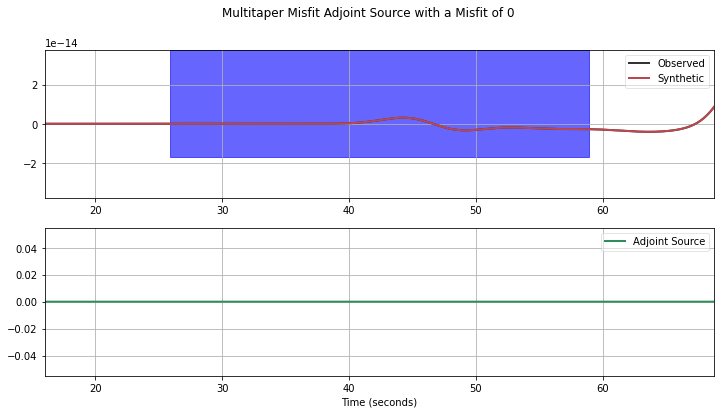

0.0
[[18.789396418444827, 51.789396418444824]]
AA S0007


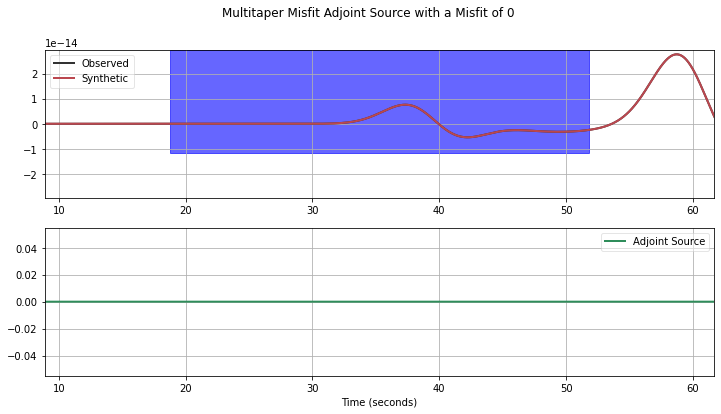

0.0
[[12.668750701702812, 45.668750701702812]]
AA S0008


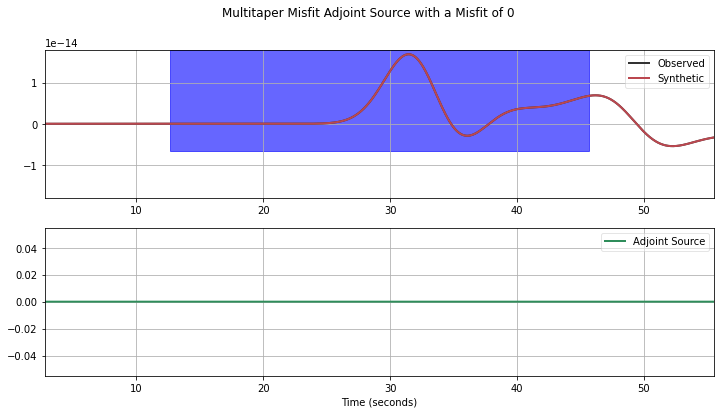

0.0
[[8.872367957285924, 41.872367957285924]]
AA S0009


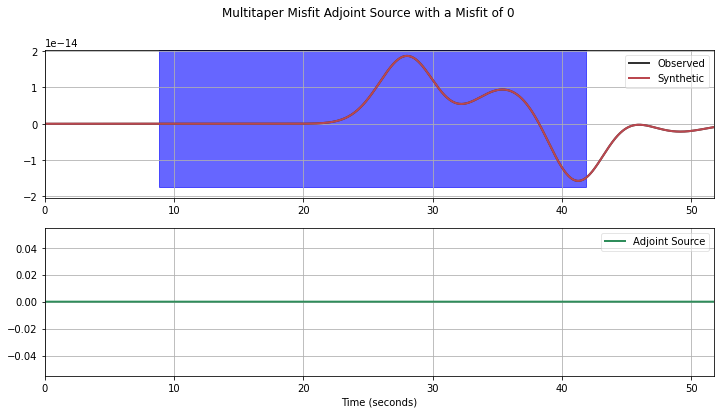

0.0
[[9.1964102017034008, 42.196410201703401]]
AA S0010


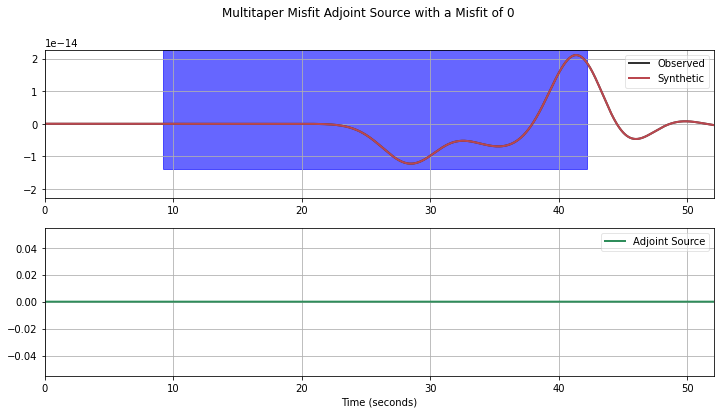

0.0
[[13.44310352760726, 46.443103527607263]]
AA S0011


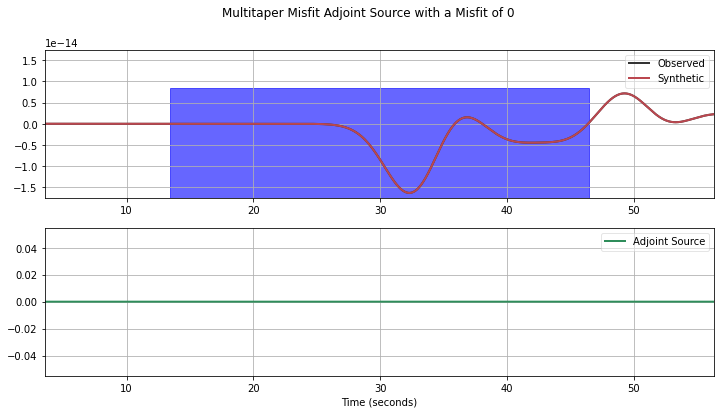

0.0
[[19.763749351428846, 52.763749351428842]]
AA S0012


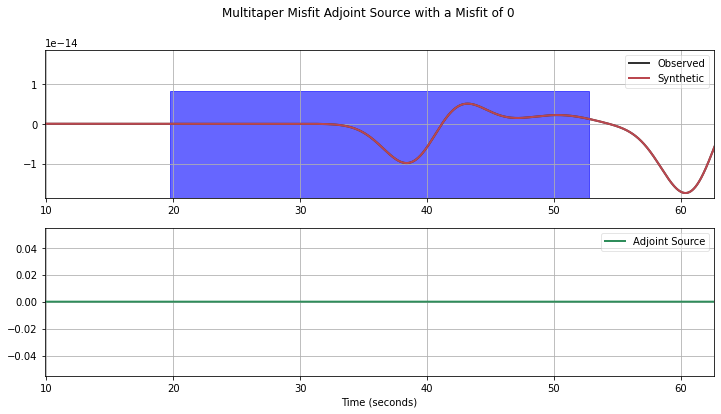

0.0
[[26.9593382632249, 59.9593382632249]]
AA S0013


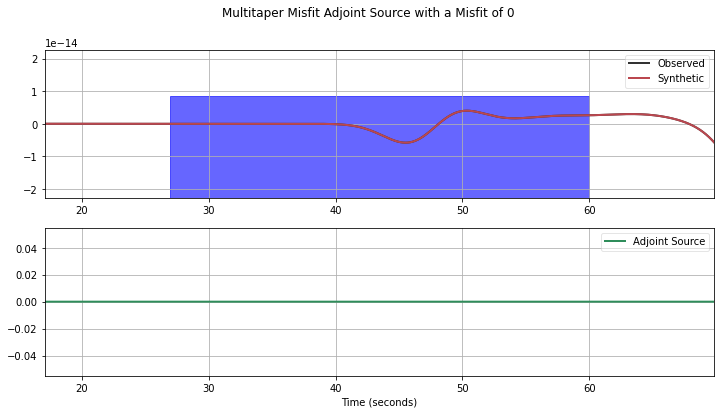

0.0
[[34.538578336728634, 67.538578336728634]]
AA S0014


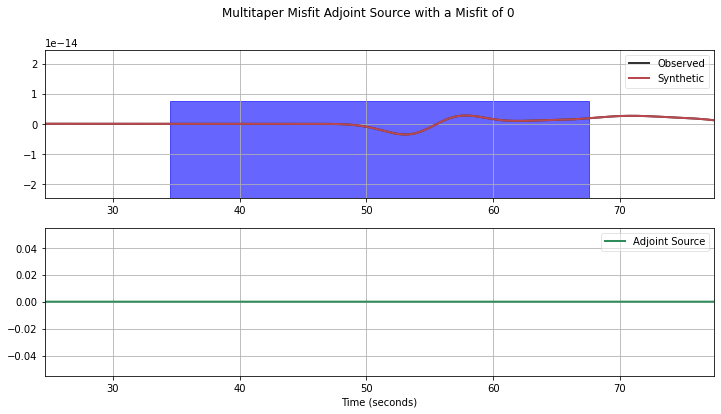

0.0
[[42.305314003568114, 75.305314003568114]]
AA S0015


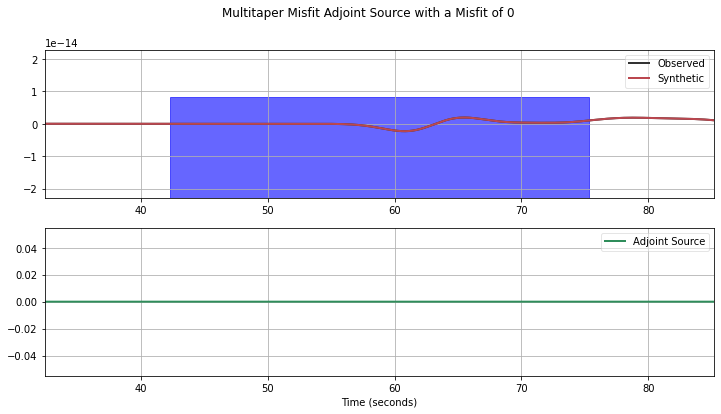

0.0
[[50.17448281616079, 83.17448281616079]]
AA S0016


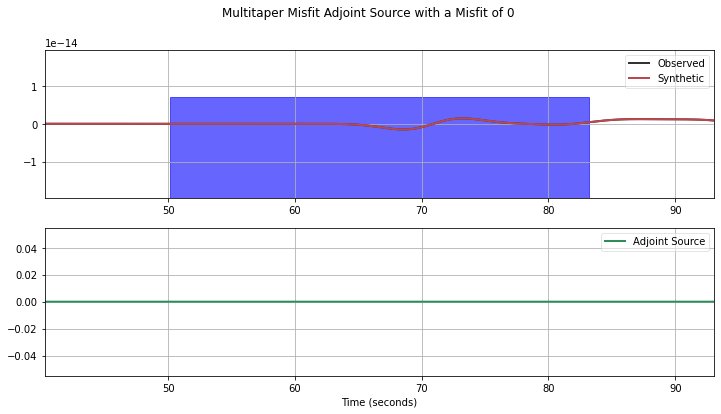

0.0
[[58.104118295881179, 91.104118295881179]]
AA S0017


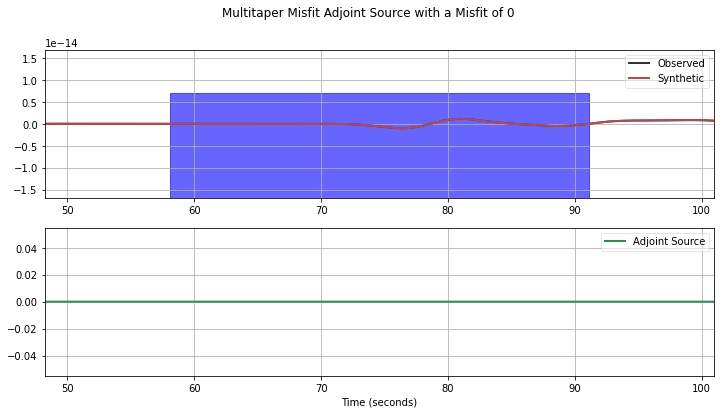

0.0
[[66.071757784638635, 99.071757784638635]]
AA S0018


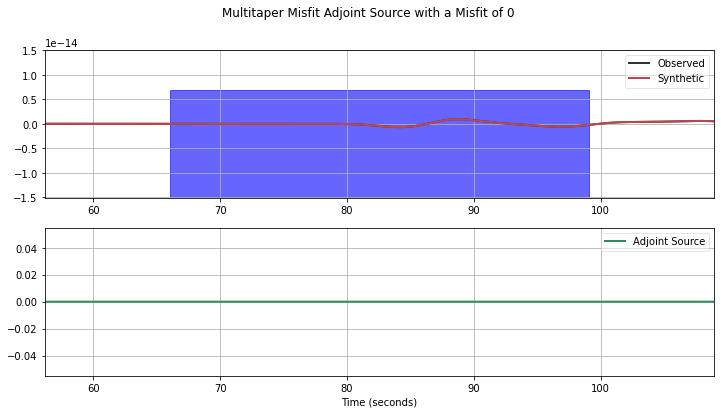

0.0
[[74.064207786582159, 107.06420778658216]]
AA S0019


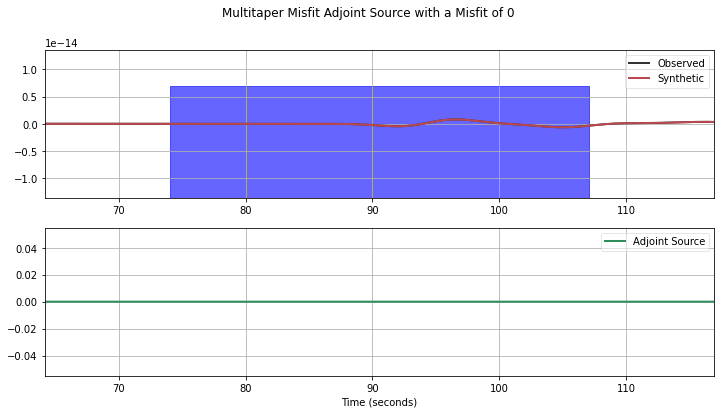

0.0
[[82.073488500080359, 115.07348850008036]]
AA S0020


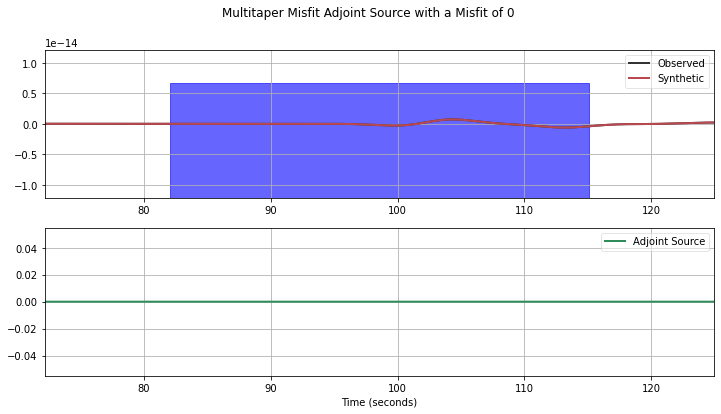

0.0
[[90.094122383223336, 123.09412238322334]]
AA S0021


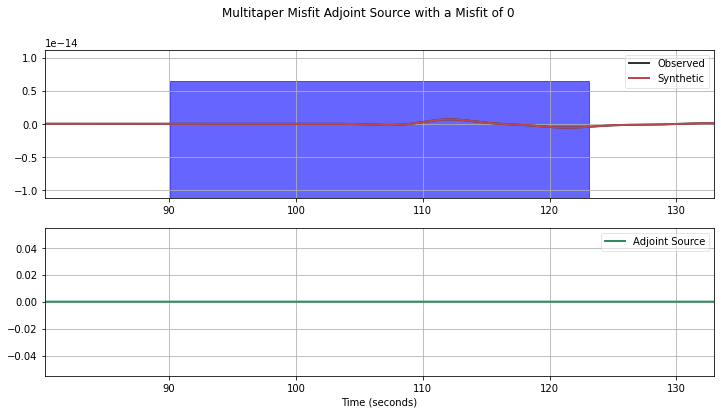

0.0
[[98.122416813493572, 131.12241681349357]]
AA S0022


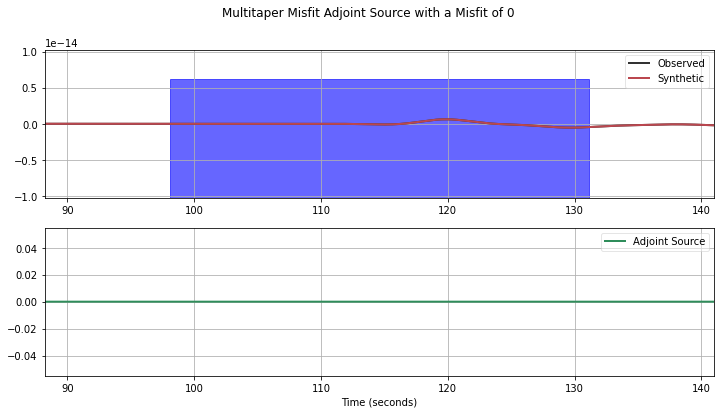

0.0
[[106.15560248039969, 139.15560248039969]]
AA S0023


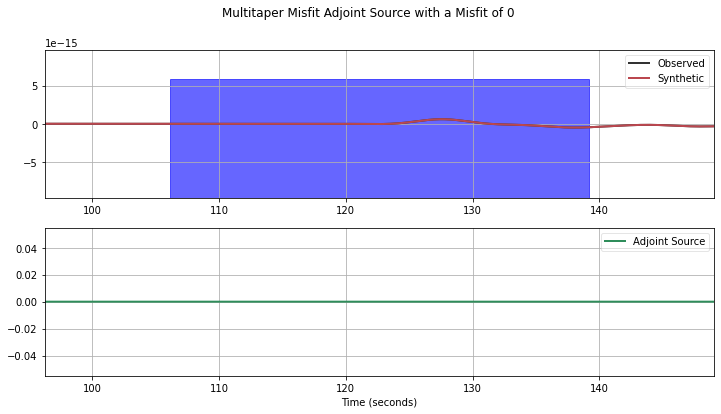

0.0
[[114.19096912726654, 147.19096912726656]]
AA S0024


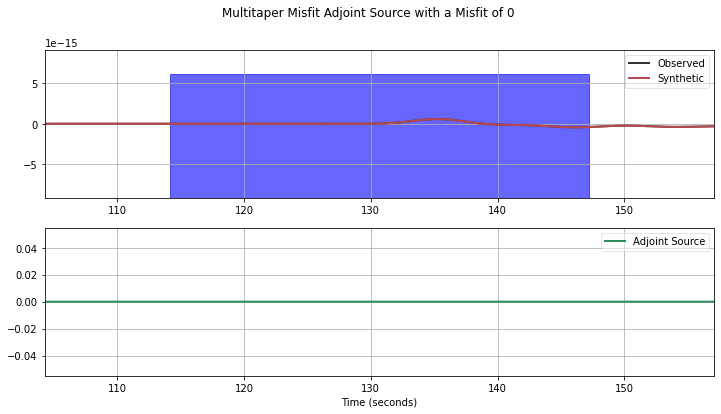

0.0
[[122.1998217811215, 155.1998217811215]]
AA S0025


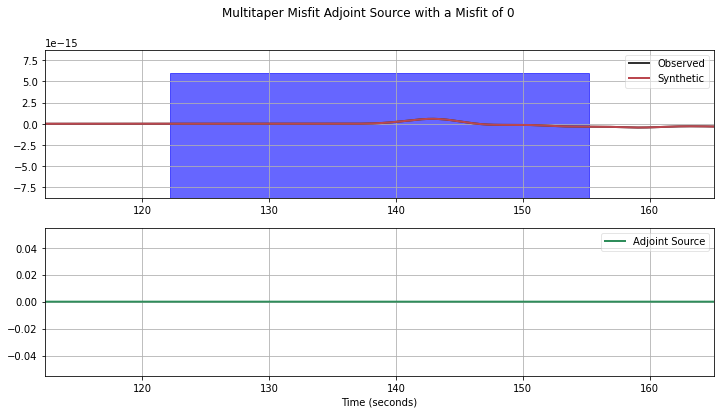

0.0
[[130.16728303744952, 163.16728303744952]]
AA S0026


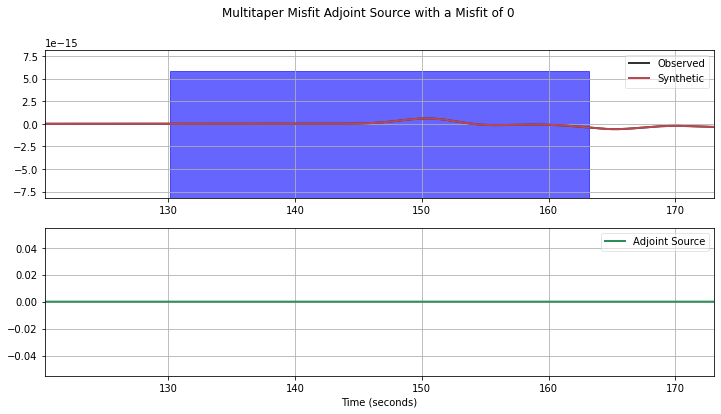

0.0
[[138.09698880499246, 171.09698880499246]]
AA S0027


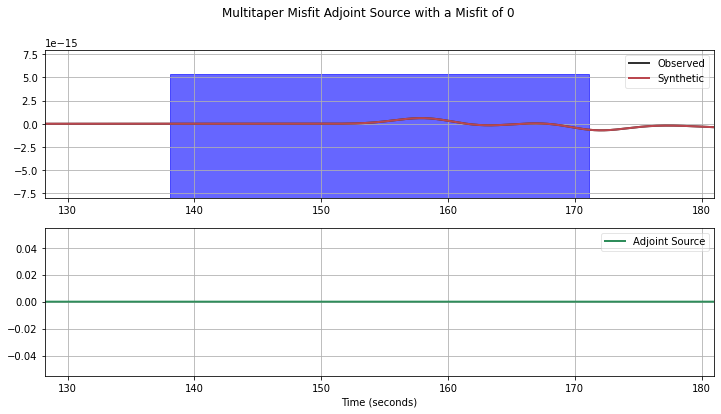

0.0
[[145.98868709829628, 178.98868709829628]]
AA S0028


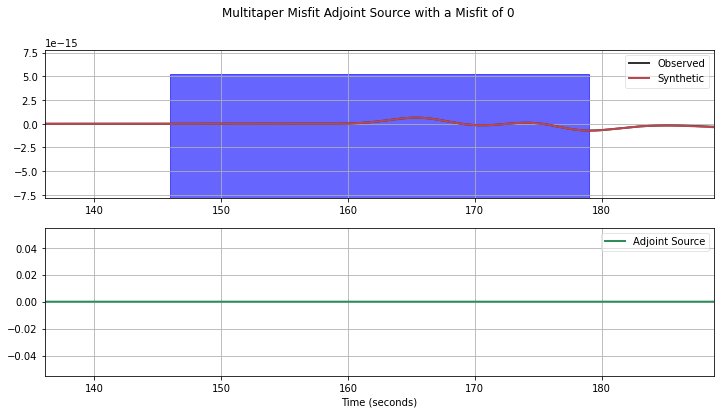

0.0
[[153.84156624047031, 186.84156624047031]]
AA S0029


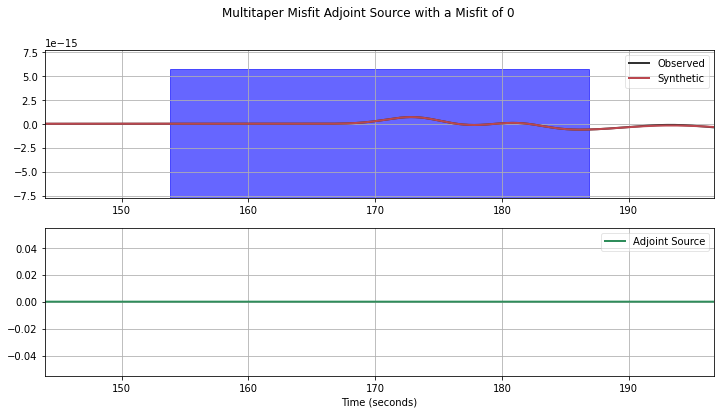

0.0
[[161.65419992237798, 194.65419992237798]]
AA S0030


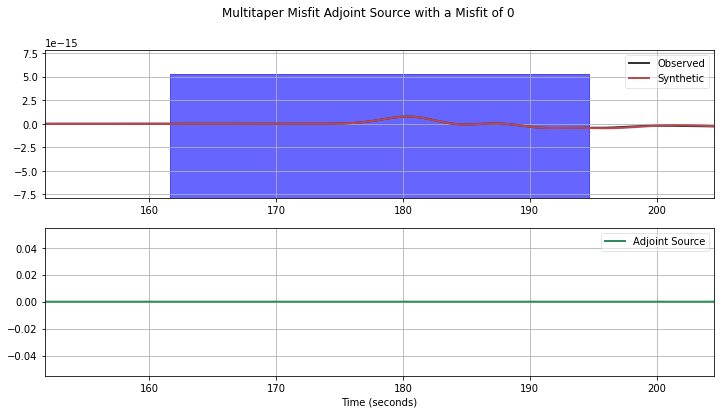

0.0
[[169.42535444510764, 202.42535444510764]]
AA S0031


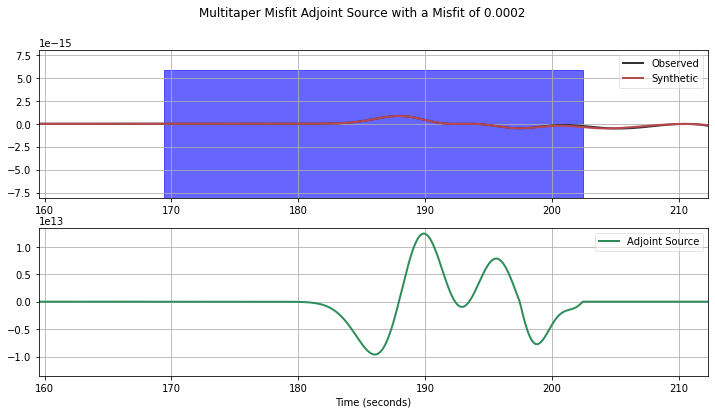

0.0002
[[177.153862641465, 210.153862641465]]
AA S0032


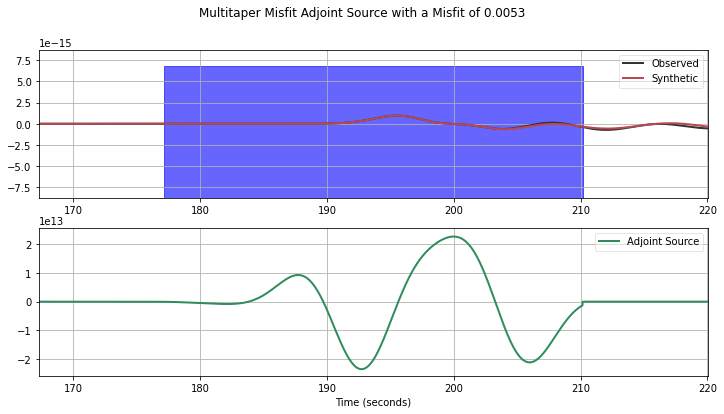

0.00530026959703
[[184.78072567909774, 217.78072567909774]]
AA S0033


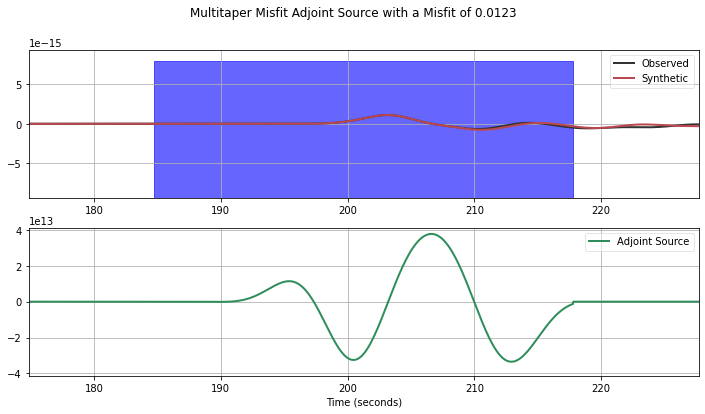

0.0123093257051
[[192.31484962983203, 225.31484962983203]]
AA S0034


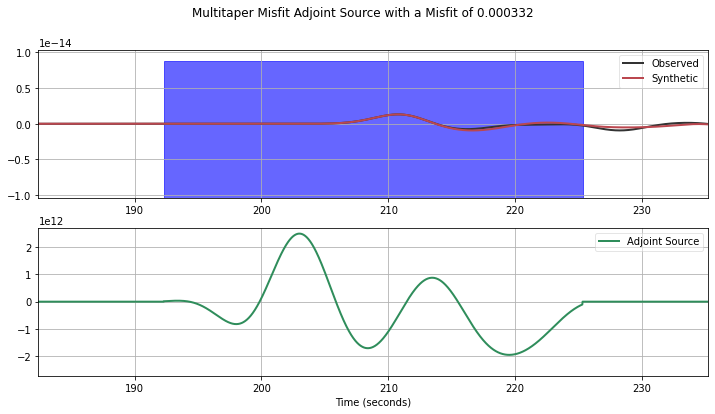

0.000332119614963
[[199.7740494901571, 232.7740494901571]]
AA S0035


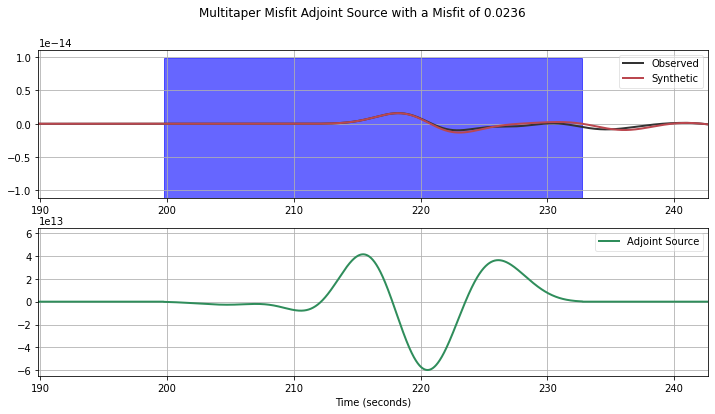

0.0235702292272
[[207.16049675570545, 240.16049675570545]]
AA S0036


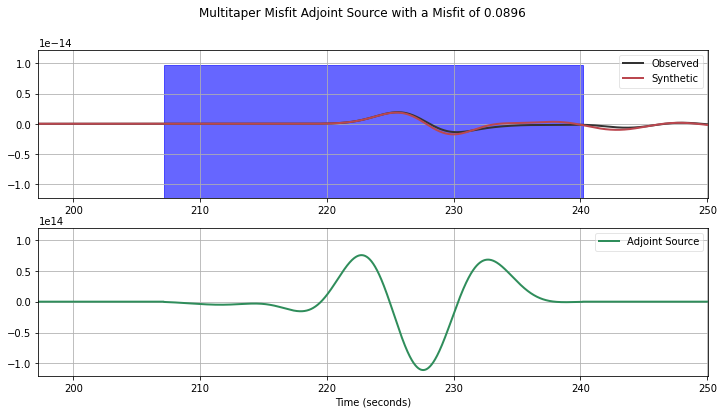

0.0896362833449
[[214.47473555261701, 247.47473555261701]]
AA S0037


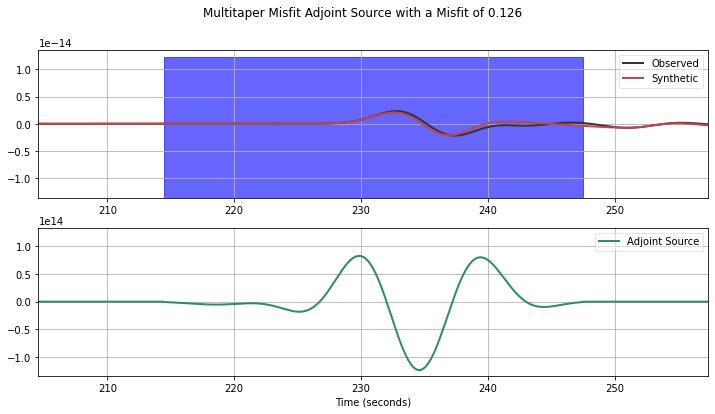

0.126187574158
[[221.68205659134151, 254.68205659134151]]
AA S0038


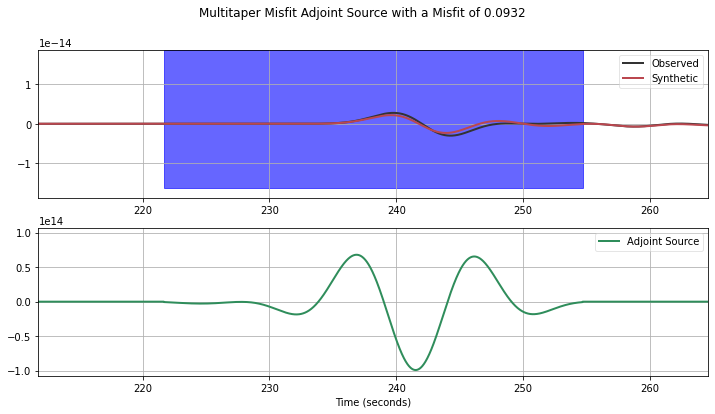

0.0931604271436
[[228.20902223285583, 261.20902223285583]]
AA S0039


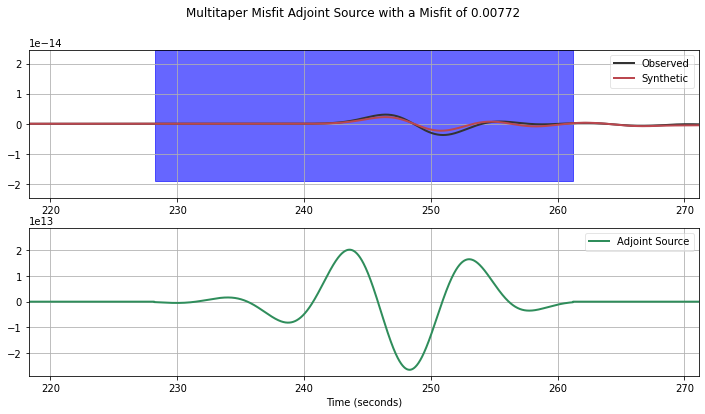

0.00771804357359
[[234.71415717353179, 267.71415717353182]]
AA S0040


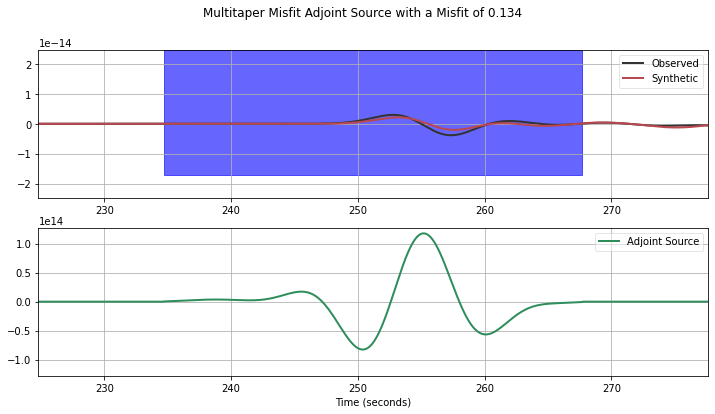

0.134228127352
[[241.19399721985735, 274.19399721985735]]
AA S0041


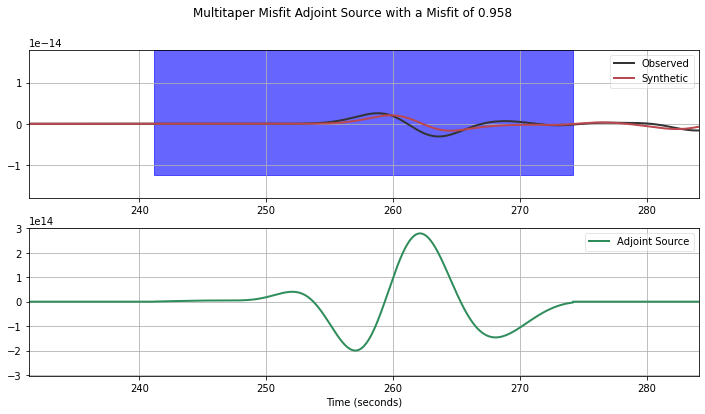

0.957560667438
[[247.64485079034847, 280.64485079034847]]
AA S0042


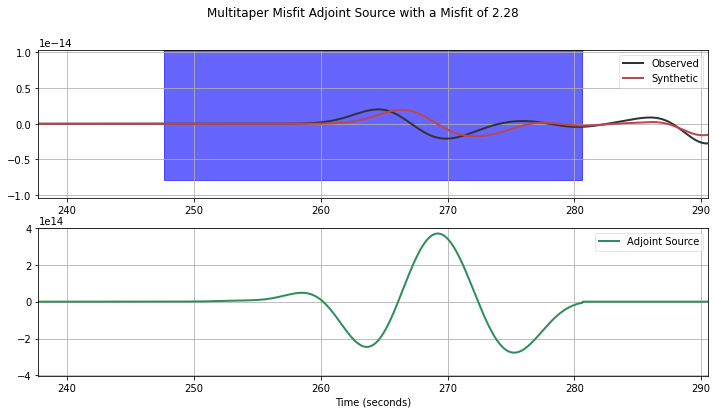

2.27595679225
[[254.06331299811671, 287.06331299811671]]
AA S0043


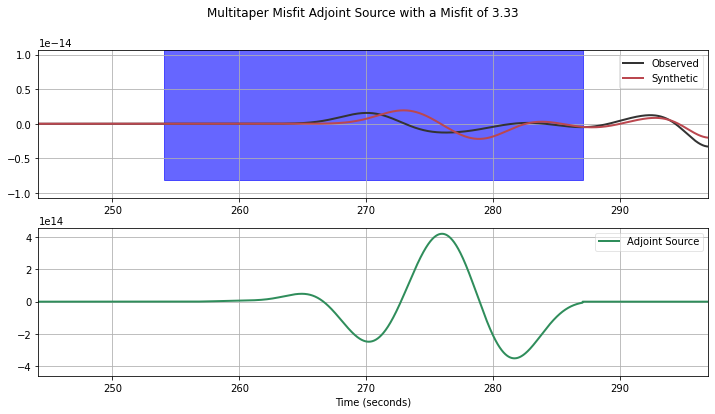

3.3345059508
[[260.44585462195107, 293.44585462195107]]
AA S0044


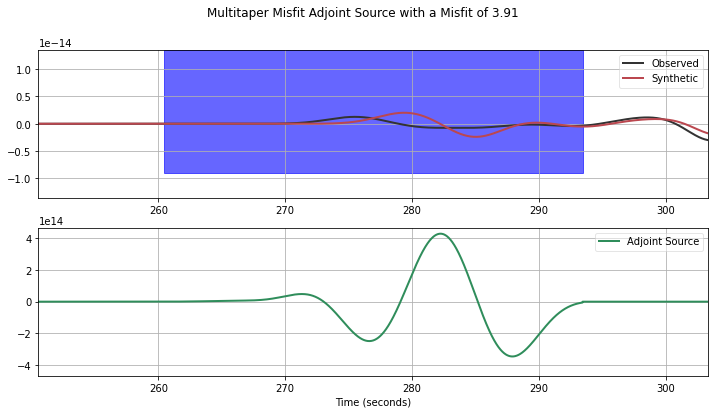

3.91442169798
[[266.78944300296473, 299.78944300296473]]
AA S0045


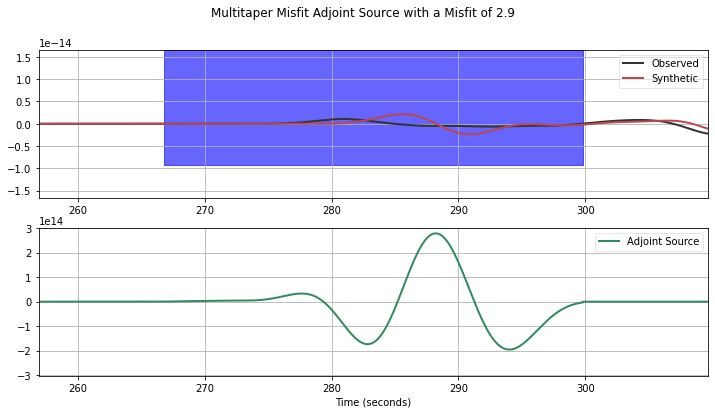

2.89735838129
[[273.09100161480694, 306.09100161480694]]
AA S0046


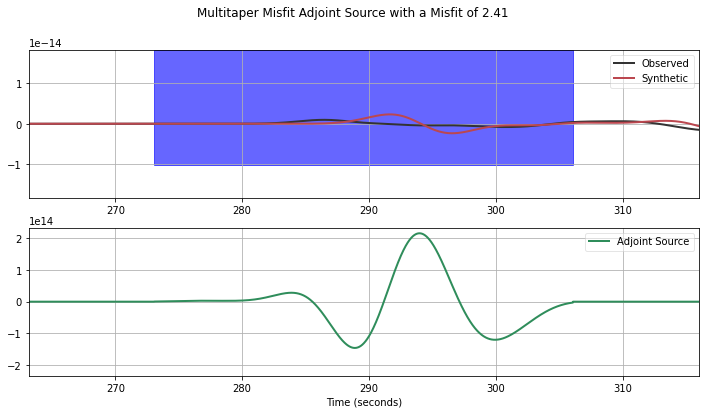

2.41145244228
[[279.34759765895694, 312.34759765895694]]
AA S0047


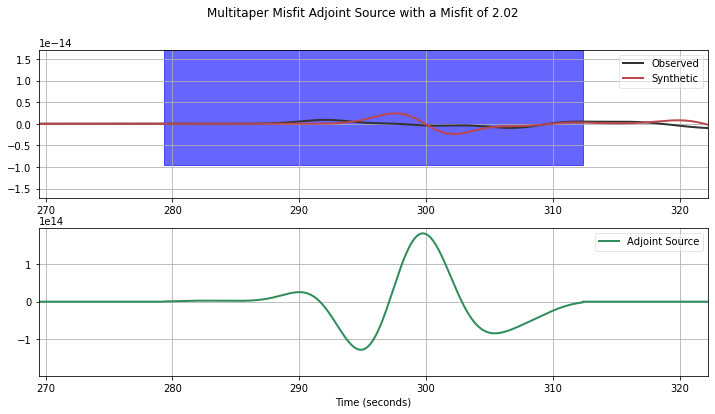

2.01825996889
[[285.15836469267606, 318.15836469267606]]
AA S0048


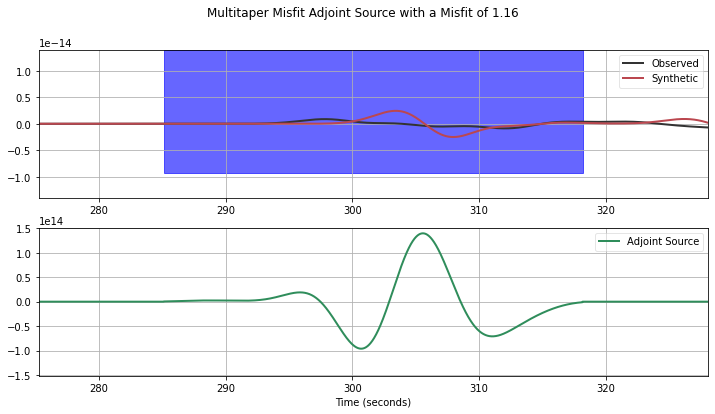

1.15708592236
[[290.57770898380215, 323.57770898380215]]
AA S0049


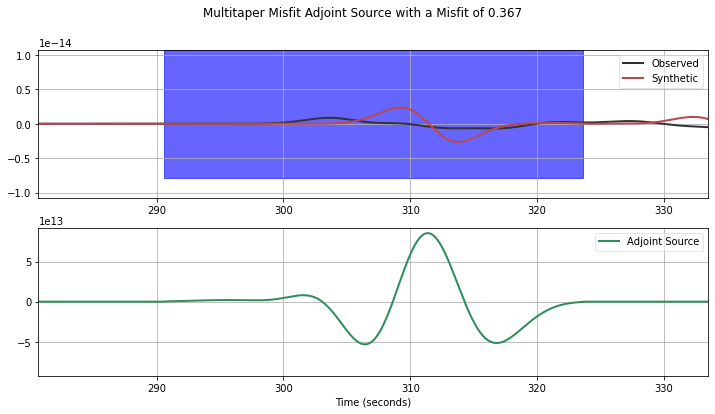

0.367300830664
[[295.98400646310421, 328.98400646310421]]
AA S0050


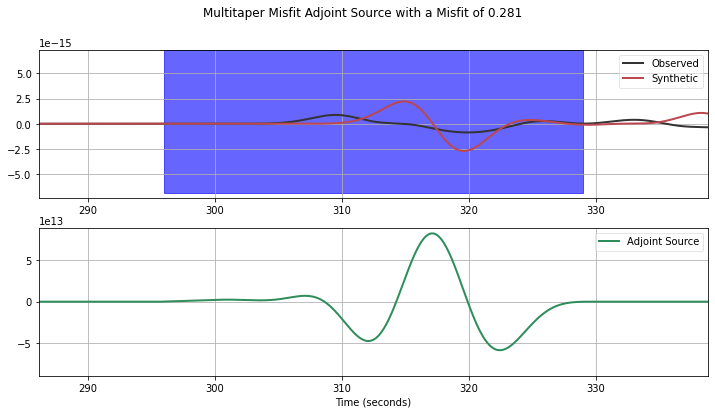

0.280771375416
[[301.37584373228822, 334.37584373228822]]
AA S0051


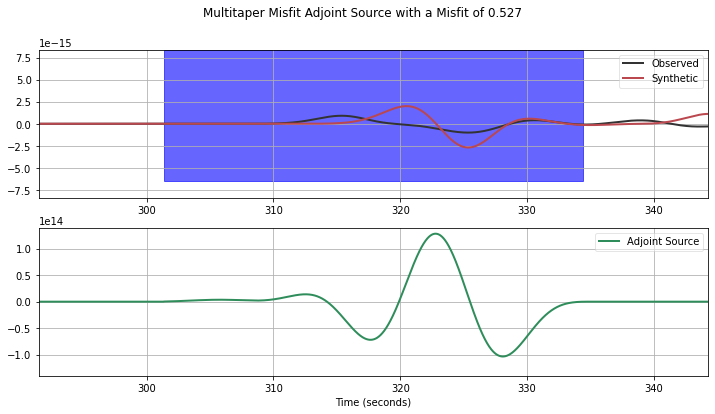

0.527133273849
[[306.75159987378356, 339.75159987378356]]
AA S0052


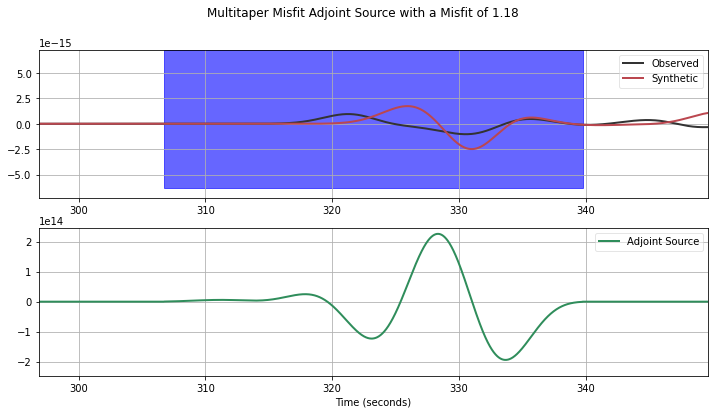

1.18160714824
[[312.11015066535856, 345.11015066535856]]
AA S0053


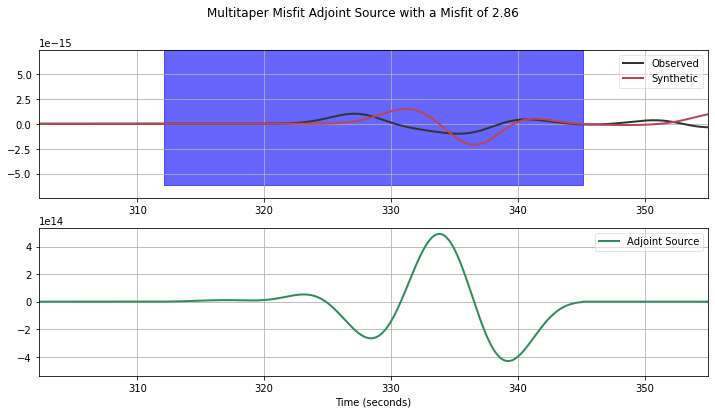

2.85836911067
[[317.44975731658263, 350.44975731658263]]
AA S0054


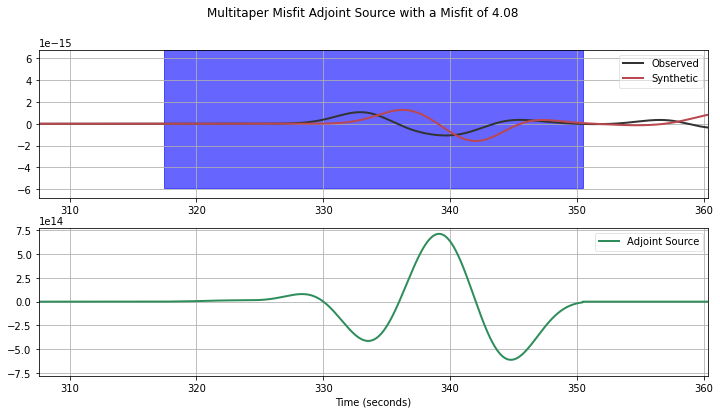

4.07970509414
[[322.76884768385122, 355.76884768385122]]
AA S0055


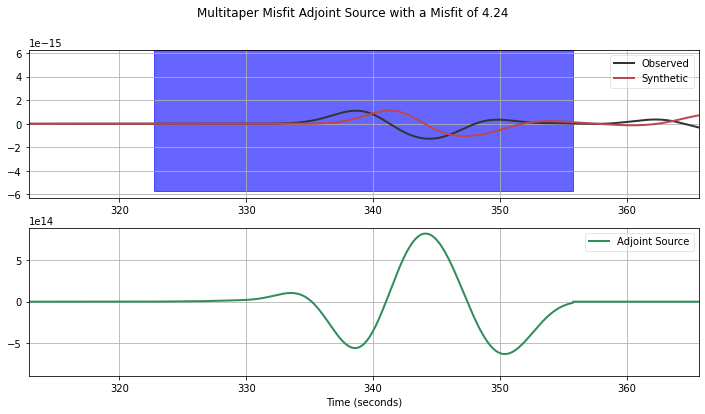

4.23786555832
[[328.06621508836622, 361.06621508836622]]
AA S0056


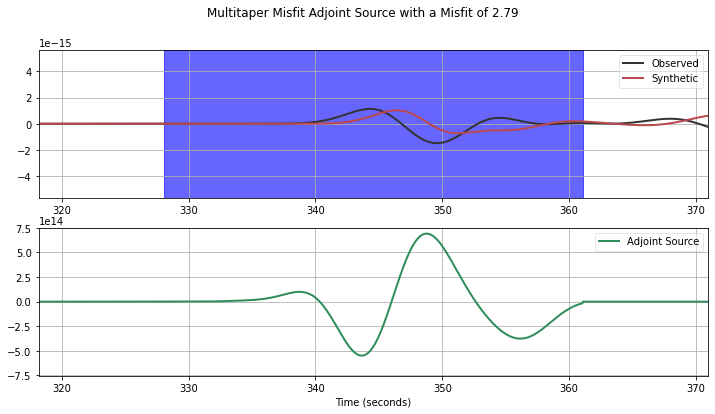

2.78586205677
[[333.34018092144828, 366.34018092144828]]
AA S0057


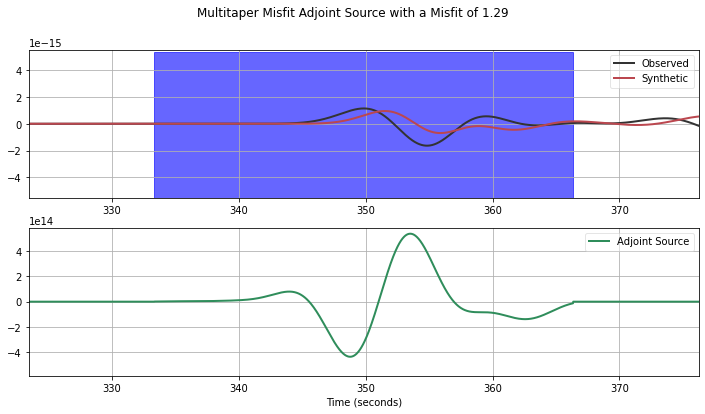

1.29041340036
[[338.59518015658455, 371.59518015658455]]
AA S0058


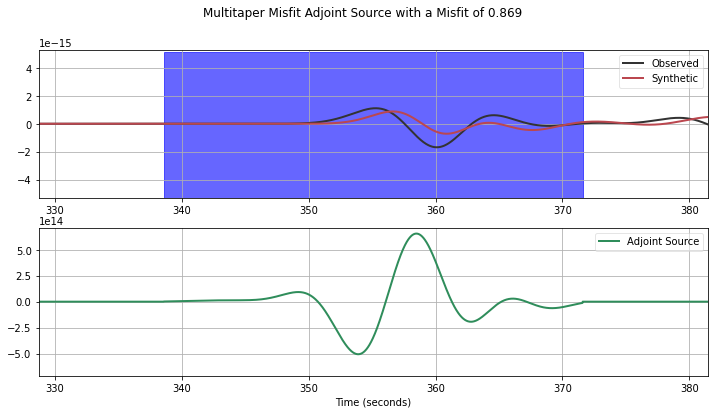

0.868655408556
[[343.84319620132919, 376.84319620132919]]
AA S0059


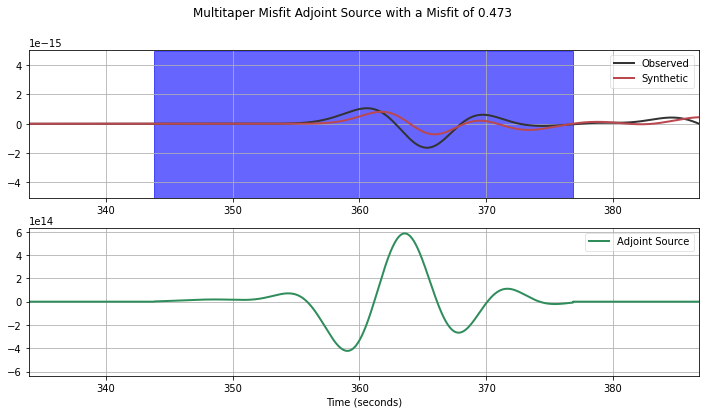

0.472612829385
[[349.08083668973751, 382.08083668973751]]
AA S0060


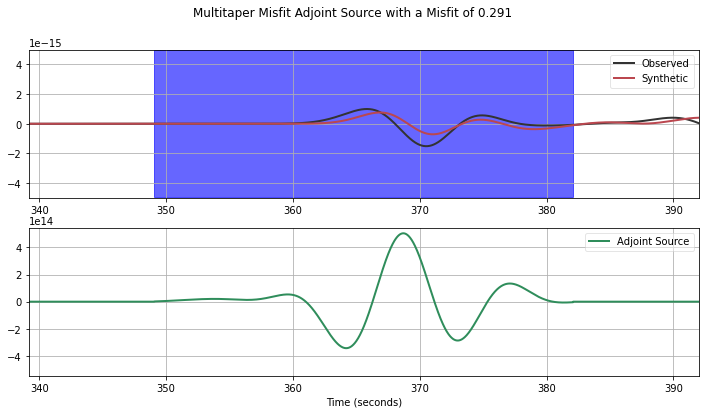

0.291242830604


In [5]:
PROJECT='/data2/yjgao/data/DATASET/package_forthesis/'
import numpy as np
import matplotlib.pyplot as plt
import os
list_events=['EVENT1']
for _i, event in enumerate(list_events):
    adj_calculate(PROJECT,event,'REF_SEM/','REF_SEM_SYN/','multitaper_misfit')

[[64.931682194878661, 97.931682194878661]]
AA S0001
AA.S0001..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:01:04.931682Z 1970-01-01T00:01:37.931682Z
True
AA.S0001..BXZ | 1970-01-01T00:01:04.940000Z - 1970-01-01T00:01:37.940000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:01:04.931682Z 1970-01-01T00:01:37.931682Z
True
AA.S0001..BXZ | 1970-01-01T00:01:04.940000Z - 1970-01-01T00:01:37.940000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.284802220117 0.284802220117
{'misfit': 0.28480222011663181, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


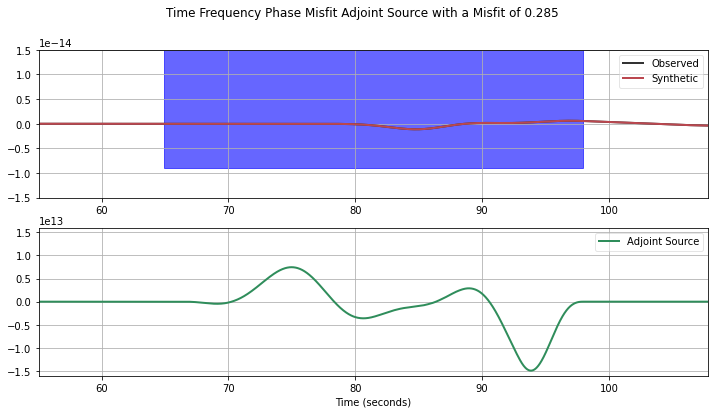

0.284802220117
[[56.968614525035761, 89.968614525035761]]
AA S0002
AA.S0002..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:56.968615Z 1970-01-01T00:01:29.968615Z
True
AA.S0002..BXZ | 1970-01-01T00:00:56.960000Z - 1970-01-01T00:01:29.960000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:56.968615Z 1970-01-01T00:01:29.968615Z
True
AA.S0002..BXZ | 1970-01-01T00:00:56.960000Z - 1970-01-01T00:01:29.960000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.294761065312 0.294761065312
{'misfit': 0.2947610653123609, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


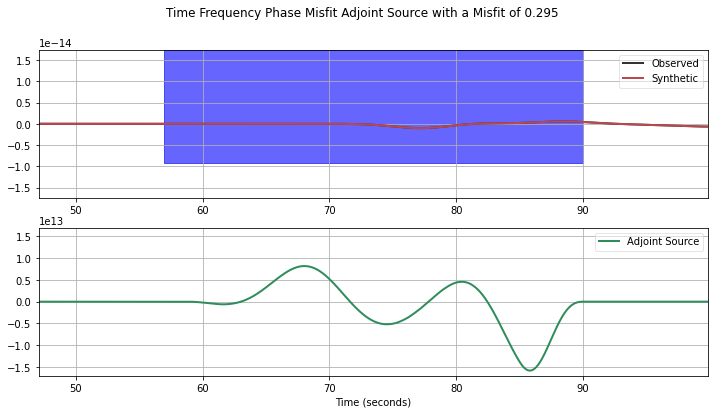

0.294761065312
[[49.045958950547487, 82.045958950547487]]
AA S0003
AA.S0003..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:49.045959Z 1970-01-01T00:01:22.045959Z
True
AA.S0003..BXZ | 1970-01-01T00:00:49.040000Z - 1970-01-01T00:01:22.040000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:49.045959Z 1970-01-01T00:01:22.045959Z
True
AA.S0003..BXZ | 1970-01-01T00:00:49.040000Z - 1970-01-01T00:01:22.040000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.215318480878 0.215318480878
{'misfit': 0.21531848087832001, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


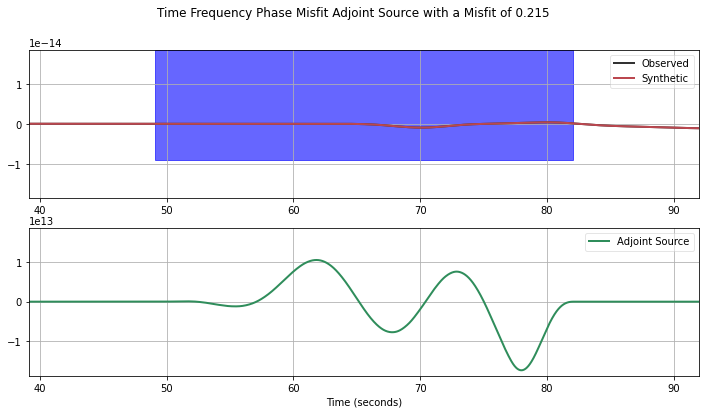

0.215318480878
[[41.188207002335105, 74.188207002335105]]
AA S0004
AA.S0004..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:41.188207Z 1970-01-01T00:01:14.188207Z
True
AA.S0004..BXZ | 1970-01-01T00:00:41.180000Z - 1970-01-01T00:01:14.180000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:41.188207Z 1970-01-01T00:01:14.188207Z
True
AA.S0004..BXZ | 1970-01-01T00:00:41.180000Z - 1970-01-01T00:01:14.180000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.132575379944 0.132575379944
{'misfit': 0.13257537994444599, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


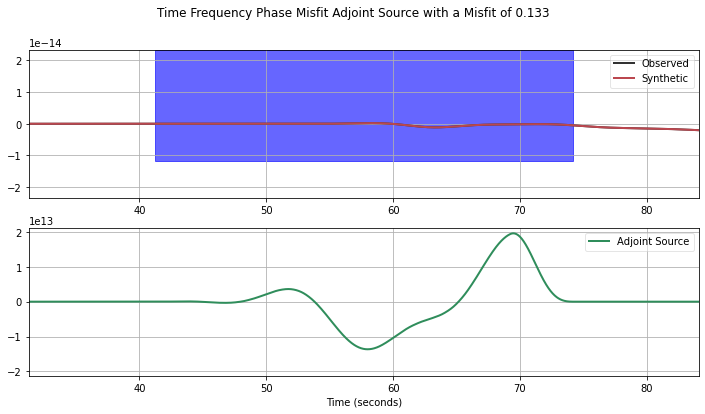

0.132575379944
[[33.441285028256871, 66.441285028256871]]
AA S0005
AA.S0005..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:33.441285Z 1970-01-01T00:01:06.441285Z
True
AA.S0005..BXZ | 1970-01-01T00:00:33.440000Z - 1970-01-01T00:01:06.440000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:33.441285Z 1970-01-01T00:01:06.441285Z
True
AA.S0005..BXZ | 1970-01-01T00:00:33.440000Z - 1970-01-01T00:01:06.440000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.409979645975 0.409979645975
{'misfit': 0.40997964597479797, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


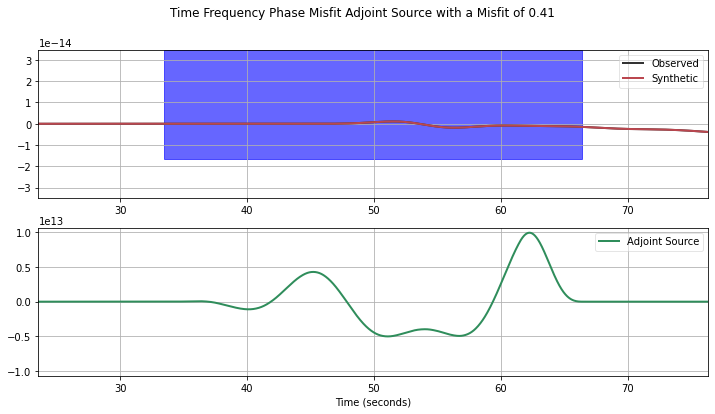

0.409979645975
[[25.901001596526484, 58.901001596526484]]
AA S0006
AA.S0006..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:25.901002Z 1970-01-01T00:00:58.901002Z
True
AA.S0006..BXZ | 1970-01-01T00:00:25.900000Z - 1970-01-01T00:00:58.900000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:25.901002Z 1970-01-01T00:00:58.901002Z
True
AA.S0006..BXZ | 1970-01-01T00:00:25.900000Z - 1970-01-01T00:00:58.900000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.416579693783 0.416579693783
{'misfit': 0.41657969378346493, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


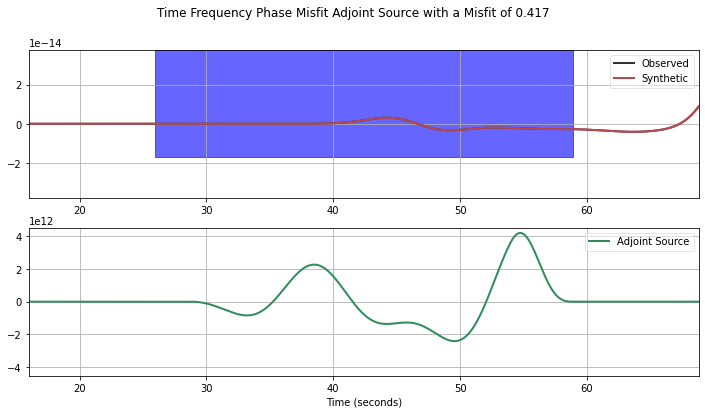

0.416579693783
[[18.789396418444827, 51.789396418444824]]
AA S0007
AA.S0007..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:18.789396Z 1970-01-01T00:00:51.789396Z
True
AA.S0007..BXZ | 1970-01-01T00:00:18.780000Z - 1970-01-01T00:00:51.780000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:18.789396Z 1970-01-01T00:00:51.789396Z
True
AA.S0007..BXZ | 1970-01-01T00:00:18.780000Z - 1970-01-01T00:00:51.780000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.268242619738 0.268242619738
{'misfit': 0.26824261973849078, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


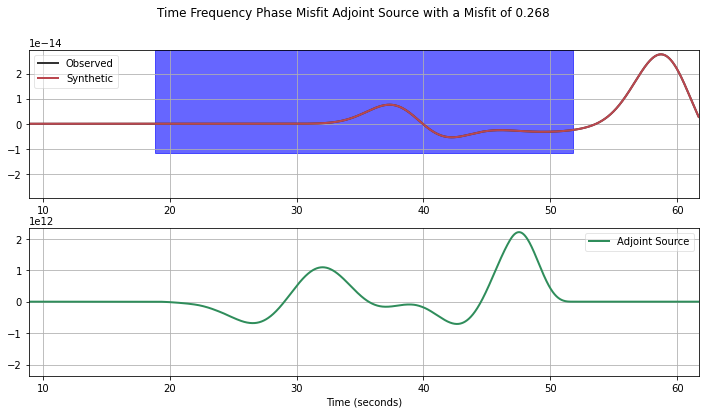

0.268242619738
[[12.668750701702812, 45.668750701702812]]
AA S0008
AA.S0008..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:12.668751Z 1970-01-01T00:00:45.668751Z
True
AA.S0008..BXZ | 1970-01-01T00:00:12.660000Z - 1970-01-01T00:00:45.660000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:12.668751Z 1970-01-01T00:00:45.668751Z
True
AA.S0008..BXZ | 1970-01-01T00:00:12.660000Z - 1970-01-01T00:00:45.660000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.22427219265 0.22427219265
{'misfit': 0.22427219265016785, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


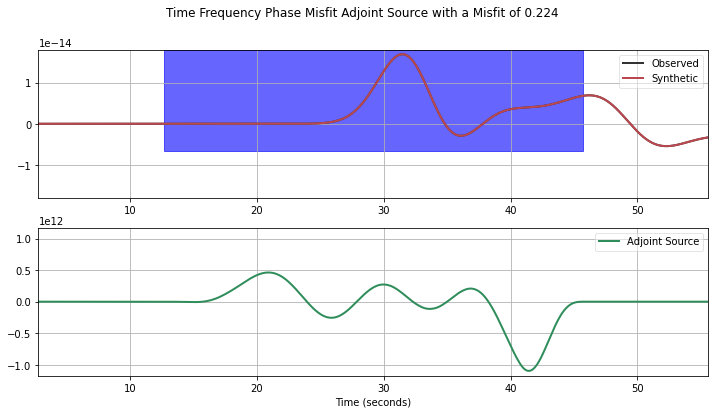

0.22427219265
[[8.872367957285924, 41.872367957285924]]
AA S0009
AA.S0009..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:08.872368Z 1970-01-01T00:00:41.872368Z
True
AA.S0009..BXZ | 1970-01-01T00:00:08.880000Z - 1970-01-01T00:00:41.880000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:08.872368Z 1970-01-01T00:00:41.872368Z
True
AA.S0009..BXZ | 1970-01-01T00:00:08.880000Z - 1970-01-01T00:00:41.880000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.140140448259 0.140140448259
{'misfit': 0.14014044825897798, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


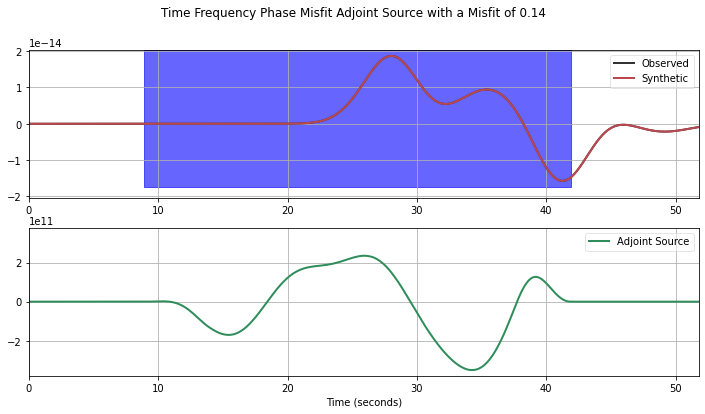

0.140140448259
[[9.1964102017034008, 42.196410201703401]]
AA S0010
AA.S0010..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:09.196410Z 1970-01-01T00:00:42.196410Z
True
AA.S0010..BXZ | 1970-01-01T00:00:09.200000Z - 1970-01-01T00:00:42.200000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:09.196410Z 1970-01-01T00:00:42.196410Z
True
AA.S0010..BXZ | 1970-01-01T00:00:09.200000Z - 1970-01-01T00:00:42.200000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.318504963527 0.318504963527
{'misfit': 0.31850496352725582, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


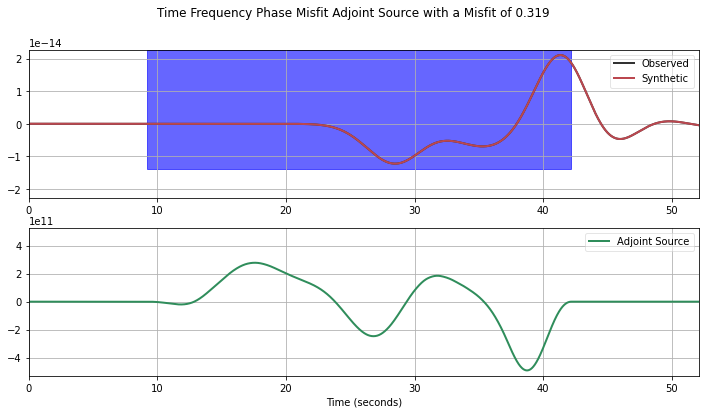

0.318504963527
[[13.44310352760726, 46.443103527607263]]
AA S0011
AA.S0011..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:13.443104Z 1970-01-01T00:00:46.443104Z
True
AA.S0011..BXZ | 1970-01-01T00:00:13.440000Z - 1970-01-01T00:00:46.440000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:13.443104Z 1970-01-01T00:00:46.443104Z
True
AA.S0011..BXZ | 1970-01-01T00:00:13.440000Z - 1970-01-01T00:00:46.440000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.211467798104 0.211467798104
{'misfit': 0.21146779810363922, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


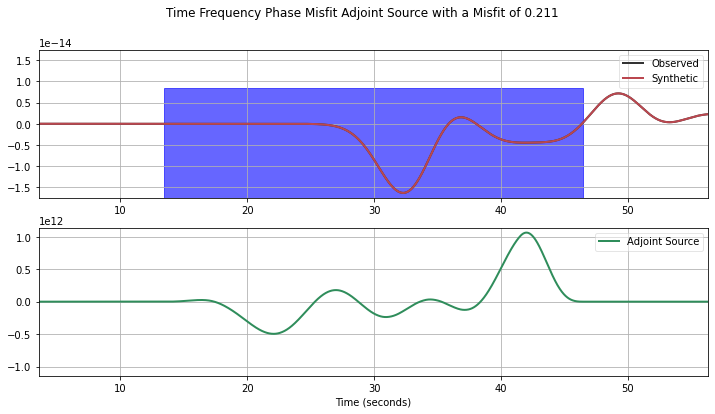

0.211467798104
[[19.763749351428846, 52.763749351428842]]
AA S0012
AA.S0012..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:19.763749Z 1970-01-01T00:00:52.763749Z
True
AA.S0012..BXZ | 1970-01-01T00:00:19.760000Z - 1970-01-01T00:00:52.760000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:19.763749Z 1970-01-01T00:00:52.763749Z
True
AA.S0012..BXZ | 1970-01-01T00:00:19.760000Z - 1970-01-01T00:00:52.760000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.165893819208 0.165893819208
{'misfit': 0.16589381920754523, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


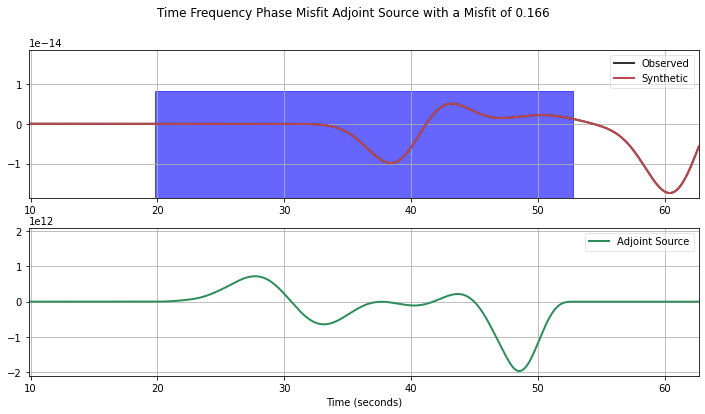

0.165893819208
[[26.9593382632249, 59.9593382632249]]
AA S0013
AA.S0013..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:26.959338Z 1970-01-01T00:00:59.959338Z
True
AA.S0013..BXZ | 1970-01-01T00:00:26.960000Z - 1970-01-01T00:00:59.960000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:26.959338Z 1970-01-01T00:00:59.959338Z
True
AA.S0013..BXZ | 1970-01-01T00:00:26.960000Z - 1970-01-01T00:00:59.960000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.272669055106 0.272669055106
{'misfit': 0.27266905510648598, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


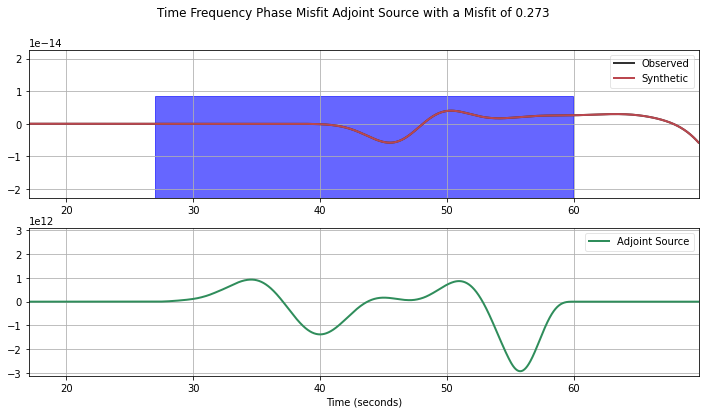

0.272669055106
[[34.538578336728634, 67.538578336728634]]
AA S0014
AA.S0014..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:34.538578Z 1970-01-01T00:01:07.538578Z
True
AA.S0014..BXZ | 1970-01-01T00:00:34.540000Z - 1970-01-01T00:01:07.540000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:34.538578Z 1970-01-01T00:01:07.538578Z
True
AA.S0014..BXZ | 1970-01-01T00:00:34.540000Z - 1970-01-01T00:01:07.540000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.23110608194 0.23110608194
{'misfit': 0.23110608193999252, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


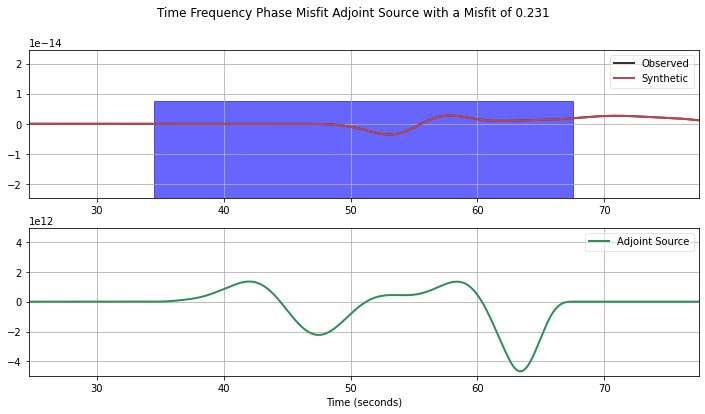

0.23110608194
[[42.305314003568114, 75.305314003568114]]
AA S0015
AA.S0015..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:42.305314Z 1970-01-01T00:01:15.305314Z
True
AA.S0015..BXZ | 1970-01-01T00:00:42.300000Z - 1970-01-01T00:01:15.300000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:42.305314Z 1970-01-01T00:01:15.305314Z
True
AA.S0015..BXZ | 1970-01-01T00:00:42.300000Z - 1970-01-01T00:01:15.300000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.110171296798 0.110171296798
{'misfit': 0.1101712967976016, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


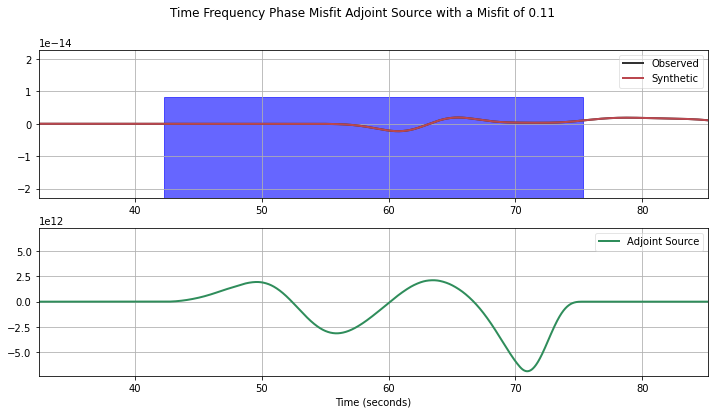

0.110171296798
[[50.17448281616079, 83.17448281616079]]
AA S0016
AA.S0016..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:50.174483Z 1970-01-01T00:01:23.174483Z
True
AA.S0016..BXZ | 1970-01-01T00:00:50.180000Z - 1970-01-01T00:01:23.180000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:50.174483Z 1970-01-01T00:01:23.174483Z
True
AA.S0016..BXZ | 1970-01-01T00:00:50.180000Z - 1970-01-01T00:01:23.180000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.0897272442653 0.0897272442653
{'misfit': 0.0897272442652821, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


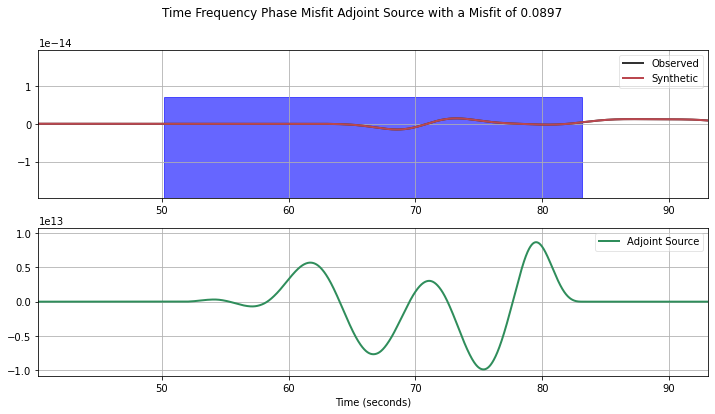

0.0897272442653
[[58.104118295881179, 91.104118295881179]]
AA S0017
AA.S0017..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:00:58.104118Z 1970-01-01T00:01:31.104118Z
True
AA.S0017..BXZ | 1970-01-01T00:00:58.100000Z - 1970-01-01T00:01:31.100000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:00:58.104118Z 1970-01-01T00:01:31.104118Z
True
AA.S0017..BXZ | 1970-01-01T00:00:58.100000Z - 1970-01-01T00:01:31.100000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.248933268568 0.248933268568
{'misfit': 0.24893326856797882, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


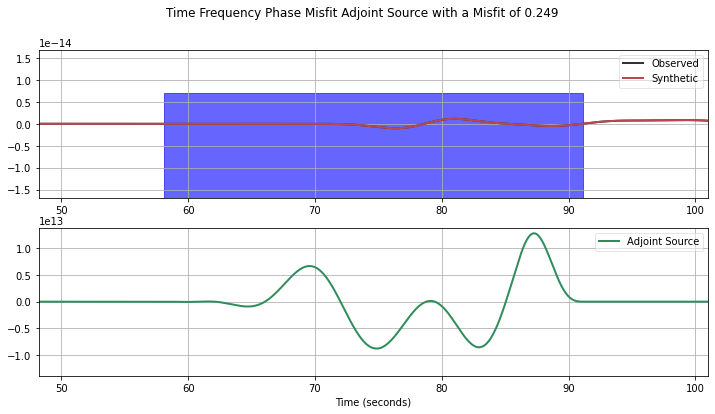

0.248933268568
[[66.071757784638635, 99.071757784638635]]
AA S0018
AA.S0018..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:01:06.071758Z 1970-01-01T00:01:39.071758Z
True
AA.S0018..BXZ | 1970-01-01T00:01:06.080000Z - 1970-01-01T00:01:39.080000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:01:06.071758Z 1970-01-01T00:01:39.071758Z
True
AA.S0018..BXZ | 1970-01-01T00:01:06.080000Z - 1970-01-01T00:01:39.080000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.390724243062 0.390724243062
{'misfit': 0.39072424306222092, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


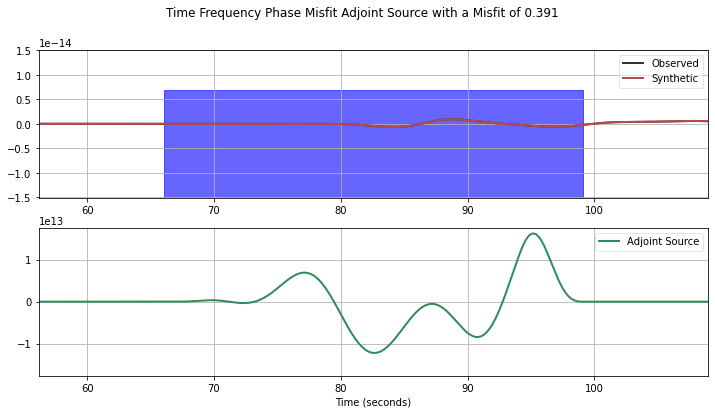

0.390724243062
[[74.064207786582159, 107.06420778658216]]
AA S0019
AA.S0019..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:01:14.064208Z 1970-01-01T00:01:47.064208Z
True
AA.S0019..BXZ | 1970-01-01T00:01:14.060000Z - 1970-01-01T00:01:47.060000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:01:14.064208Z 1970-01-01T00:01:47.064208Z
True
AA.S0019..BXZ | 1970-01-01T00:01:14.060000Z - 1970-01-01T00:01:47.060000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.506345974695 0.506345974695
{'misfit': 0.50634597469465015, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


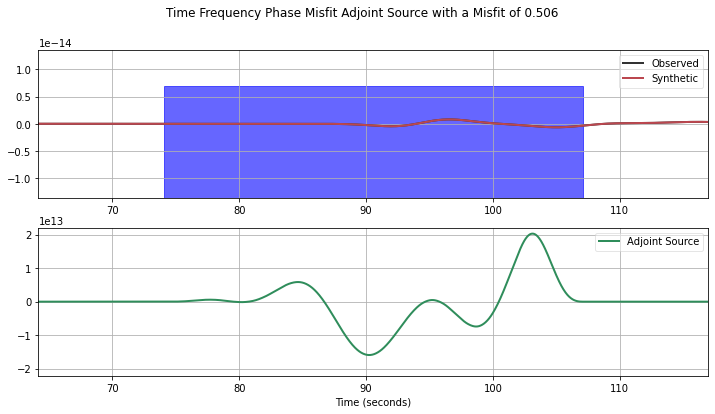

0.506345974695
[[82.073488500080359, 115.07348850008036]]
AA S0020
AA.S0020..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:01:22.073488Z 1970-01-01T00:01:55.073488Z
True
AA.S0020..BXZ | 1970-01-01T00:01:22.080000Z - 1970-01-01T00:01:55.080000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:01:22.073488Z 1970-01-01T00:01:55.073488Z
True
AA.S0020..BXZ | 1970-01-01T00:01:22.080000Z - 1970-01-01T00:01:55.080000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.575668806331 0.575668806331
{'misfit': 0.57566880633078077, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


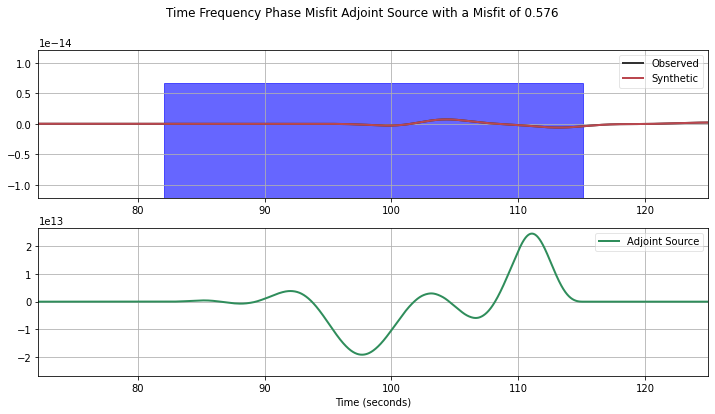

0.575668806331
[[90.094122383223336, 123.09412238322334]]
AA S0021
AA.S0021..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:01:30.094122Z 1970-01-01T00:02:03.094122Z
True
AA.S0021..BXZ | 1970-01-01T00:01:30.100000Z - 1970-01-01T00:02:03.100000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:01:30.094122Z 1970-01-01T00:02:03.094122Z
True
AA.S0021..BXZ | 1970-01-01T00:01:30.100000Z - 1970-01-01T00:02:03.100000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.581012371814 0.581012371814
{'misfit': 0.58101237181417376, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


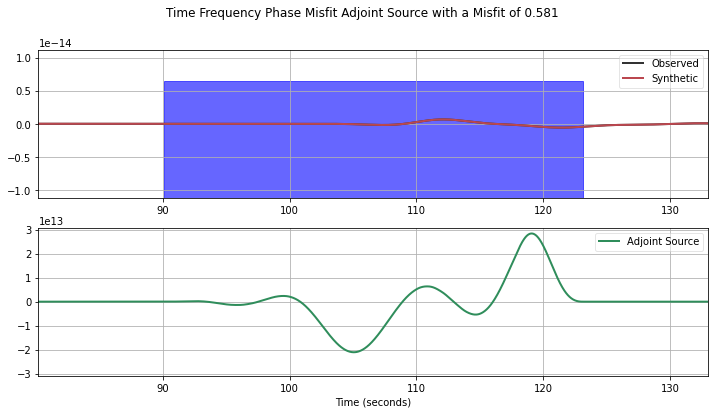

0.581012371814
[[98.122416813493572, 131.12241681349357]]
AA S0022
AA.S0022..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:01:38.122417Z 1970-01-01T00:02:11.122417Z
True
AA.S0022..BXZ | 1970-01-01T00:01:38.120000Z - 1970-01-01T00:02:11.120000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:01:38.122417Z 1970-01-01T00:02:11.122417Z
True
AA.S0022..BXZ | 1970-01-01T00:01:38.120000Z - 1970-01-01T00:02:11.120000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.545838119477 0.545838119477
{'misfit': 0.54583811947721628, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


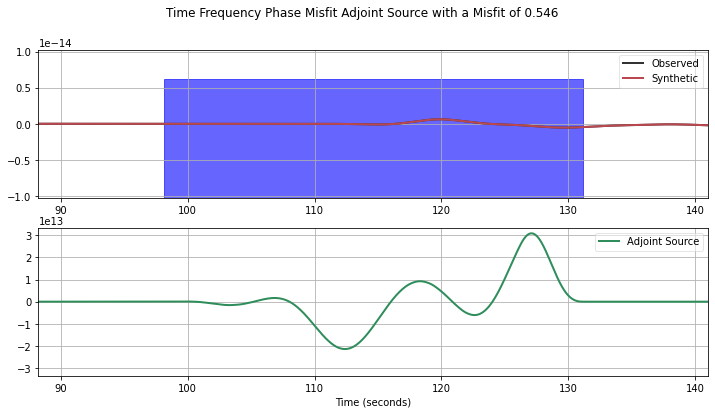

0.545838119477
[[106.15560248039969, 139.15560248039969]]
AA S0023
AA.S0023..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:01:46.155602Z 1970-01-01T00:02:19.155602Z
True
AA.S0023..BXZ | 1970-01-01T00:01:46.160000Z - 1970-01-01T00:02:19.160000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:01:46.155602Z 1970-01-01T00:02:19.155602Z
True
AA.S0023..BXZ | 1970-01-01T00:01:46.160000Z - 1970-01-01T00:02:19.160000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.492240727855 0.492240727855
{'misfit': 0.49224072785499889, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


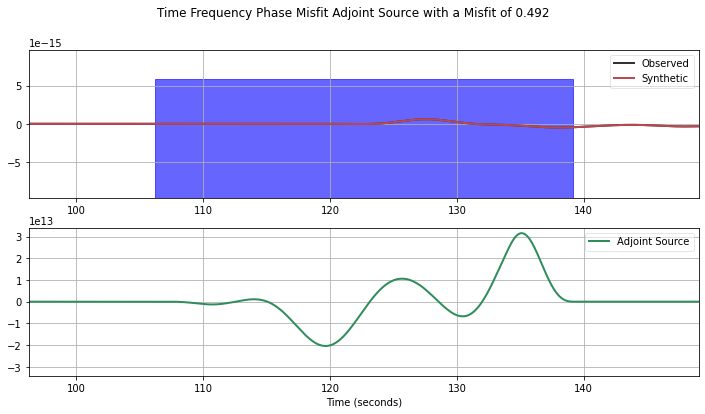

0.492240727855
[[114.19096912726654, 147.19096912726656]]
AA S0024
AA.S0024..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:01:54.190969Z 1970-01-01T00:02:27.190969Z
True
AA.S0024..BXZ | 1970-01-01T00:01:54.200000Z - 1970-01-01T00:02:27.200000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:01:54.190969Z 1970-01-01T00:02:27.190969Z
True
AA.S0024..BXZ | 1970-01-01T00:01:54.200000Z - 1970-01-01T00:02:27.200000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.425641138487 0.425641138487
{'misfit': 0.42564113848711421, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


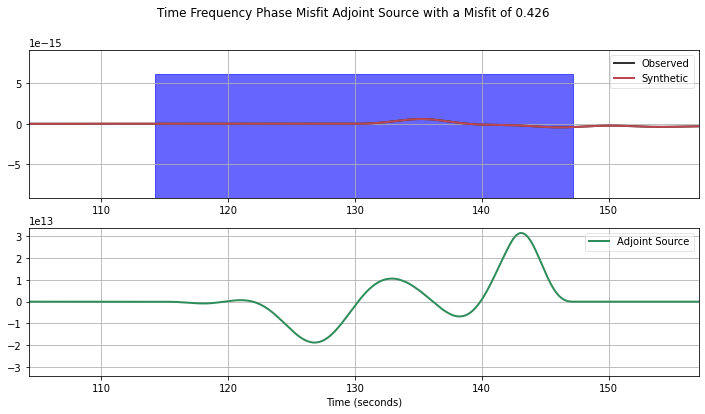

0.425641138487
[[122.1998217811215, 155.1998217811215]]
AA S0025
AA.S0025..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:02:02.199822Z 1970-01-01T00:02:35.199822Z
True
AA.S0025..BXZ | 1970-01-01T00:02:02.200000Z - 1970-01-01T00:02:35.200000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:02:02.199822Z 1970-01-01T00:02:35.199822Z
True
AA.S0025..BXZ | 1970-01-01T00:02:02.200000Z - 1970-01-01T00:02:35.200000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.327202560747 0.327202560747
{'misfit': 0.32720256074677551, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


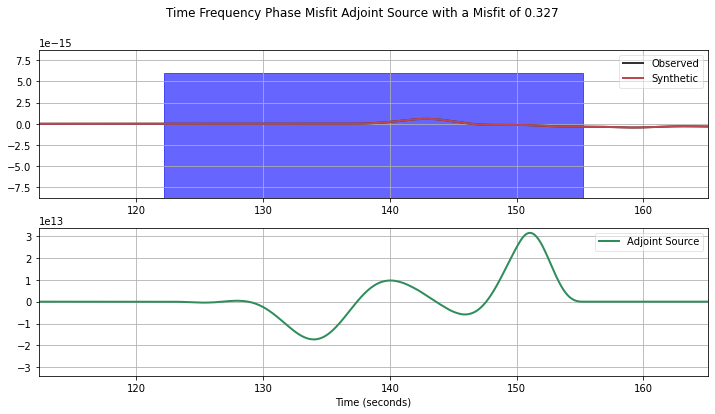

0.327202560747
[[130.16728303744952, 163.16728303744952]]
AA S0026
AA.S0026..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:02:10.167283Z 1970-01-01T00:02:43.167283Z
True
AA.S0026..BXZ | 1970-01-01T00:02:10.160000Z - 1970-01-01T00:02:43.160000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:02:10.167283Z 1970-01-01T00:02:43.167283Z
True
AA.S0026..BXZ | 1970-01-01T00:02:10.160000Z - 1970-01-01T00:02:43.160000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.187828541155 0.187828541155
{'misfit': 0.18782854115482508, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


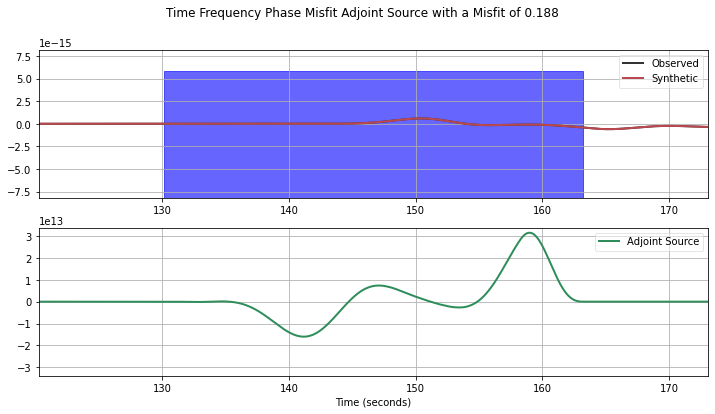

0.187828541155
[[138.09698880499246, 171.09698880499246]]
AA S0027
AA.S0027..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:02:18.096989Z 1970-01-01T00:02:51.096989Z
True
AA.S0027..BXZ | 1970-01-01T00:02:18.100000Z - 1970-01-01T00:02:51.100000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:02:18.096989Z 1970-01-01T00:02:51.096989Z
True
AA.S0027..BXZ | 1970-01-01T00:02:18.100000Z - 1970-01-01T00:02:51.100000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.1239623078 0.1239623078
{'misfit': 0.12396230780023183, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


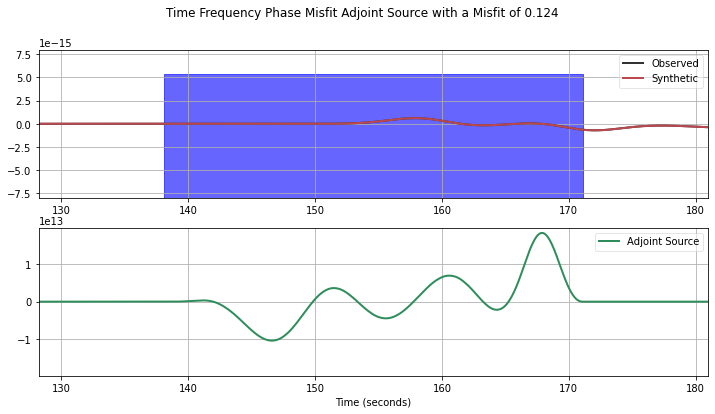

0.1239623078
[[145.98868709829628, 178.98868709829628]]
AA S0028
AA.S0028..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:02:25.988687Z 1970-01-01T00:02:58.988687Z
True
AA.S0028..BXZ | 1970-01-01T00:02:25.980000Z - 1970-01-01T00:02:58.980000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:02:25.988687Z 1970-01-01T00:02:58.988687Z
True
AA.S0028..BXZ | 1970-01-01T00:02:25.980000Z - 1970-01-01T00:02:58.980000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.251628301797 0.251628301797
{'misfit': 0.2516283017973231, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


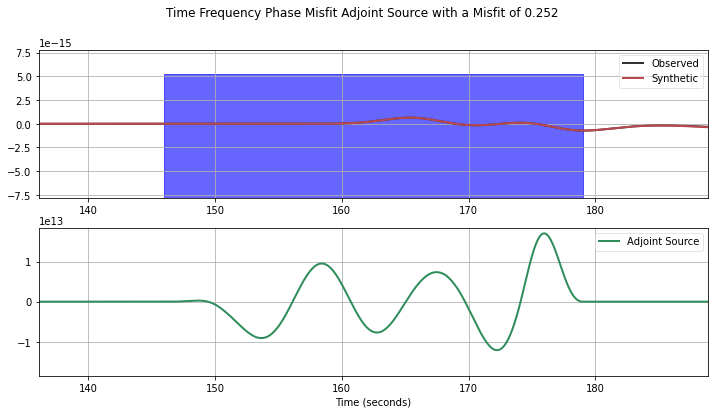

0.251628301797
[[153.84156624047031, 186.84156624047031]]
AA S0029
AA.S0029..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:02:33.841566Z 1970-01-01T00:03:06.841566Z
True
AA.S0029..BXZ | 1970-01-01T00:02:33.840000Z - 1970-01-01T00:03:06.840000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:02:33.841566Z 1970-01-01T00:03:06.841566Z
True
AA.S0029..BXZ | 1970-01-01T00:02:33.840000Z - 1970-01-01T00:03:06.840000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.399134726005 0.399134726005
{'misfit': 0.39913472600469524, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


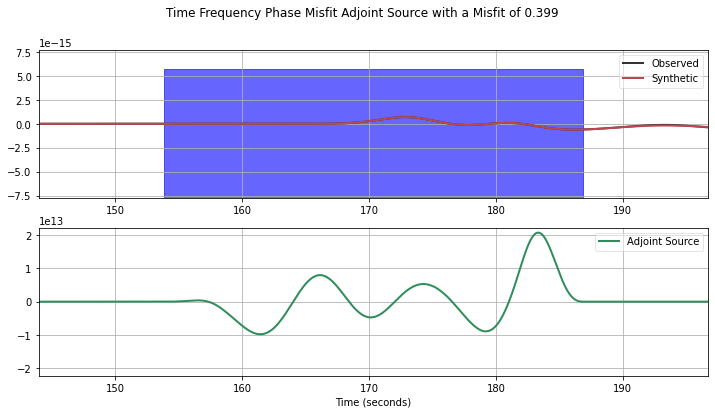

0.399134726005
[[161.65419992237798, 194.65419992237798]]
AA S0030
AA.S0030..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:02:41.654200Z 1970-01-01T00:03:14.654200Z
True
AA.S0030..BXZ | 1970-01-01T00:02:41.660000Z - 1970-01-01T00:03:14.660000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:02:41.654200Z 1970-01-01T00:03:14.654200Z
True
AA.S0030..BXZ | 1970-01-01T00:02:41.660000Z - 1970-01-01T00:03:14.660000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.414192079521 0.414192079521
{'misfit': 0.41419207952124043, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


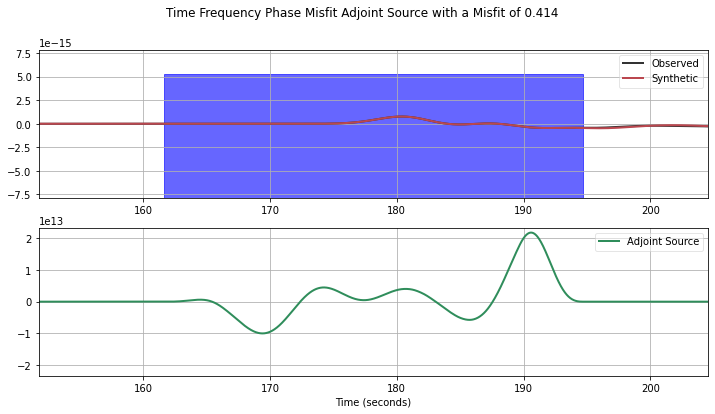

0.414192079521
[[169.42535444510764, 202.42535444510764]]
AA S0031
AA.S0031..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:02:49.425354Z 1970-01-01T00:03:22.425354Z
True
AA.S0031..BXZ | 1970-01-01T00:02:49.420000Z - 1970-01-01T00:03:22.420000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:02:49.425354Z 1970-01-01T00:03:22.425354Z
True
AA.S0031..BXZ | 1970-01-01T00:02:49.420000Z - 1970-01-01T00:03:22.420000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.293986883418 0.293986883418
{'misfit': 0.293986883417936, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


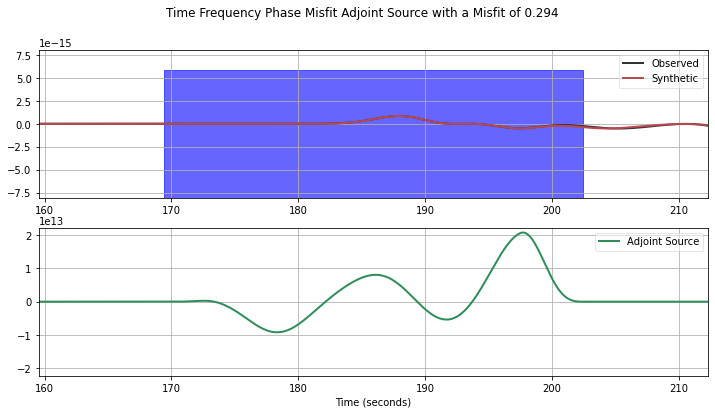

0.293986883418
[[177.153862641465, 210.153862641465]]
AA S0032
AA.S0032..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:02:57.153863Z 1970-01-01T00:03:30.153863Z
True
AA.S0032..BXZ | 1970-01-01T00:02:57.160000Z - 1970-01-01T00:03:30.160000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:02:57.153863Z 1970-01-01T00:03:30.153863Z
True
AA.S0032..BXZ | 1970-01-01T00:02:57.160000Z - 1970-01-01T00:03:30.160000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.137996415743 0.137996415743
{'misfit': 0.1379964157428259, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


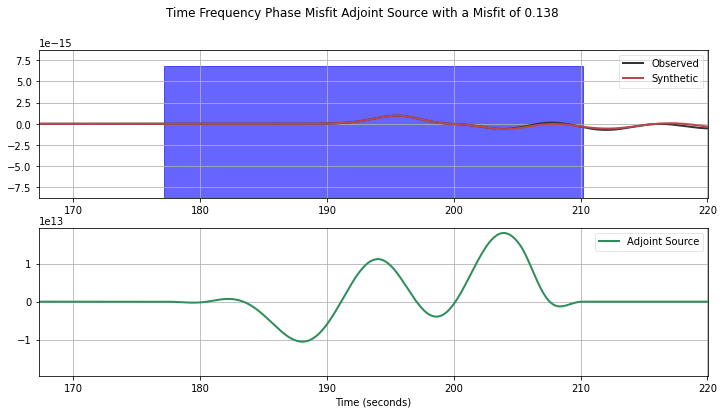

0.137996415743
[[184.78072567909774, 217.78072567909774]]
AA S0033
AA.S0033..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:03:04.780726Z 1970-01-01T00:03:37.780726Z
True
AA.S0033..BXZ | 1970-01-01T00:03:04.780000Z - 1970-01-01T00:03:37.780000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:03:04.780726Z 1970-01-01T00:03:37.780726Z
True
AA.S0033..BXZ | 1970-01-01T00:03:04.780000Z - 1970-01-01T00:03:37.780000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.0485848282345 0.0485848282345
{'misfit': 0.048584828234536602, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


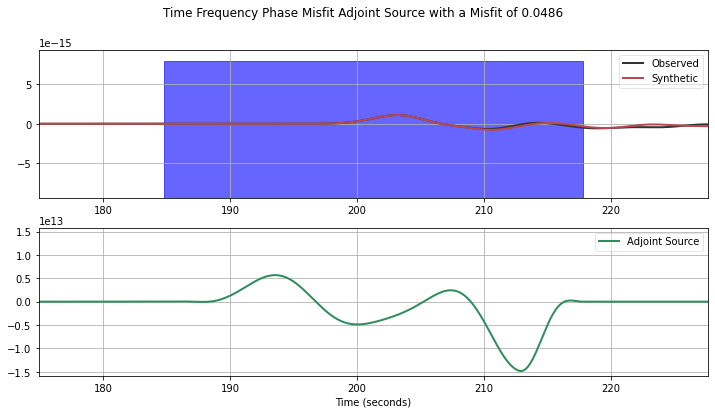

0.0485848282345
[[192.31484962983203, 225.31484962983203]]
AA S0034
AA.S0034..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:03:12.314850Z 1970-01-01T00:03:45.314850Z
True
AA.S0034..BXZ | 1970-01-01T00:03:12.320000Z - 1970-01-01T00:03:45.320000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:03:12.314850Z 1970-01-01T00:03:45.314850Z
True
AA.S0034..BXZ | 1970-01-01T00:03:12.320000Z - 1970-01-01T00:03:45.320000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.192646161694 0.192646161694
{'misfit': 0.19264616169421353, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


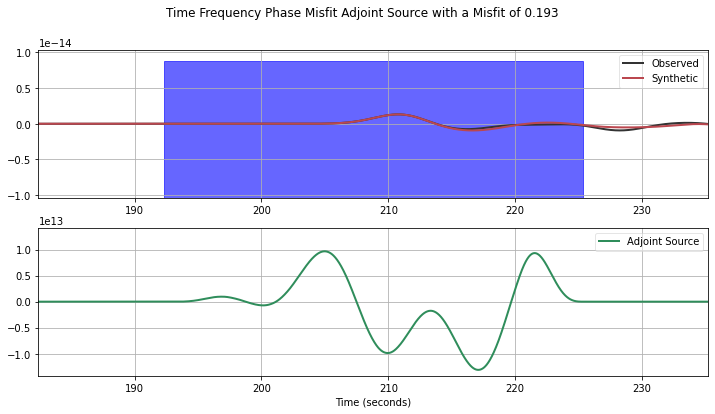

0.192646161694
[[199.7740494901571, 232.7740494901571]]
AA S0035
AA.S0035..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:03:19.774049Z 1970-01-01T00:03:52.774049Z
True
AA.S0035..BXZ | 1970-01-01T00:03:19.780000Z - 1970-01-01T00:03:52.780000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:03:19.774049Z 1970-01-01T00:03:52.774049Z
True
AA.S0035..BXZ | 1970-01-01T00:03:19.780000Z - 1970-01-01T00:03:52.780000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.312650775159 0.312650775159
{'misfit': 0.31265077515898604, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


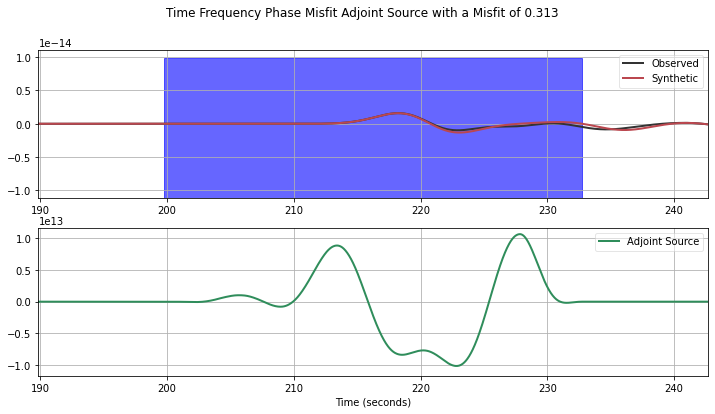

0.312650775159
[[207.16049675570545, 240.16049675570545]]
AA S0036
AA.S0036..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:03:27.160497Z 1970-01-01T00:04:00.160497Z
True
AA.S0036..BXZ | 1970-01-01T00:03:27.160000Z - 1970-01-01T00:04:00.160000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:03:27.160497Z 1970-01-01T00:04:00.160497Z
True
AA.S0036..BXZ | 1970-01-01T00:03:27.160000Z - 1970-01-01T00:04:00.160000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.403683084074 0.403683084074
{'misfit': 0.40368308407381948, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


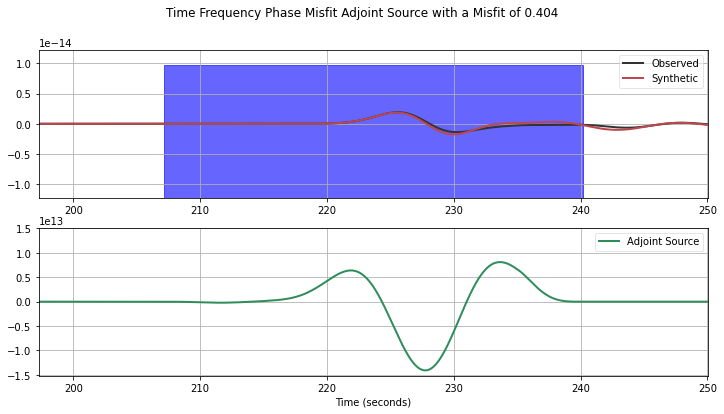

0.403683084074
[[214.47473555261701, 247.47473555261701]]
AA S0037
AA.S0037..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:03:34.474736Z 1970-01-01T00:04:07.474736Z
True
AA.S0037..BXZ | 1970-01-01T00:03:34.480000Z - 1970-01-01T00:04:07.480000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:03:34.474736Z 1970-01-01T00:04:07.474736Z
True
AA.S0037..BXZ | 1970-01-01T00:03:34.480000Z - 1970-01-01T00:04:07.480000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.488370460652 0.488370460652
{'misfit': 0.48837046065173451, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


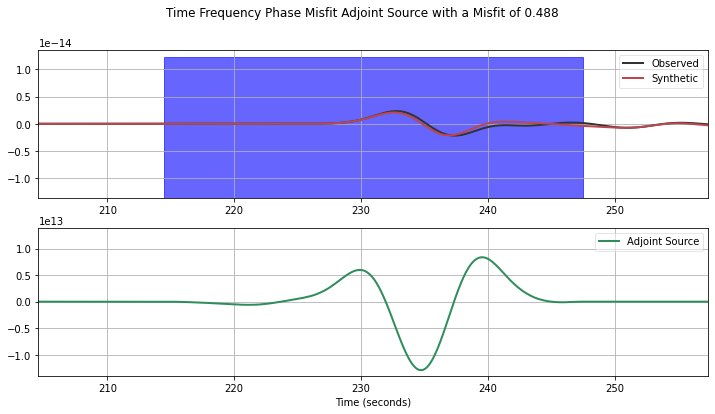

0.488370460652
[[221.68205659134151, 254.68205659134151]]
AA S0038
AA.S0038..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:03:41.682057Z 1970-01-01T00:04:14.682057Z
True
AA.S0038..BXZ | 1970-01-01T00:03:41.680000Z - 1970-01-01T00:04:14.680000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:03:41.682057Z 1970-01-01T00:04:14.682057Z
True
AA.S0038..BXZ | 1970-01-01T00:03:41.680000Z - 1970-01-01T00:04:14.680000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.447240918917 0.447240918917
{'misfit': 0.44724091891716844, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


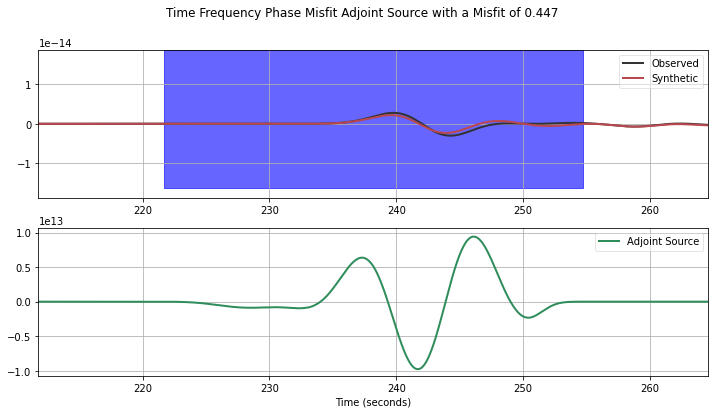

0.447240918917
[[228.20902223285583, 261.20902223285583]]
AA S0039
AA.S0039..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:03:48.209022Z 1970-01-01T00:04:21.209022Z
True
AA.S0039..BXZ | 1970-01-01T00:03:48.200000Z - 1970-01-01T00:04:21.200000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:03:48.209022Z 1970-01-01T00:04:21.209022Z
True
AA.S0039..BXZ | 1970-01-01T00:03:48.200000Z - 1970-01-01T00:04:21.200000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.351338604309 0.351338604309
{'misfit': 0.35133860430890185, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


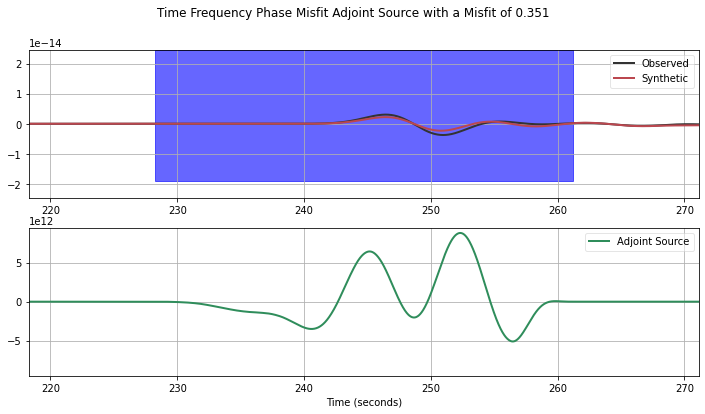

0.351338604309
[[234.71415717353179, 267.71415717353182]]
AA S0040
AA.S0040..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:03:54.714157Z 1970-01-01T00:04:27.714157Z
True
AA.S0040..BXZ | 1970-01-01T00:03:54.720000Z - 1970-01-01T00:04:27.720000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:03:54.714157Z 1970-01-01T00:04:27.714157Z
True
AA.S0040..BXZ | 1970-01-01T00:03:54.720000Z - 1970-01-01T00:04:27.720000Z | 50.0 Hz, 1651 samples
0.3 cosine
0.58310961321 0.58310961321
{'misfit': 0.58310961320992072, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


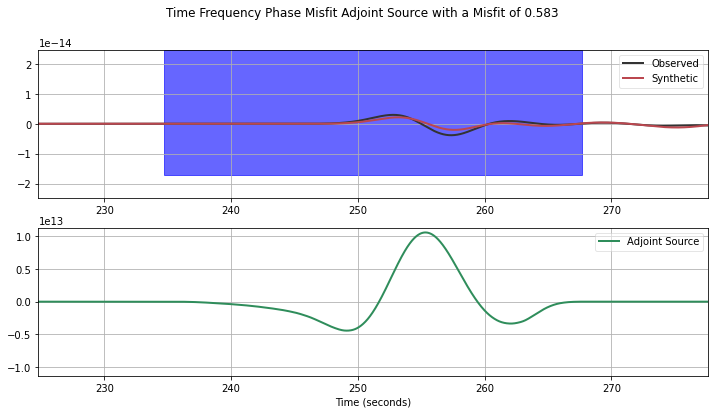

0.58310961321
[[241.19399721985735, 274.19399721985735]]
AA S0041
AA.S0041..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:04:01.193997Z 1970-01-01T00:04:34.193997Z
True
AA.S0041..BXZ | 1970-01-01T00:04:01.200000Z - 1970-01-01T00:04:34.200000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:04:01.193997Z 1970-01-01T00:04:34.193997Z
True
AA.S0041..BXZ | 1970-01-01T00:04:01.200000Z - 1970-01-01T00:04:34.200000Z | 50.0 Hz, 1651 samples
0.3 cosine
1.17687016412 1.17687016412
{'misfit': 1.1768701641249597, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


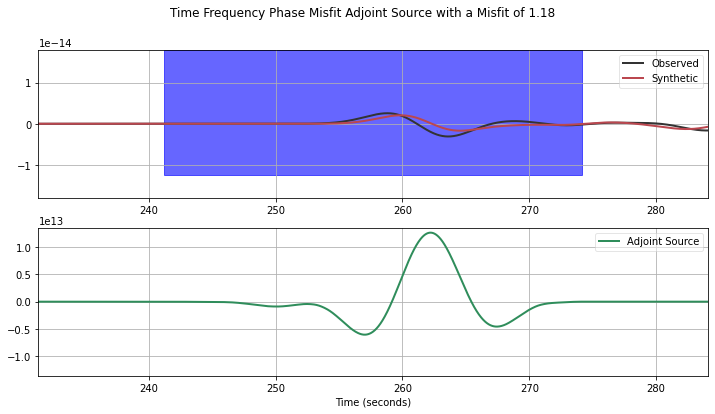

1.17687016412
[[247.64485079034847, 280.64485079034847]]
AA S0042
AA.S0042..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:04:07.644851Z 1970-01-01T00:04:40.644851Z
True
AA.S0042..BXZ | 1970-01-01T00:04:07.640000Z - 1970-01-01T00:04:40.640000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:04:07.644851Z 1970-01-01T00:04:40.644851Z
True
AA.S0042..BXZ | 1970-01-01T00:04:07.640000Z - 1970-01-01T00:04:40.640000Z | 50.0 Hz, 1651 samples
0.3 cosine
1.69964823316 1.69964823316
{'misfit': 1.6996482331587288, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


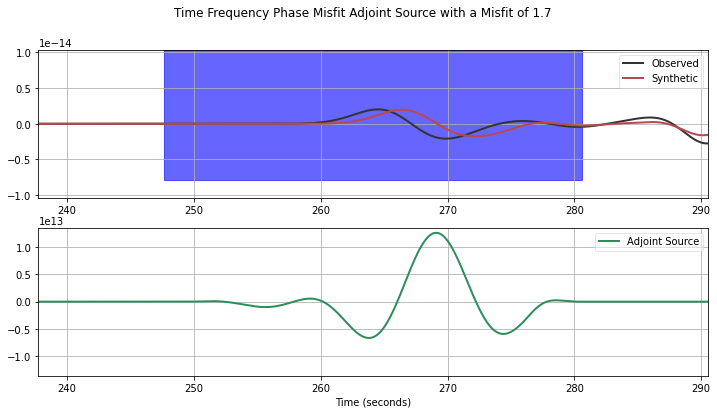

1.69964823316
[[254.06331299811671, 287.06331299811671]]
AA S0043
AA.S0043..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:04:14.063313Z 1970-01-01T00:04:47.063313Z
True
AA.S0043..BXZ | 1970-01-01T00:04:14.060000Z - 1970-01-01T00:04:47.060000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:04:14.063313Z 1970-01-01T00:04:47.063313Z
True
AA.S0043..BXZ | 1970-01-01T00:04:14.060000Z - 1970-01-01T00:04:47.060000Z | 50.0 Hz, 1651 samples
0.3 cosine
2.00957925379 2.00957925379
{'misfit': 2.0095792537935484, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


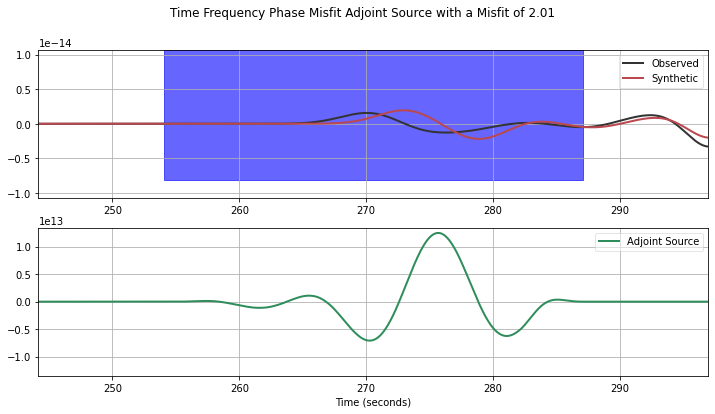

2.00957925379
[[260.44585462195107, 293.44585462195107]]
AA S0044
AA.S0044..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:04:20.445855Z 1970-01-01T00:04:53.445855Z
True
AA.S0044..BXZ | 1970-01-01T00:04:20.440000Z - 1970-01-01T00:04:53.440000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:04:20.445855Z 1970-01-01T00:04:53.445855Z
True
AA.S0044..BXZ | 1970-01-01T00:04:20.440000Z - 1970-01-01T00:04:53.440000Z | 50.0 Hz, 1651 samples
0.3 cosine
2.3263589085 2.3263589085
{'misfit': 2.3263589085041172, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


/data2/yjgao/data/DATASET/package_forthesis/pyadjoint/src/pyadjoint/adjoint_source_types/tf_phase_misfit.py:272: UserWarning: Possible phase jump detected. Misfit included. No adjoint source computed. Criterion: 16.0 - Max allowed criterion: 7.0
  warnings.warn(warning)


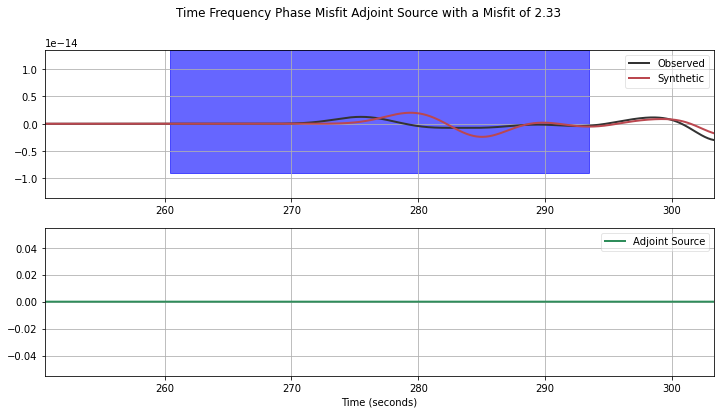

2.3263589085
[[266.78944300296473, 299.78944300296473]]
AA S0045
AA.S0045..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:04:26.789443Z 1970-01-01T00:04:59.789443Z
True
AA.S0045..BXZ | 1970-01-01T00:04:26.780000Z - 1970-01-01T00:04:59.780000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:04:26.789443Z 1970-01-01T00:04:59.789443Z
True
AA.S0045..BXZ | 1970-01-01T00:04:26.780000Z - 1970-01-01T00:04:59.780000Z | 50.0 Hz, 1651 samples
0.3 cosine
2.84427588265 2.84427588265
{'misfit': 2.8442758826477794, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


/data2/yjgao/data/DATASET/package_forthesis/pyadjoint/src/pyadjoint/adjoint_source_types/tf_phase_misfit.py:272: UserWarning: Possible phase jump detected. Misfit included. No adjoint source computed. Criterion: 48.0 - Max allowed criterion: 7.0
  warnings.warn(warning)


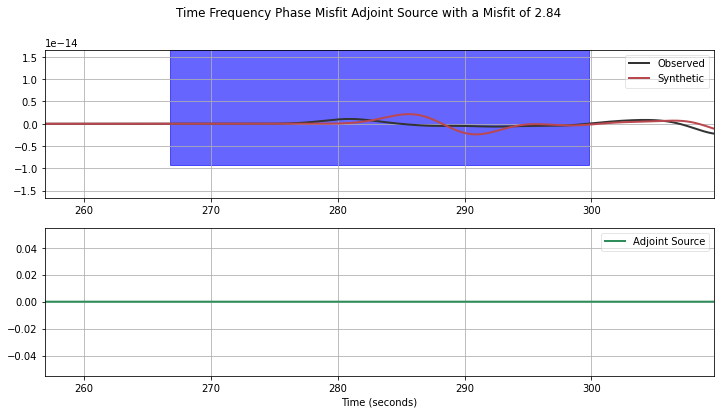

2.84427588265
[[273.09100161480694, 306.09100161480694]]
AA S0046
AA.S0046..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:04:33.091002Z 1970-01-01T00:05:06.091002Z
True
AA.S0046..BXZ | 1970-01-01T00:04:33.100000Z - 1970-01-01T00:05:06.100000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:04:33.091002Z 1970-01-01T00:05:06.091002Z
True
AA.S0046..BXZ | 1970-01-01T00:04:33.100000Z - 1970-01-01T00:05:06.100000Z | 50.0 Hz, 1651 samples
0.3 cosine
3.23900452832 3.23900452832
{'misfit': 3.2390045283159834, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


/data2/yjgao/data/DATASET/package_forthesis/pyadjoint/src/pyadjoint/adjoint_source_types/tf_phase_misfit.py:272: UserWarning: Possible phase jump detected. Misfit included. No adjoint source computed. Criterion: 66.0 - Max allowed criterion: 7.0
  warnings.warn(warning)


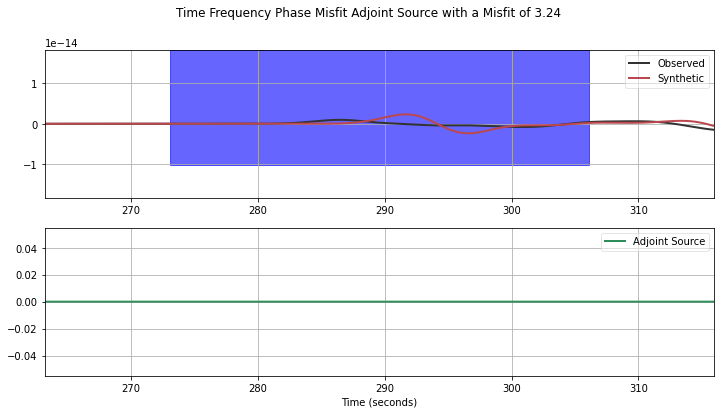

3.23900452832
[[279.34759765895694, 312.34759765895694]]
AA S0047
AA.S0047..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:04:39.347598Z 1970-01-01T00:05:12.347598Z
True
AA.S0047..BXZ | 1970-01-01T00:04:39.340000Z - 1970-01-01T00:05:12.340000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:04:39.347598Z 1970-01-01T00:05:12.347598Z
True
AA.S0047..BXZ | 1970-01-01T00:04:39.340000Z - 1970-01-01T00:05:12.340000Z | 50.0 Hz, 1651 samples
0.3 cosine
3.25320872384 3.25320872384
{'misfit': 3.2532087238407903, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


/data2/yjgao/data/DATASET/package_forthesis/pyadjoint/src/pyadjoint/adjoint_source_types/tf_phase_misfit.py:272: UserWarning: Possible phase jump detected. Misfit included. No adjoint source computed. Criterion: 60.0 - Max allowed criterion: 7.0
  warnings.warn(warning)


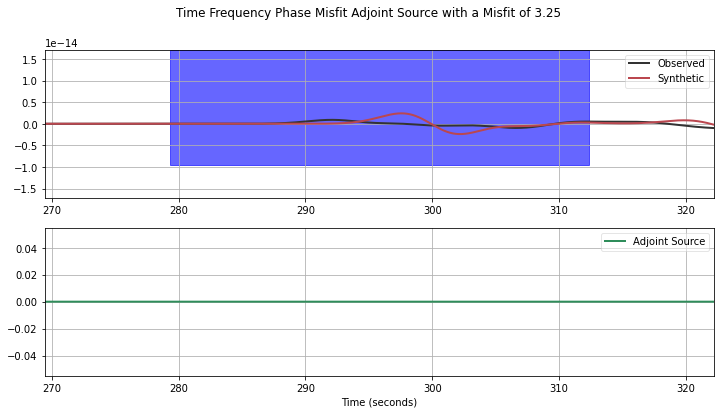

3.25320872384
[[285.15836469267606, 318.15836469267606]]
AA S0048
AA.S0048..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:04:45.158365Z 1970-01-01T00:05:18.158365Z
True
AA.S0048..BXZ | 1970-01-01T00:04:45.160000Z - 1970-01-01T00:05:18.160000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:04:45.158365Z 1970-01-01T00:05:18.158365Z
True
AA.S0048..BXZ | 1970-01-01T00:04:45.160000Z - 1970-01-01T00:05:18.160000Z | 50.0 Hz, 1651 samples
0.3 cosine
2.89183389072 2.89183389072
{'misfit': 2.8918338907156551, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


/data2/yjgao/data/DATASET/package_forthesis/pyadjoint/src/pyadjoint/adjoint_source_types/tf_phase_misfit.py:272: UserWarning: Possible phase jump detected. Misfit included. No adjoint source computed. Criterion: 45.0 - Max allowed criterion: 7.0
  warnings.warn(warning)


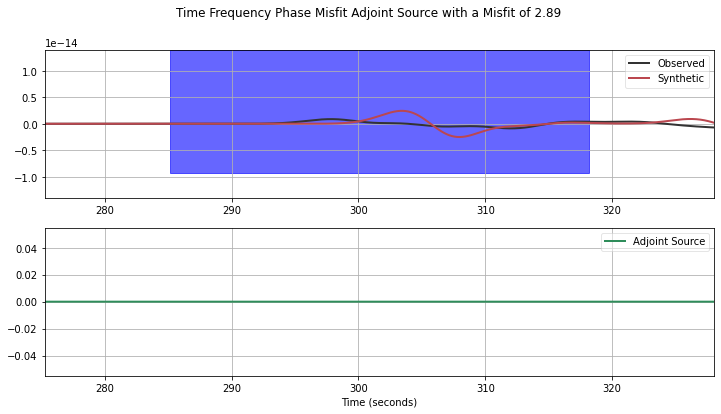

2.89183389072
[[290.57770898380215, 323.57770898380215]]
AA S0049
AA.S0049..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:04:50.577709Z 1970-01-01T00:05:23.577709Z
True
AA.S0049..BXZ | 1970-01-01T00:04:50.580000Z - 1970-01-01T00:05:23.580000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:04:50.577709Z 1970-01-01T00:05:23.577709Z
True
AA.S0049..BXZ | 1970-01-01T00:04:50.580000Z - 1970-01-01T00:05:23.580000Z | 50.0 Hz, 1651 samples
0.3 cosine
2.14541811646 2.14541811646
{'misfit': 2.1454181164579995, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


/data2/yjgao/data/DATASET/package_forthesis/pyadjoint/src/pyadjoint/adjoint_source_types/tf_phase_misfit.py:272: UserWarning: Possible phase jump detected. Misfit included. No adjoint source computed. Criterion: 15.0 - Max allowed criterion: 7.0
  warnings.warn(warning)


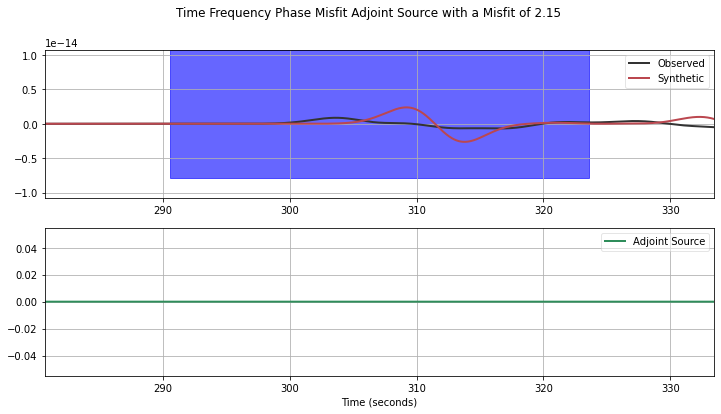

2.14541811646
[[295.98400646310421, 328.98400646310421]]
AA S0050
AA.S0050..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:04:55.984006Z 1970-01-01T00:05:28.984006Z
True
AA.S0050..BXZ | 1970-01-01T00:04:55.980000Z - 1970-01-01T00:05:28.980000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:04:55.984006Z 1970-01-01T00:05:28.984006Z
True
AA.S0050..BXZ | 1970-01-01T00:04:55.980000Z - 1970-01-01T00:05:28.980000Z | 50.0 Hz, 1651 samples
0.3 cosine
1.79763976008 1.79763976008
{'misfit': 1.797639760083573, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


/data2/yjgao/data/DATASET/package_forthesis/pyadjoint/src/pyadjoint/adjoint_source_types/tf_phase_misfit.py:272: UserWarning: Possible phase jump detected. Misfit included. No adjoint source computed. Criterion: 12.0 - Max allowed criterion: 7.0
  warnings.warn(warning)


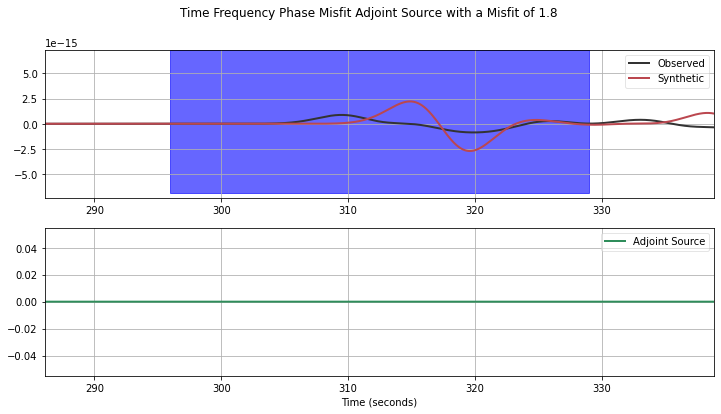

1.79763976008
[[301.37584373228822, 334.37584373228822]]
AA S0051
AA.S0051..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:05:01.375844Z 1970-01-01T00:05:34.375844Z
True
AA.S0051..BXZ | 1970-01-01T00:05:01.380000Z - 1970-01-01T00:05:34.380000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:05:01.375844Z 1970-01-01T00:05:34.375844Z
True
AA.S0051..BXZ | 1970-01-01T00:05:01.380000Z - 1970-01-01T00:05:34.380000Z | 50.0 Hz, 1651 samples
0.3 cosine
1.72901710958 1.72901710958
{'misfit': 1.7290171095757894, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


/data2/yjgao/data/DATASET/package_forthesis/pyadjoint/src/pyadjoint/adjoint_source_types/tf_phase_misfit.py:272: UserWarning: Possible phase jump detected. Misfit included. No adjoint source computed. Criterion: 8.0 - Max allowed criterion: 7.0
  warnings.warn(warning)


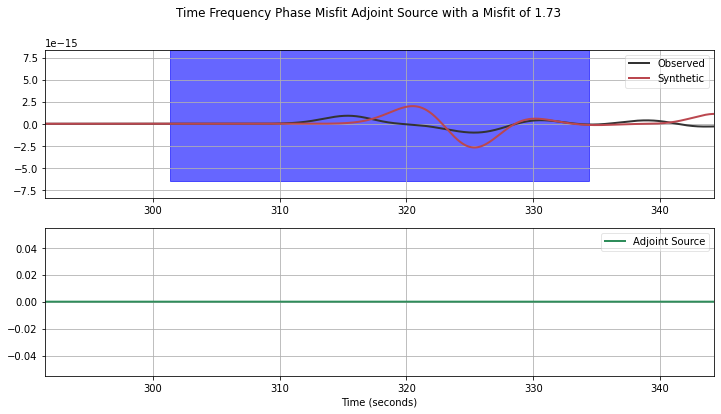

1.72901710958
[[306.75159987378356, 339.75159987378356]]
AA S0052
AA.S0052..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:05:06.751600Z 1970-01-01T00:05:39.751600Z
True
AA.S0052..BXZ | 1970-01-01T00:05:06.760000Z - 1970-01-01T00:05:39.760000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:05:06.751600Z 1970-01-01T00:05:39.751600Z
True
AA.S0052..BXZ | 1970-01-01T00:05:06.760000Z - 1970-01-01T00:05:39.760000Z | 50.0 Hz, 1651 samples
0.3 cosine
1.78245151642 1.78245151642
{'misfit': 1.7824515164171615, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


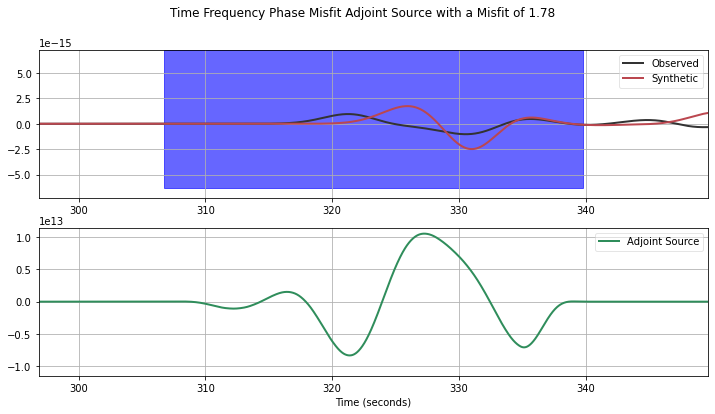

1.78245151642
[[312.11015066535856, 345.11015066535856]]
AA S0053
AA.S0053..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:05:12.110151Z 1970-01-01T00:05:45.110151Z
True
AA.S0053..BXZ | 1970-01-01T00:05:12.120000Z - 1970-01-01T00:05:45.120000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:05:12.110151Z 1970-01-01T00:05:45.110151Z
True
AA.S0053..BXZ | 1970-01-01T00:05:12.120000Z - 1970-01-01T00:05:45.120000Z | 50.0 Hz, 1651 samples
0.3 cosine
1.9433039456 1.9433039456
{'misfit': 1.9433039455997201, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


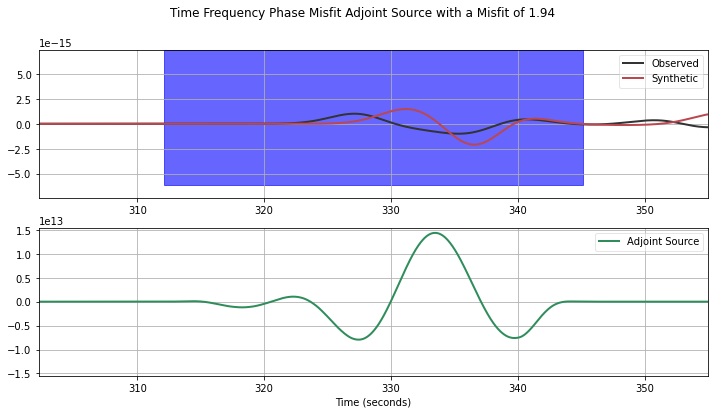

1.9433039456
[[317.44975731658263, 350.44975731658263]]
AA S0054
AA.S0054..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:05:17.449757Z 1970-01-01T00:05:50.449757Z
True
AA.S0054..BXZ | 1970-01-01T00:05:17.440000Z - 1970-01-01T00:05:50.440000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:05:17.449757Z 1970-01-01T00:05:50.449757Z
True
AA.S0054..BXZ | 1970-01-01T00:05:17.440000Z - 1970-01-01T00:05:50.440000Z | 50.0 Hz, 1651 samples
0.3 cosine
2.16995749098 2.16995749098
{'misfit': 2.1699574909753068, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


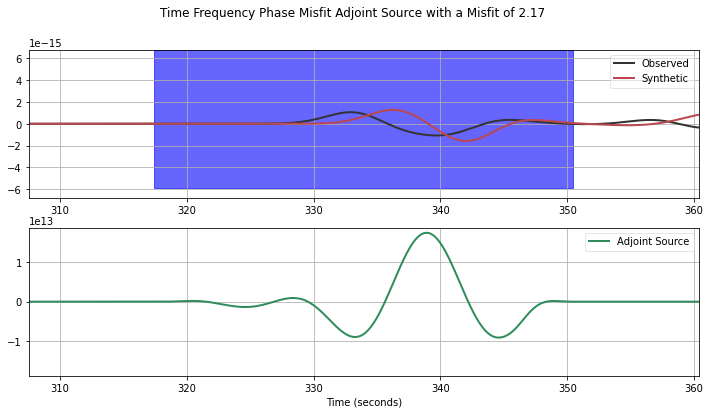

2.16995749098
[[322.76884768385122, 355.76884768385122]]
AA S0055
AA.S0055..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:05:22.768848Z 1970-01-01T00:05:55.768848Z
True
AA.S0055..BXZ | 1970-01-01T00:05:22.760000Z - 1970-01-01T00:05:55.760000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:05:22.768848Z 1970-01-01T00:05:55.768848Z
True
AA.S0055..BXZ | 1970-01-01T00:05:22.760000Z - 1970-01-01T00:05:55.760000Z | 50.0 Hz, 1651 samples
0.3 cosine
2.24318091824 2.24318091824
{'misfit': 2.2431809182449483, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


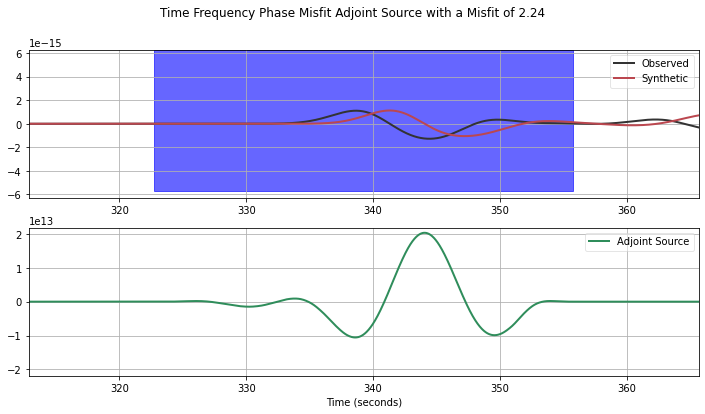

2.24318091824
[[328.06621508836622, 361.06621508836622]]
AA S0056
AA.S0056..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:05:28.066215Z 1970-01-01T00:06:01.066215Z
True
AA.S0056..BXZ | 1970-01-01T00:05:28.060000Z - 1970-01-01T00:06:01.060000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:05:28.066215Z 1970-01-01T00:06:01.066215Z
True
AA.S0056..BXZ | 1970-01-01T00:05:28.060000Z - 1970-01-01T00:06:01.060000Z | 50.0 Hz, 1651 samples
0.3 cosine
2.08621018513 2.08621018513
{'misfit': 2.0862101851254637, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


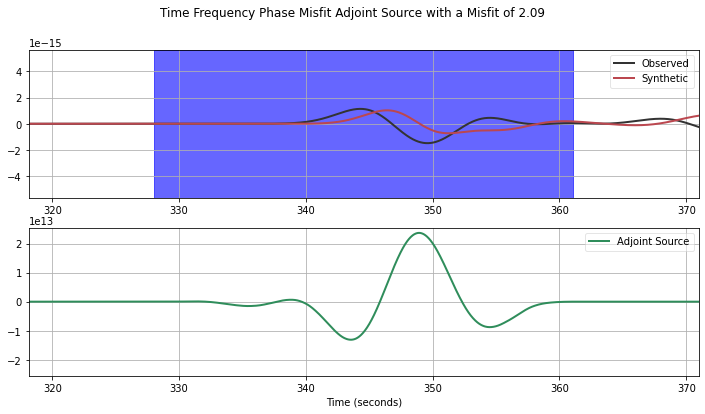

2.08621018513
[[333.34018092144828, 366.34018092144828]]
AA S0057
AA.S0057..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:05:33.340181Z 1970-01-01T00:06:06.340181Z
True
AA.S0057..BXZ | 1970-01-01T00:05:33.340000Z - 1970-01-01T00:06:06.340000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:05:33.340181Z 1970-01-01T00:06:06.340181Z
True
AA.S0057..BXZ | 1970-01-01T00:05:33.340000Z - 1970-01-01T00:06:06.340000Z | 50.0 Hz, 1651 samples
0.3 cosine
1.80905377984 1.80905377984
{'misfit': 1.8090537798404369, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


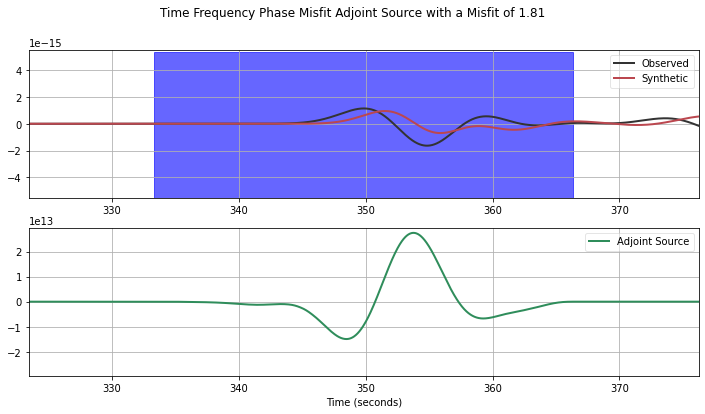

1.80905377984
[[338.59518015658455, 371.59518015658455]]
AA S0058
AA.S0058..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:05:38.595180Z 1970-01-01T00:06:11.595180Z
True
AA.S0058..BXZ | 1970-01-01T00:05:38.600000Z - 1970-01-01T00:06:11.600000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:05:38.595180Z 1970-01-01T00:06:11.595180Z
True
AA.S0058..BXZ | 1970-01-01T00:05:38.600000Z - 1970-01-01T00:06:11.600000Z | 50.0 Hz, 1651 samples
0.3 cosine
1.52274533235 1.52274533235
{'misfit': 1.5227453323501534, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


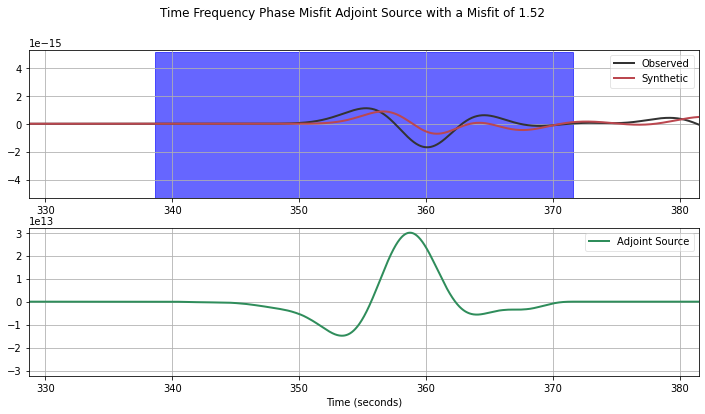

1.52274533235
[[343.84319620132919, 376.84319620132919]]
AA S0059
AA.S0059..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:05:43.843196Z 1970-01-01T00:06:16.843196Z
True
AA.S0059..BXZ | 1970-01-01T00:05:43.840000Z - 1970-01-01T00:06:16.840000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:05:43.843196Z 1970-01-01T00:06:16.843196Z
True
AA.S0059..BXZ | 1970-01-01T00:05:43.840000Z - 1970-01-01T00:06:16.840000Z | 50.0 Hz, 1651 samples
0.3 cosine
1.26462442041 1.26462442041
{'misfit': 1.2646244204082093, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


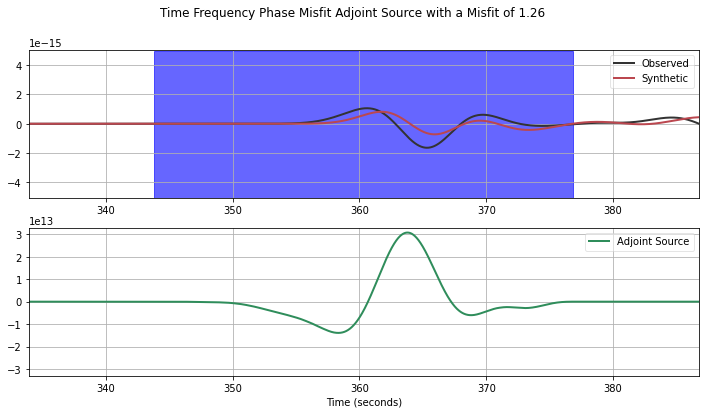

1.26462442041
[[349.08083668973751, 382.08083668973751]]
AA S0060
AA.S0060..BXZ | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:13:19.980000Z | 50.0 Hz, 40000 samples
True 0.3 cosine
1970-01-01T00:05:49.080837Z 1970-01-01T00:06:22.080837Z
True
AA.S0060..BXZ | 1970-01-01T00:05:49.080000Z - 1970-01-01T00:06:22.080000Z | 50.0 Hz, 1651 samples
0.1 cosine
1970-01-01T00:05:49.080837Z 1970-01-01T00:06:22.080837Z
True
AA.S0060..BXZ | 1970-01-01T00:05:49.080000Z - 1970-01-01T00:06:22.080000Z | 50.0 Hz, 1651 samples
0.3 cosine
1.07422510509 1.07422510509
{'misfit': 1.074225105085564, 'adjoint_source': array([-0., -0., -0., ..., -0., -0., -0.])}


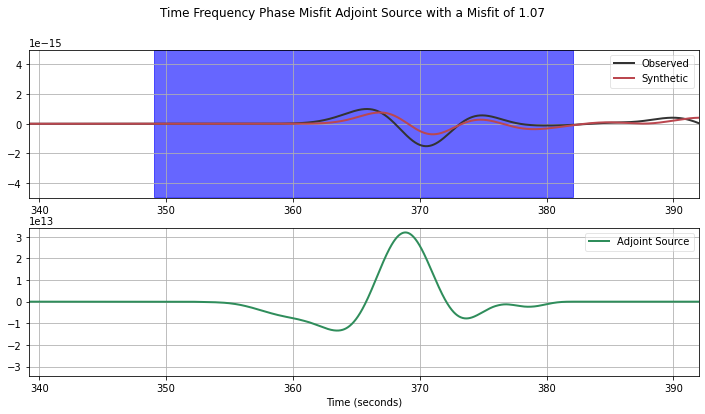

1.07422510509


In [3]:
PROJECT='/data2/yjgao/data/DATASET/package_forthesis/'
import numpy as np
import matplotlib.pyplot as plt
import os
list_events=['EVENT1']
for _i, event in enumerate(list_events):
    adj_calculate(PROJECT,event,'REF_SEM/','REF_SEM_SYN/','tf_phase_misfit')

[[64.931682194878661, 97.931682194878661]]
AA S0001


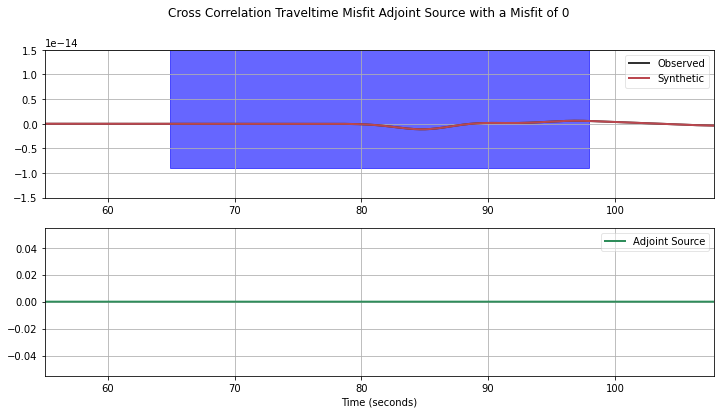

0.0
[[56.968614525035761, 89.968614525035761]]
AA S0002


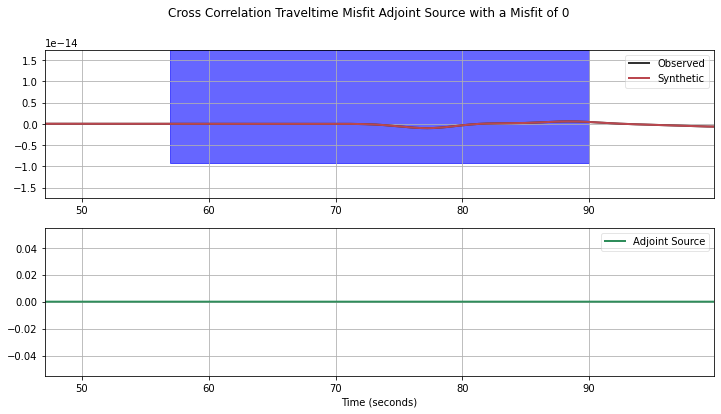

0.0
[[49.045958950547487, 82.045958950547487]]
AA S0003


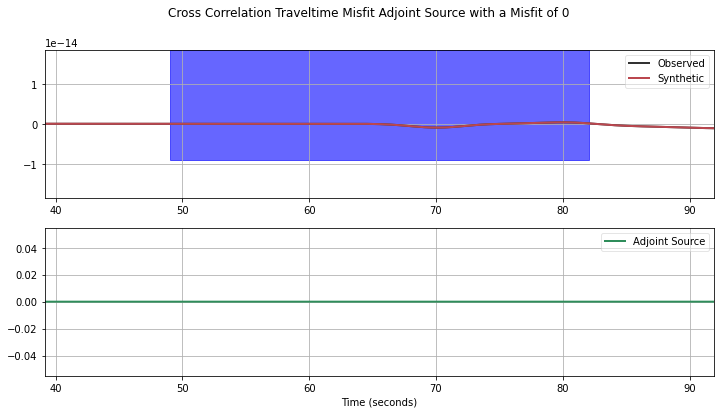

0.0
[[41.188207002335105, 74.188207002335105]]
AA S0004


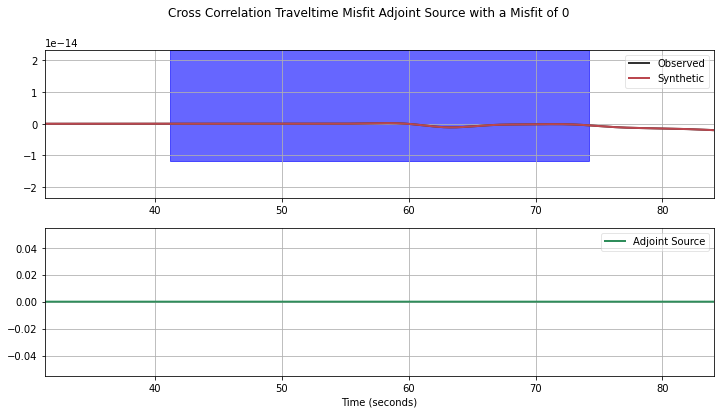

0.0
[[33.441285028256871, 66.441285028256871]]
AA S0005


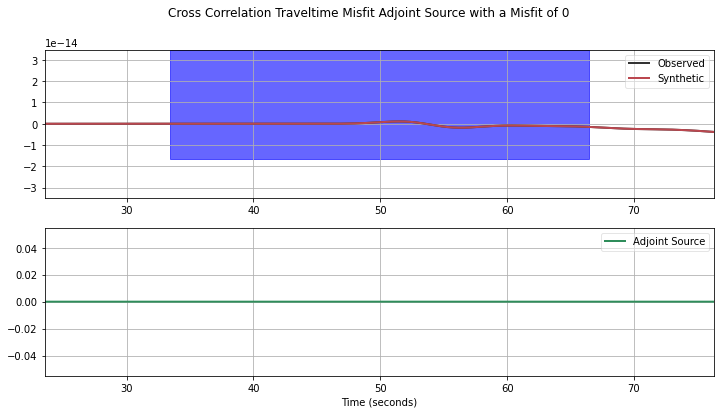

0.0
[[25.901001596526484, 58.901001596526484]]
AA S0006


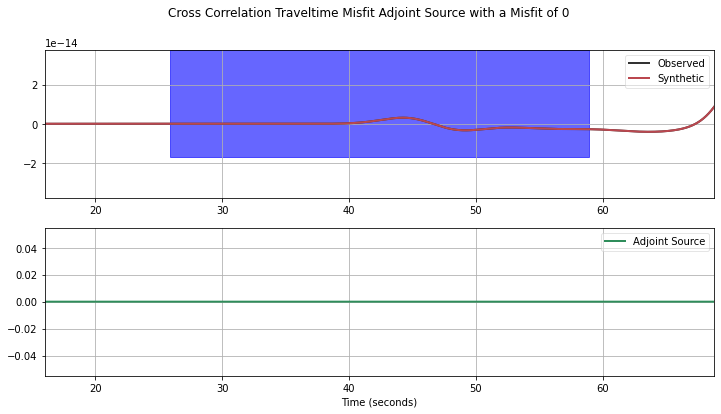

0.0
[[18.789396418444827, 51.789396418444824]]
AA S0007


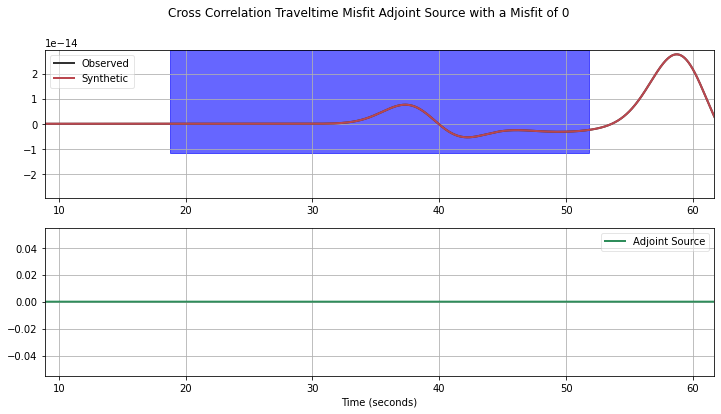

0.0
[[12.668750701702812, 45.668750701702812]]
AA S0008


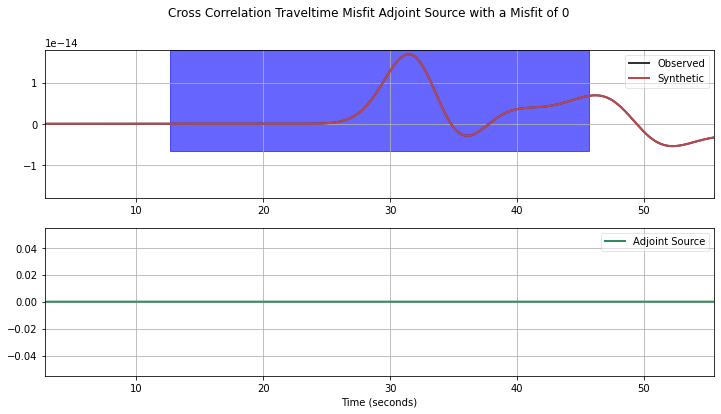

0.0
[[8.872367957285924, 41.872367957285924]]
AA S0009


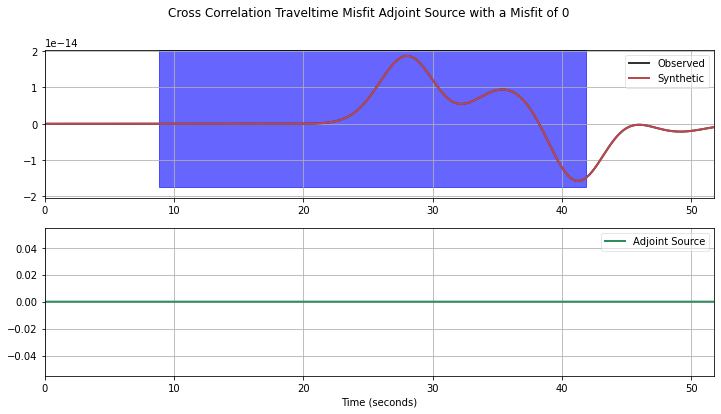

0.0
[[9.1964102017034008, 42.196410201703401]]
AA S0010


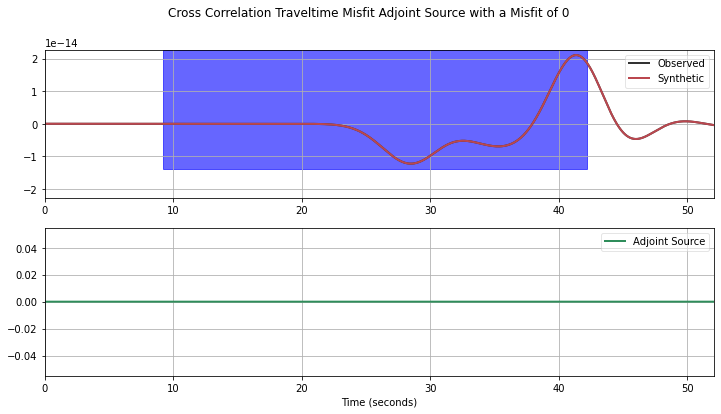

0.0
[[13.44310352760726, 46.443103527607263]]
AA S0011


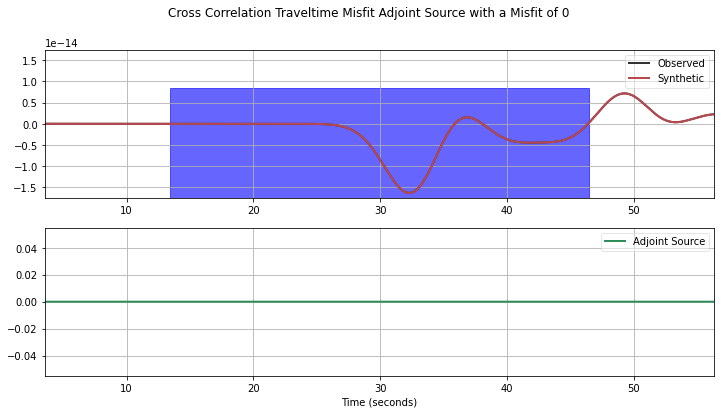

0.0
[[19.763749351428846, 52.763749351428842]]
AA S0012


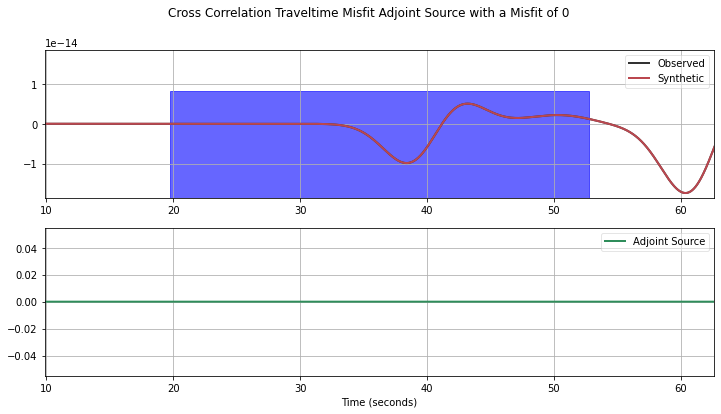

0.0
[[26.9593382632249, 59.9593382632249]]
AA S0013


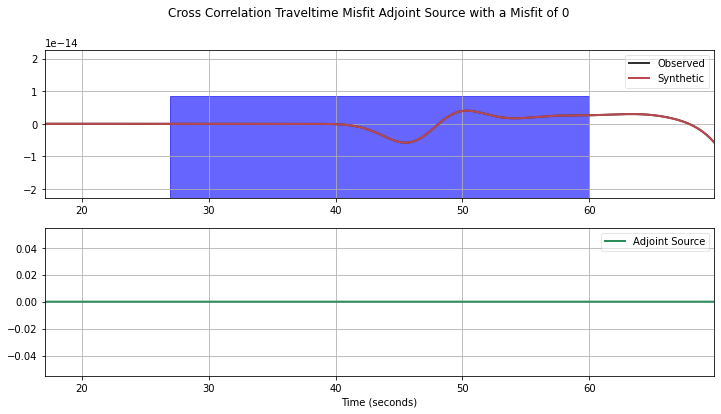

0.0
[[34.538578336728634, 67.538578336728634]]
AA S0014


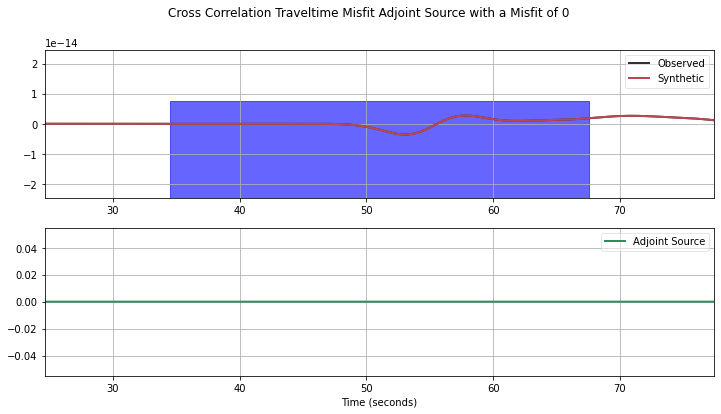

0.0
[[42.305314003568114, 75.305314003568114]]
AA S0015


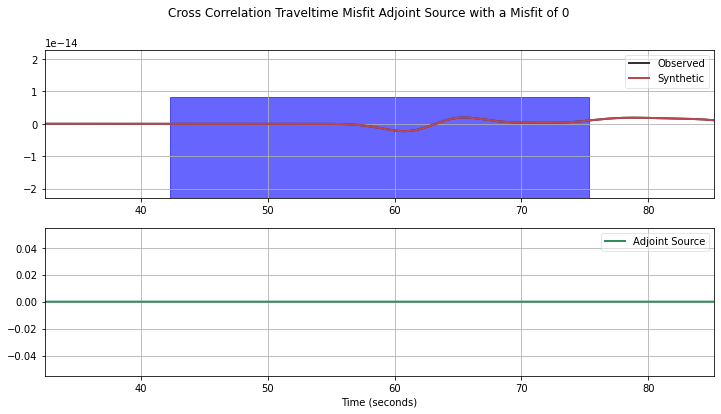

0.0
[[50.17448281616079, 83.17448281616079]]
AA S0016


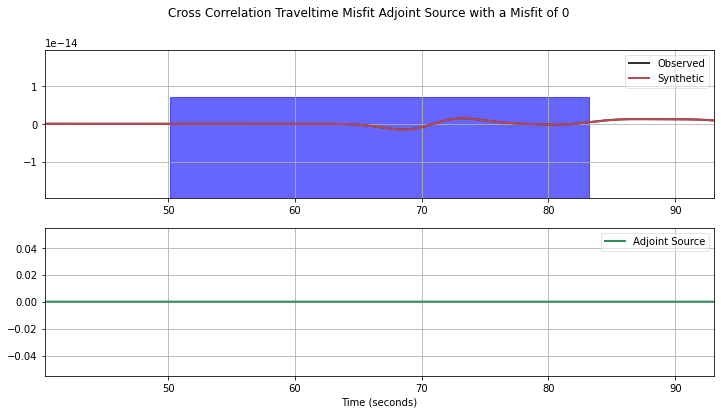

0.0
[[58.104118295881179, 91.104118295881179]]
AA S0017


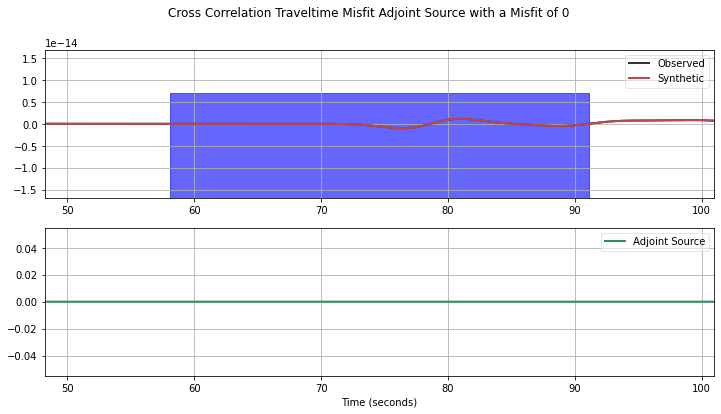

0.0
[[66.071757784638635, 99.071757784638635]]
AA S0018


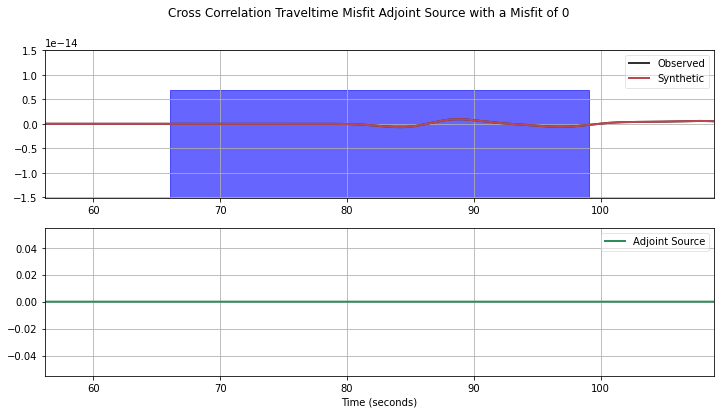

0.0
[[74.064207786582159, 107.06420778658216]]
AA S0019


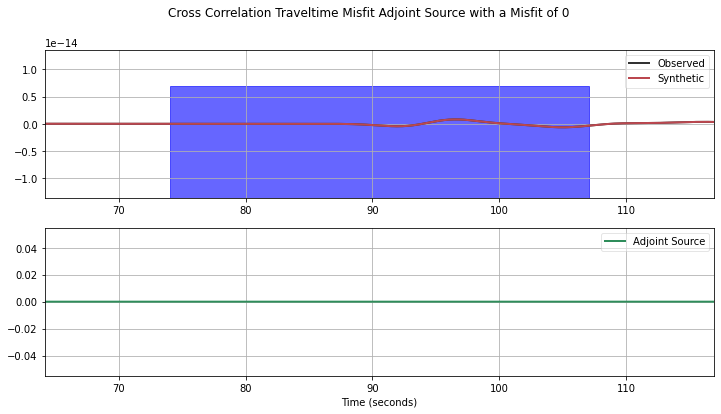

0.0
[[82.073488500080359, 115.07348850008036]]
AA S0020


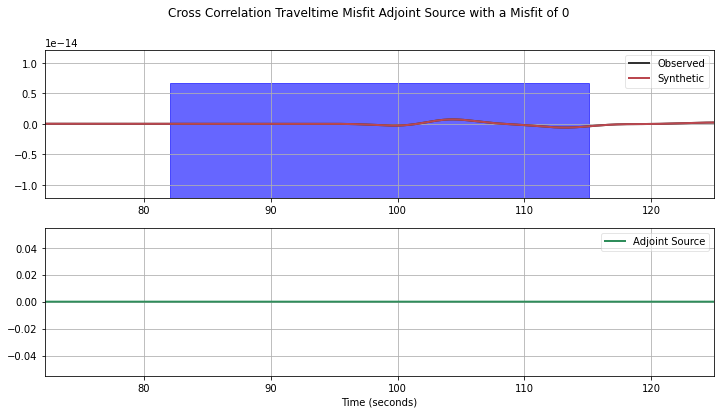

0.0
[[90.094122383223336, 123.09412238322334]]
AA S0021


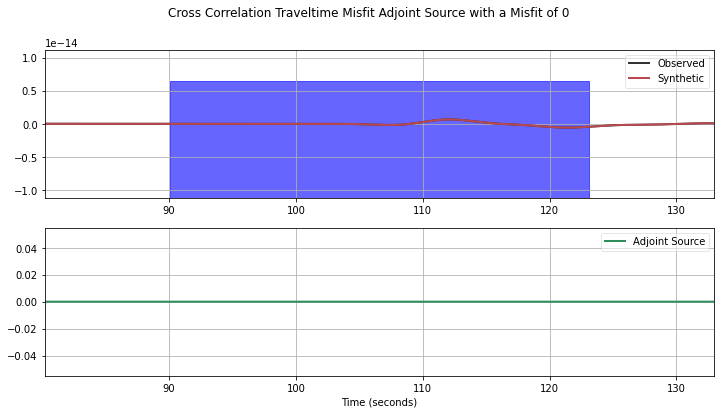

0.0
[[98.122416813493572, 131.12241681349357]]
AA S0022


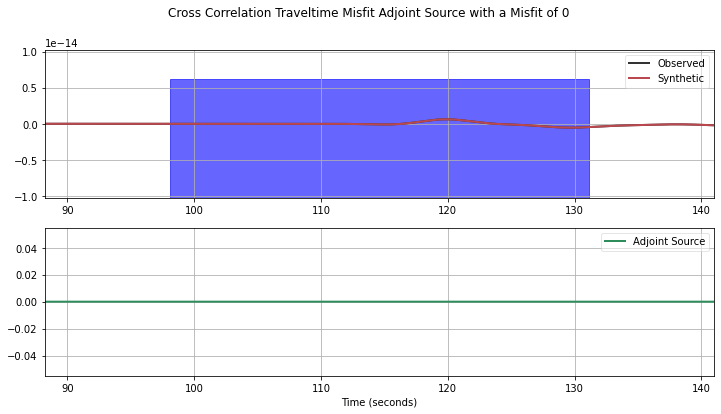

0.0
[[106.15560248039969, 139.15560248039969]]
AA S0023


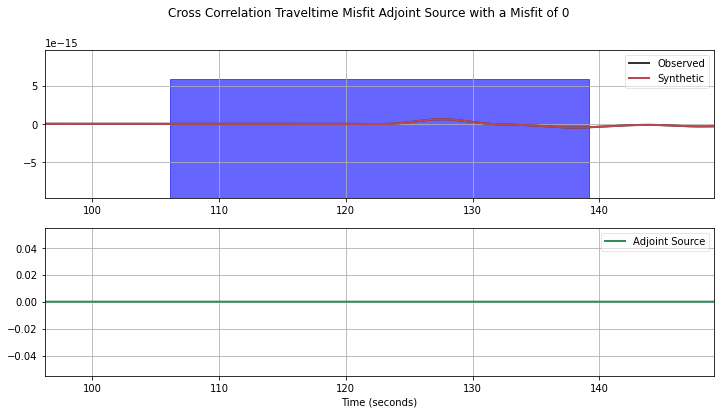

0.0
[[114.19096912726654, 147.19096912726656]]
AA S0024


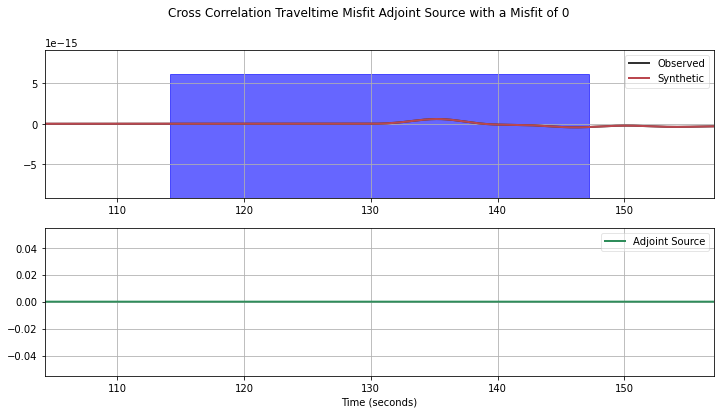

0.0
[[122.1998217811215, 155.1998217811215]]
AA S0025


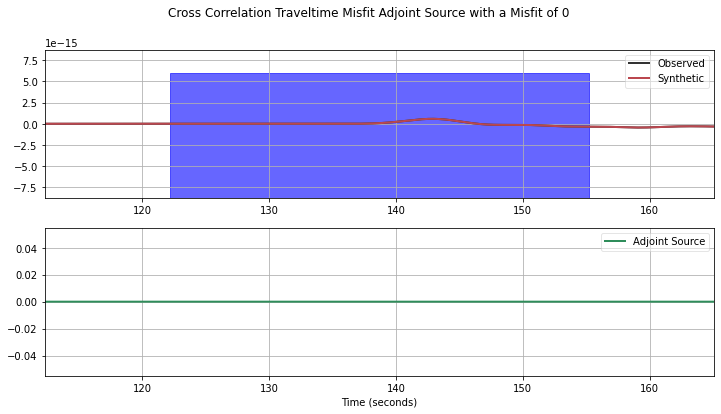

0.0
[[130.16728303744952, 163.16728303744952]]
AA S0026


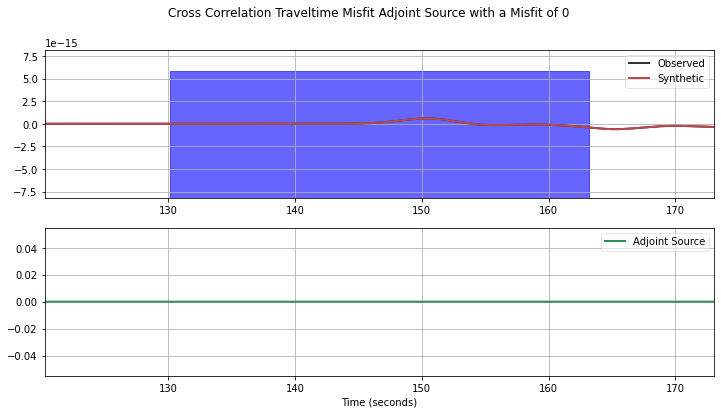

0.0
[[138.09698880499246, 171.09698880499246]]
AA S0027


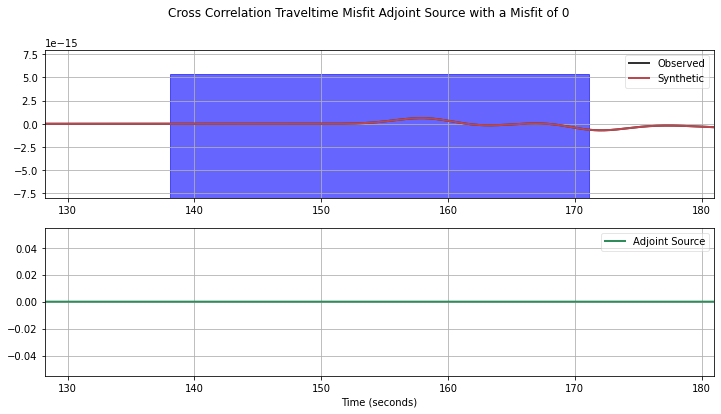

0.0
[[145.98868709829628, 178.98868709829628]]
AA S0028


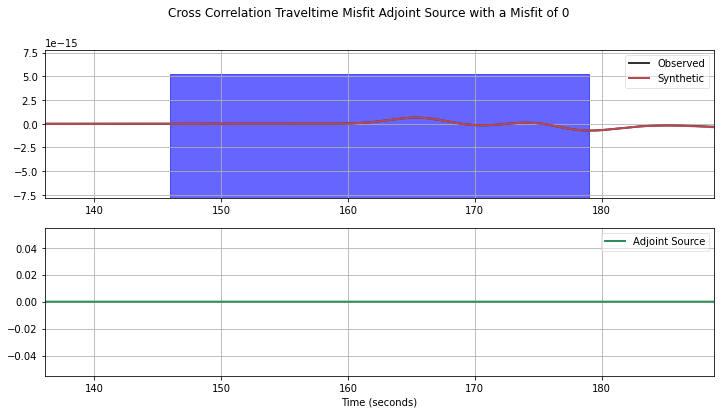

0.0
[[153.84156624047031, 186.84156624047031]]
AA S0029


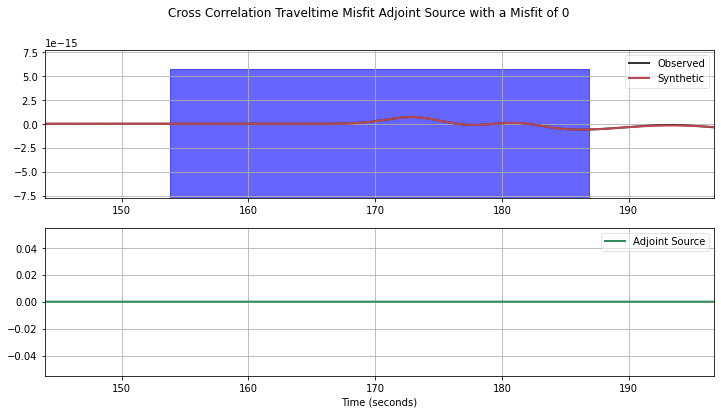

0.0
[[161.65419992237798, 194.65419992237798]]
AA S0030


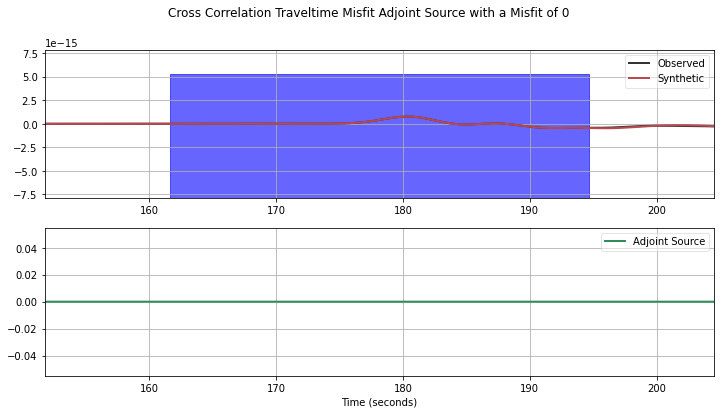

0.0
[[169.42535444510764, 202.42535444510764]]
AA S0031


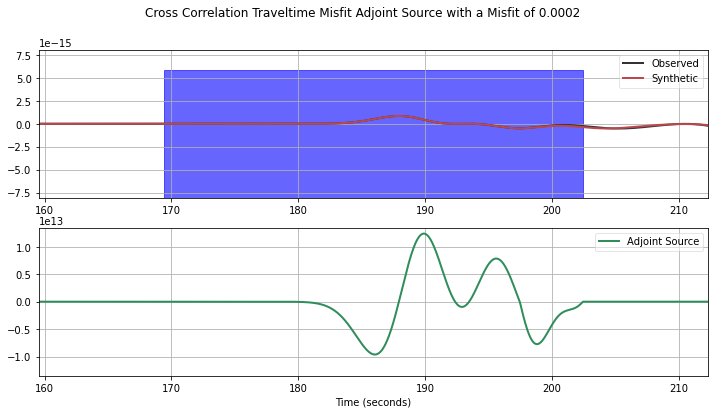

0.0002
[[177.153862641465, 210.153862641465]]
AA S0032


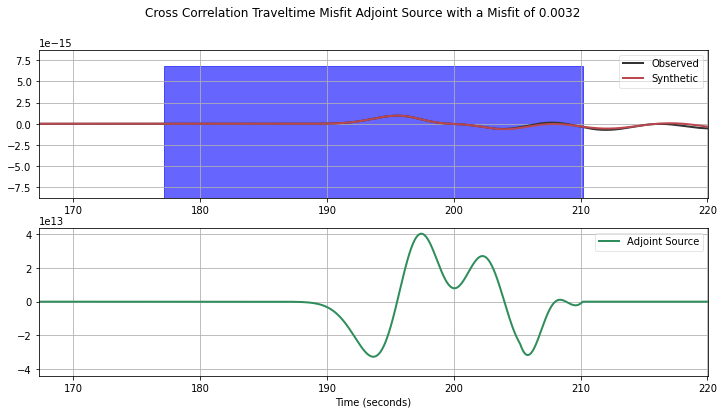

0.0032
[[184.78072567909774, 217.78072567909774]]
AA S0033


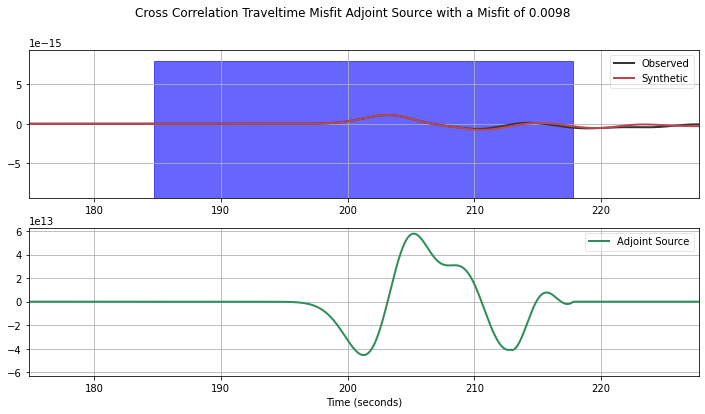

0.0098
[[192.31484962983203, 225.31484962983203]]
AA S0034


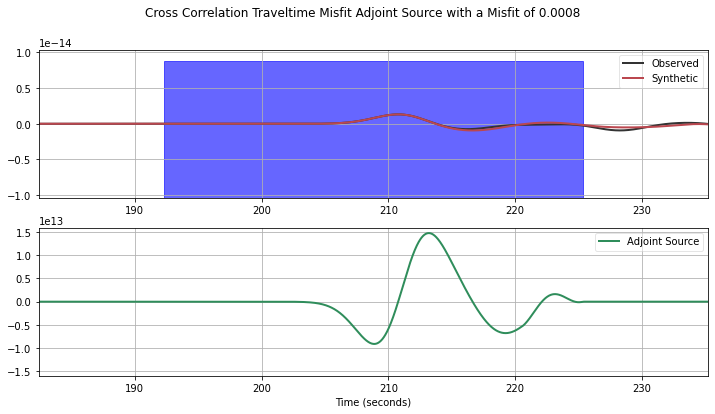

0.0008
[[199.7740494901571, 232.7740494901571]]
AA S0035


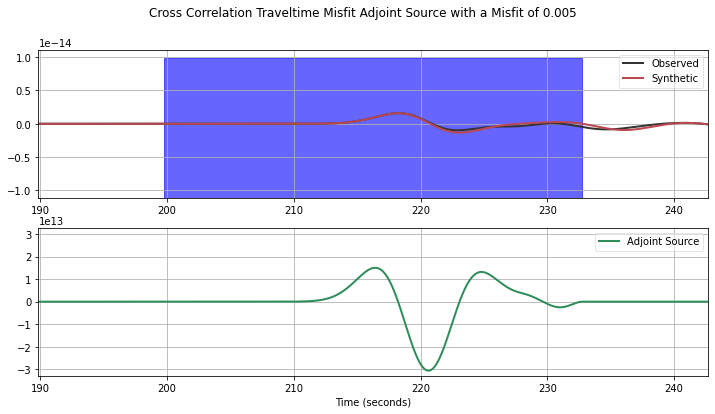

0.005
[[207.16049675570545, 240.16049675570545]]
AA S0036


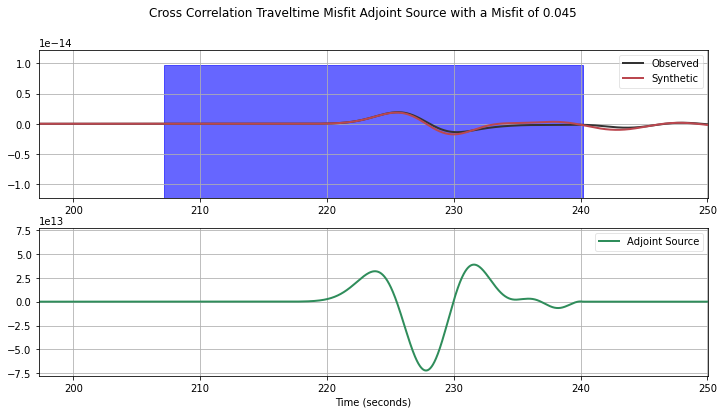

0.045
[[214.47473555261701, 247.47473555261701]]
AA S0037


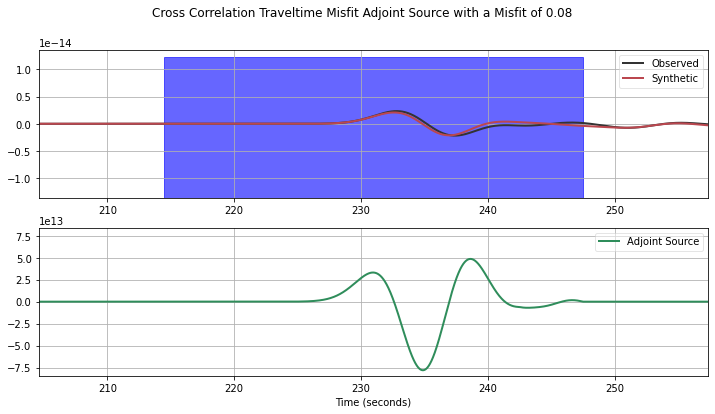

0.08
[[221.68205659134151, 254.68205659134151]]
AA S0038


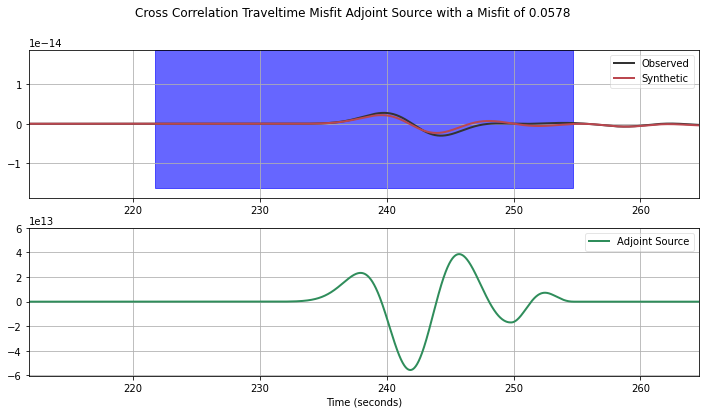

0.0578
[[228.20902223285583, 261.20902223285583]]
AA S0039


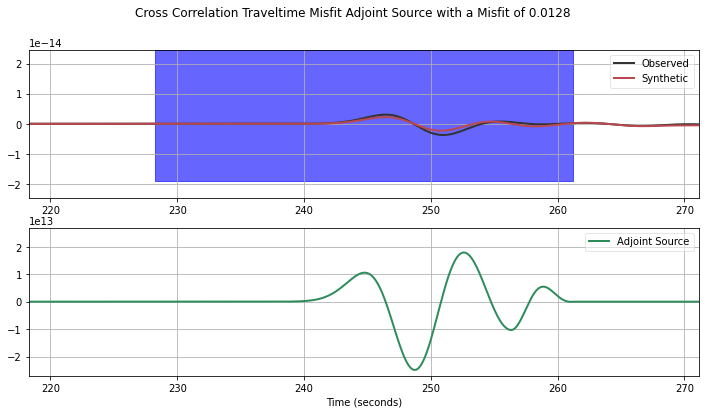

0.0128
[[234.71415717353179, 267.71415717353182]]
AA S0040


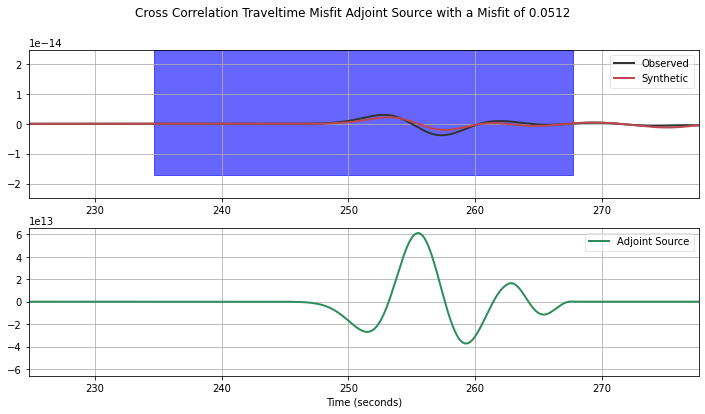

0.0512
[[241.19399721985735, 274.19399721985735]]
AA S0041


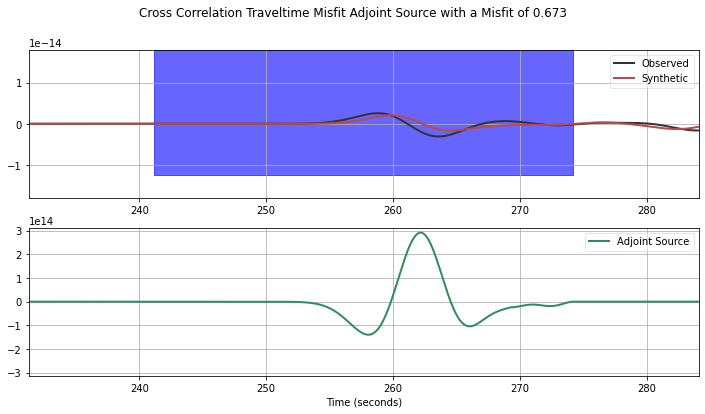

0.6728
[[247.64485079034847, 280.64485079034847]]
AA S0042


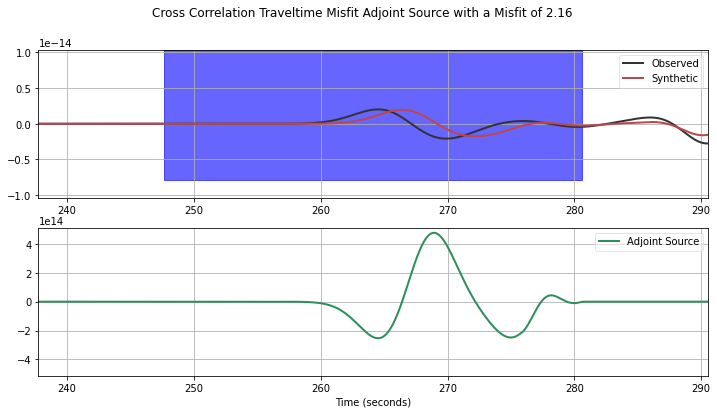

2.1632
[[254.06331299811671, 287.06331299811671]]
AA S0043


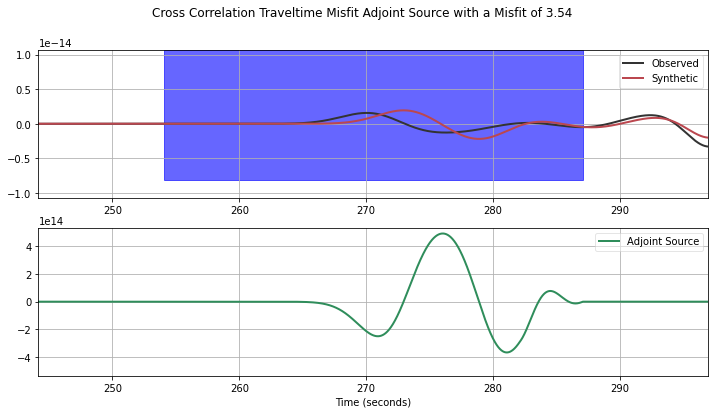

3.5378
[[260.44585462195107, 293.44585462195107]]
AA S0044


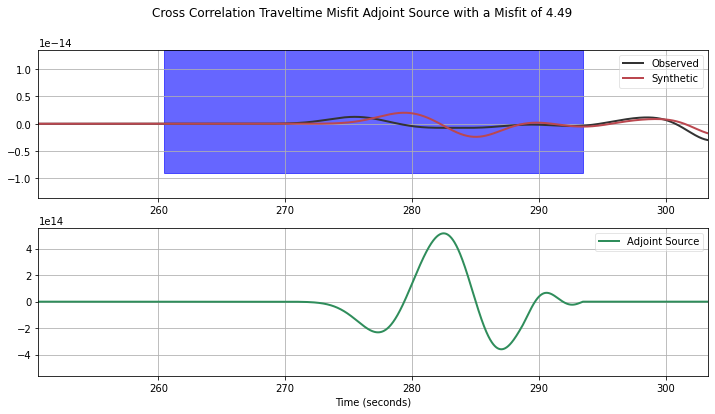

4.49394666565
[[266.78944300296473, 299.78944300296473]]
AA S0045


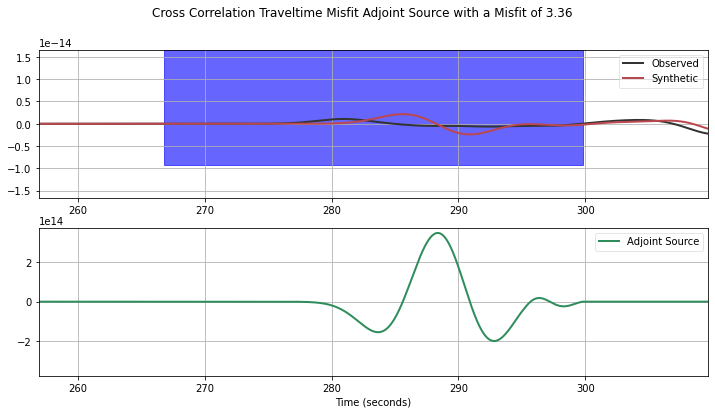

3.36413028159
[[273.09100161480694, 306.09100161480694]]
AA S0046


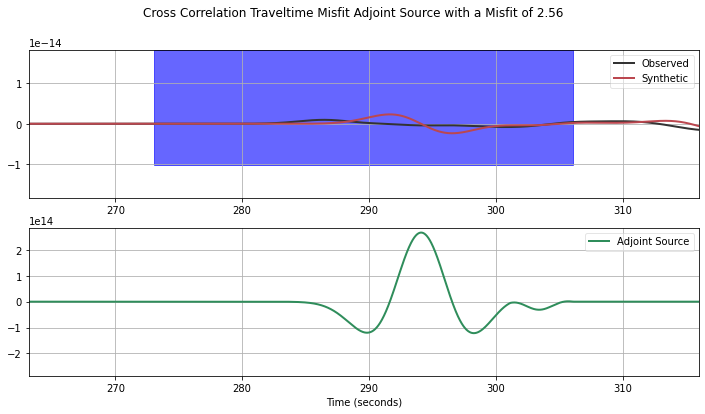

2.56115059549
[[279.34759765895694, 312.34759765895694]]
AA S0047


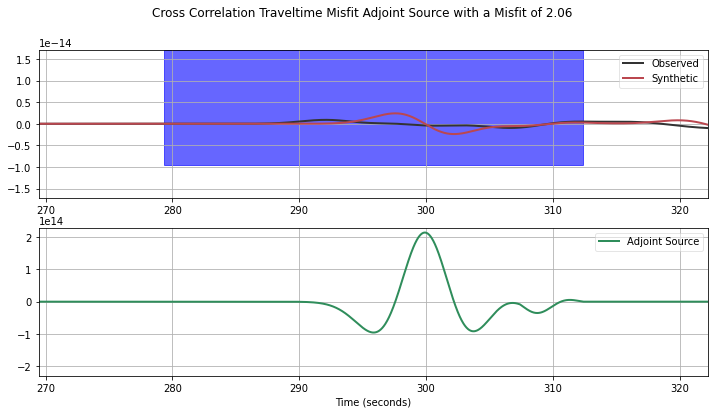

2.05819259165
[[285.15836469267606, 318.15836469267606]]
AA S0048


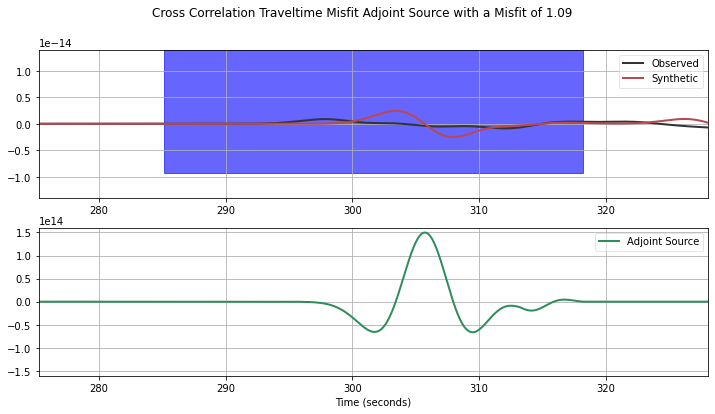

1.09269276919
[[290.57770898380215, 323.57770898380215]]
AA S0049


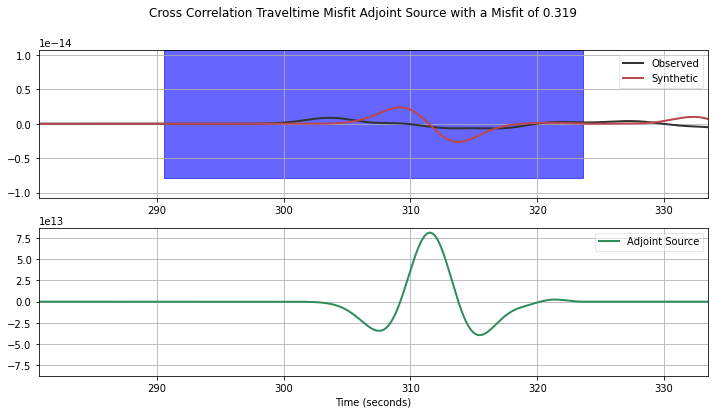

0.319226868283
[[295.98400646310421, 328.98400646310421]]
AA S0050


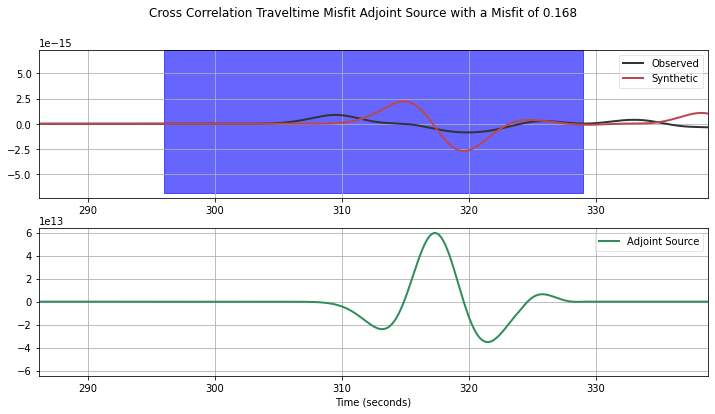

0.168329704836
[[301.37584373228822, 334.37584373228822]]
AA S0051


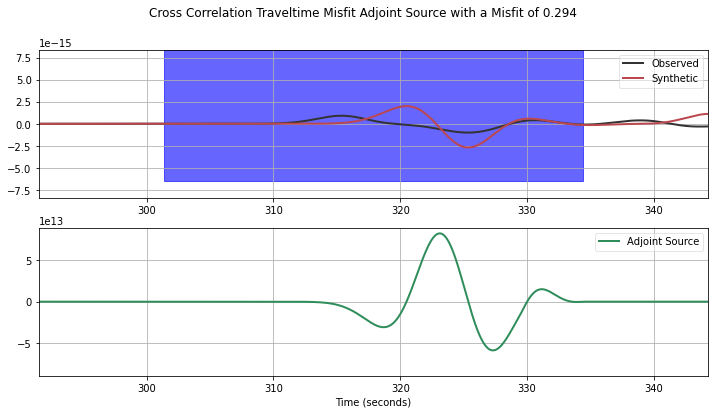

0.293963374518
[[306.75159987378356, 339.75159987378356]]
AA S0052


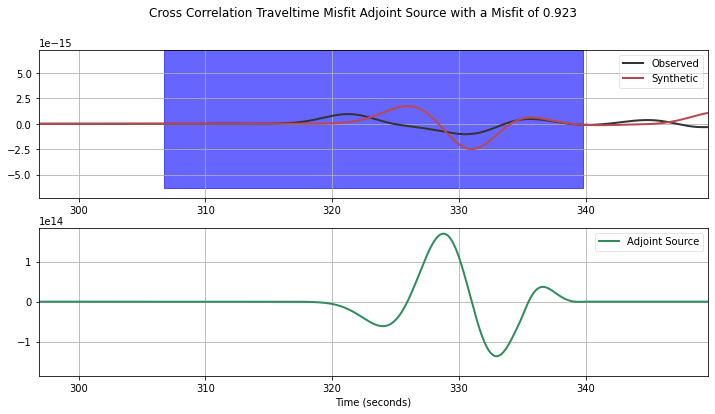

0.92323081931
[[312.11015066535856, 345.11015066535856]]
AA S0053


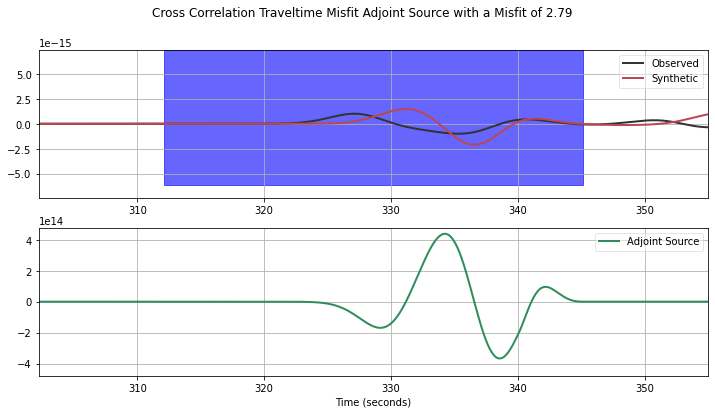

2.78857491198
[[317.44975731658263, 350.44975731658263]]
AA S0054


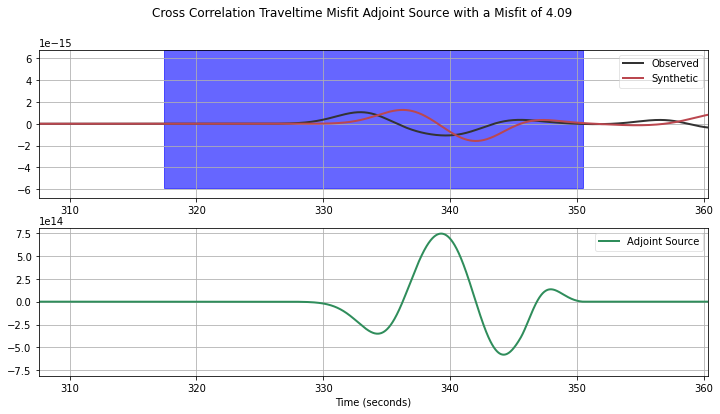

4.0898
[[322.76884768385122, 355.76884768385122]]
AA S0055


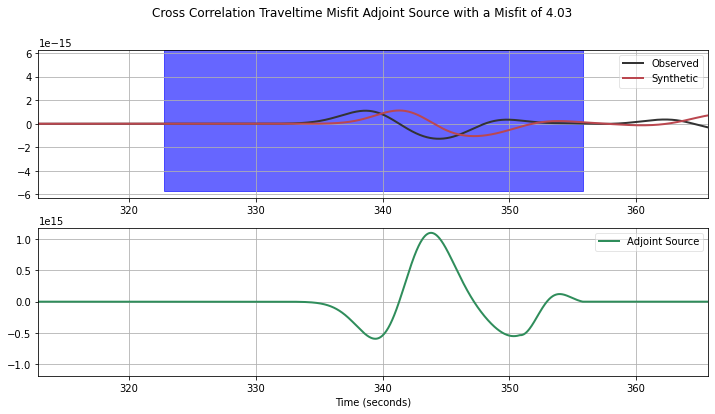

4.0328
[[328.06621508836622, 361.06621508836622]]
AA S0056


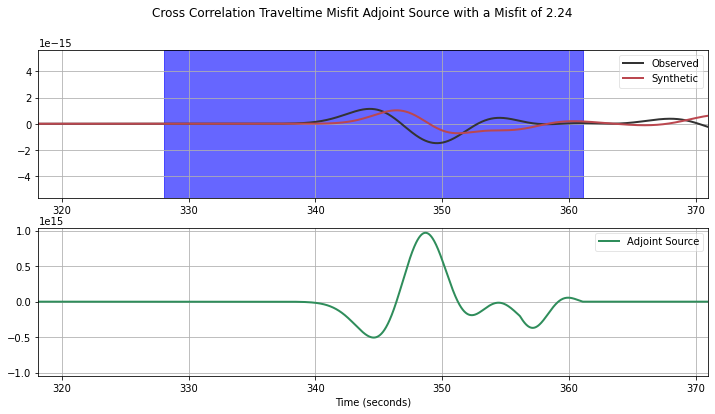

2.2434286785
[[333.34018092144828, 366.34018092144828]]
AA S0057


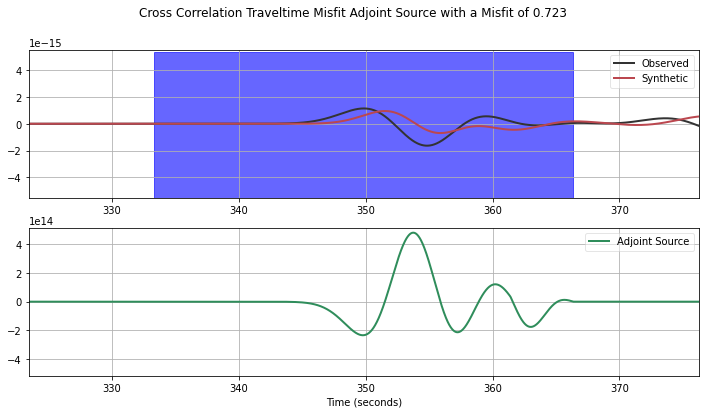

0.723052568804
[[338.59518015658455, 371.59518015658455]]
AA S0058


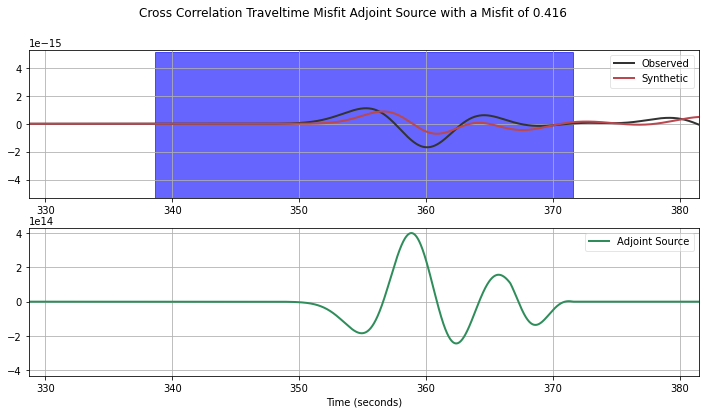

0.415553990962
[[343.84319620132919, 376.84319620132919]]
AA S0059


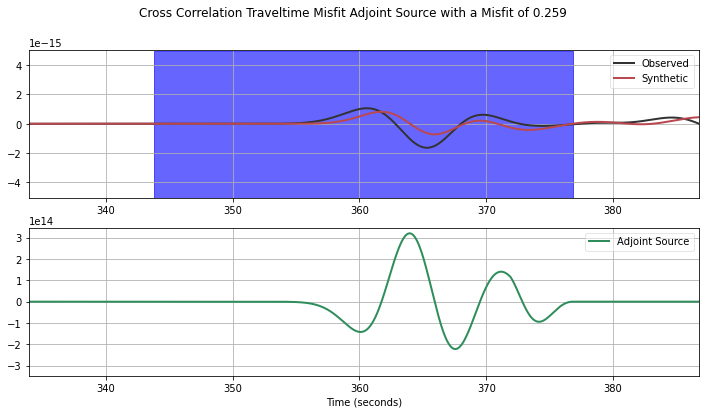

0.2592
[[349.08083668973751, 382.08083668973751]]
AA S0060


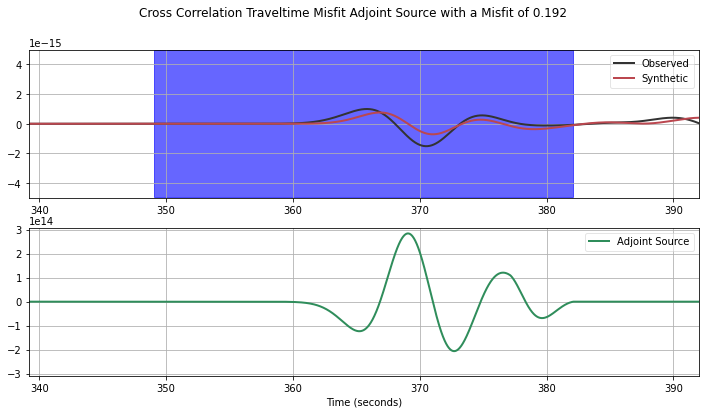

0.1922


In [3]:
PROJECT='/data2/yjgao/data/DATASET/package_forthesis/'
import numpy as np
import matplotlib.pyplot as plt
import os
list_events=['EVENT1']
for _i, event in enumerate(list_events):
    adj_calculate(PROJECT,event,'REF_SEM/','REF_SEM_SYN/','tf_phase_misfit.py')

In [3]:
import obspy
testtrace=obspy.read()[0]

In [4]:
testtrace

BW.RJOB..EHZ | 2009-08-24T00:20:03.000000Z - 2009-08-24T00:20:32.990000Z | 100.0 Hz, 3000 samples

In [5]:
from pyadjoint.timefrequency_utils import utils
t = testtrace.stats.starttime

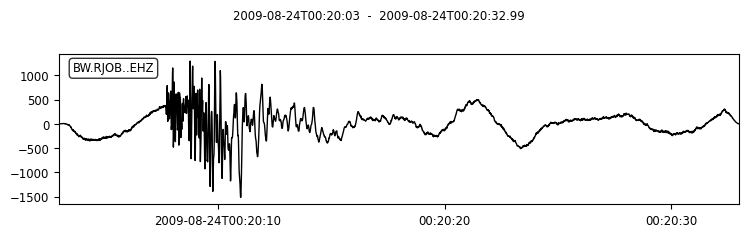

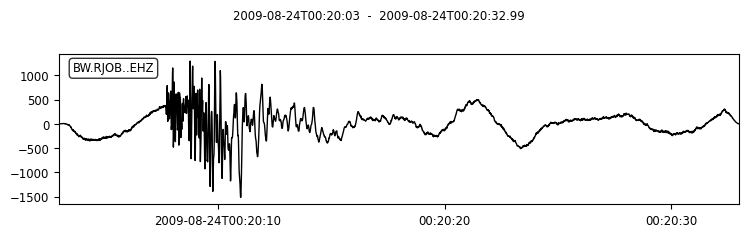

In [6]:
testtrace.plot()

In [7]:
testtrace1=testtrace.copy()
testtrace2=testtrace.copy()

In [8]:
ttt=utils.window_trace(testtrace1, window=[5,  10],taper=True, taper_ratio=0.15, taper_type="cosine")

2009-08-24T00:20:08.000000Z 2009-08-24T00:20:13.000000Z
True
BW.RJOB..EHZ | 2009-08-24T00:20:08.000000Z - 2009-08-24T00:20:13.000000Z | 100.0 Hz, 501 samples
0.15 cosine


In [66]:
window=[t + 5, t + 10]

In [12]:
ttt

BW.RJOB..EHZ | 2009-08-24T00:20:08.000000Z - 2009-08-24T00:20:13.000000Z | 100.0 Hz, 501 samples

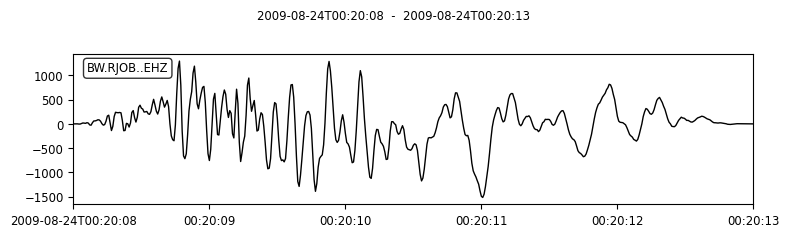

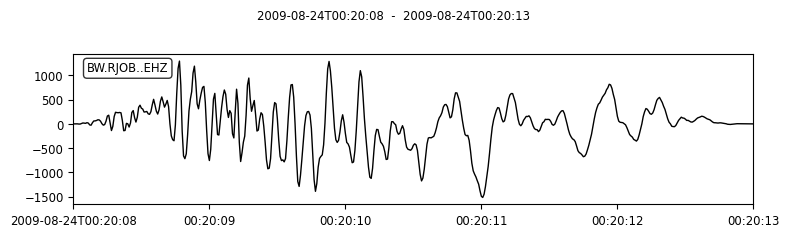

In [13]:
ttt.plot()

3000
501
501


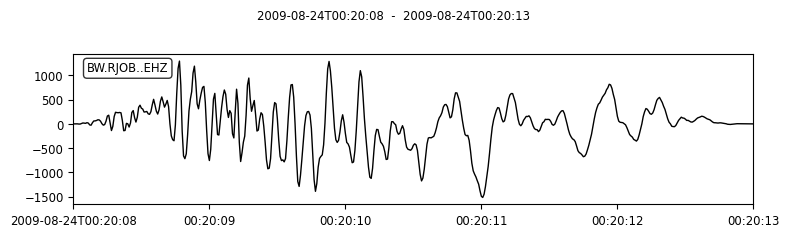

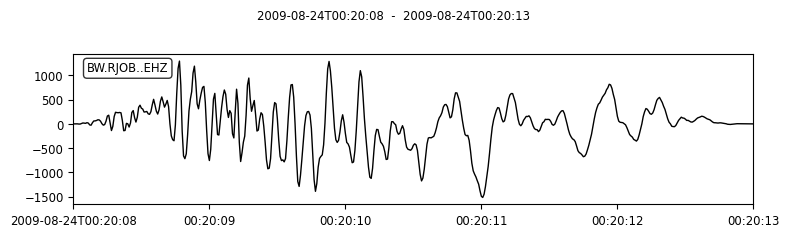

In [10]:
ttt2=utils.window_trace(testtrace2, window=[t + 5, t + 10],taper=True, taper_ratio=0.15, taper_type="cosine")
ttt2.plot()